<a href="https://colab.research.google.com/github/Prion6/BiomeGenerationTool/blob/main/Deep_Learning_AGN_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AGN Classification Using Deep Learning

*Author: [Gabriel K. Sepúlveda]*  
*Date: [May 27<sup>th</sup>, 2025]*


## Table of Contents

1. [Abstract](#abstract)
2. [Introduction](#introduction)
4. [Data](#data)
5. [Methodology](#methodology)
6. [Experiment and Results](#experiment--results)
7. [Discussion](#discussion)
8. [Conclusion](#conclusion)


## Abstract

**Background:** AGN drive galaxy evolution, detection important. Current methods use spectroscopy like BPT and Whan. Photometry more available than Spectroscopy. S-PLUS 12 bands survey.

**Goal:** Identification of AGNs through DL using 12 bans information from S-PLUS

**Methodology:**

**Results:**

**Conclusion:**


## Introduction



The light coming from the center of a galaxy is usually dominated by radiation from old star populations, known as a continuum. There are different phenomena that can cause a galaxy to present high emission lines at its center, such as an active galactic nucleus (AGN) {Mo 1010 Galaxy}.

An AGN refers to a supermassive black hole (SMBH) with a superheated accretion disk that emits high-intensity radiation across the whole spectrum. These objects have an impact on the evolution of their host galaxies and the intergalactic medium {Mo 2010 Galaxy}, making them objects of interest. However, only a fraction of galaxies present emission lines at their center, and a minority of those are AGNs. Hence, accurately detecting them becomes relevant.

The current state of the art in AGN detection is dominated by the Baldwin, Phillips, & Terlevich (BPT) and WHaN diagrams. The BPT diagram plots [O III] λ5007/Hβ against [N II] λ6584/Hα to distinguish between star-forming galaxies and those hosting AGN {Baldwin et al. 1981 Classification}. Meanwhile, the WHaN diagram utilizes the equivalent width of Hα and the [N II]/Hα ratio to classify galaxies as retired, star-forming, or AGN {Fernandez et al. 2011 A Comprehensive}.

Both methods present the limitation of requiring spectroscopic data, which is low in statistics. The WHaD diagram uses the equivalent width and velocity dispersion of Hα {Sanchez 2023 WHaD}. This approach lessens the burden on spectroscopic data but still cannot fully leverage the abundance of photometric data for AGN detection.

Among the efforts to increase the quantity and quality of photometric data is the Southern Photometric Local Universe Survey (S-PLUS), dedicated to mapping an extensive zone of the southern hemisphere. The highlight of the survey is its use of 12 filters—5 for wide bands and 7 for narrow bands—providing more information about the observed objects compared with other surveys {Herpich et al. 2024 The fourth}.

This research aims to use Deep Learning algorithms (DL) to differentiate between sources of emission lines at the center of galaxies using photometric data from the S-PLUS survey. As far as we know, the attempts at using DL for AGN classification are limited, and their approaches and data differ from our own {Chen et al. 2021 An active, Faisst et al. 2019 How to, cavuoti2014photometric}.

The paper is structured as follows: Section 2 presents and treats the data, Section 3 explains the methodology, results and discussions are presented in Section 4, and the paper concludes with final remarks and future work in Section 5.

Explication libraries importing

In [ ]:
!pip install -q gdown

In [ ]:
!pip install -q focal-loss

In [ ]:
#download data
import gdown

#basics
import pandas as pd
import numpy as np
import itertools

#Data preprocesing
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

#Model
from sklearn.ensemble import RandomForestClassifier
from keras import layers, models, Input, regularizers
from tensorflow.keras.callbacks import EarlyStopping
from focal_loss import BinaryFocalLoss, SparseCategoricalFocalLoss

#Training
from sklearn.model_selection import StratifiedKFold

#Ploting metrics
from sklearn.preprocessing import label_binarize
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns


#Imbalance Fixers
from sklearn.utils.class_weight import compute_class_weight
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

## Data

S-PLUS is a large-scale photometric survey aiming to cover a significant portion of the southern hemisphere. The particularity of S-PLUS is its use of twelve filters—five for wide bands and seven for narrow bands—designed to capture relevant information on crucial emission lines. The intensity detected in each of these bands serves as the input for our models.

The labels for the data come from a classification based on the BPT diagram. This process depends on spectroscopic data, which S-PLUS does not provide. To obtain the necessary spectroscopic data, we perform a crossmatch between the objects detected by S-PLUS and those in the Sloan Digital Sky Survey (SDSS).

Our dataset is composed of nearly forty thousand galaxies from Stripe 82, with redshifts around 0.4, labeled as Star Forming, Composite, LINER, or Seyfert. Galaxies without nuclear activity were removed from the dataset.

The dataset is divided into two files: the training file contains 75% of the samples, and the test file contains the remaining 25%, selected at random. Both files are available on Google Drive.

The catalog inclus more information than needed, we will extract the data from the S-PLUS filters and BPT diagram classification. We will ignore the part of the data contains missing values. The classification has a heavy imbalance towards the "StarForming" which will cause difficulties for the training. We use standard normalization to reduce te gradient in the model while maintaining the relevant information.

In [ ]:
train_data_url = "https://drive.google.com/uc?id=1Vc9ntRJhPkOICjNIoNShDgX2gmlO8_3s"

# Output filename after download
output = "AGN_train_dataset.csv"

# Download
gdown.download(train_data_url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1Vc9ntRJhPkOICjNIoNShDgX2gmlO8_3s
To: /content/AGN_train_dataset.csv
100%|██████████| 41.0M/41.0M [00:00<00:00, 113MB/s]


'AGN_train_dataset.csv'

In [ ]:
raw_df = pd.read_csv("AGN_train_dataset.csv")

In [ ]:
columns_list = raw_df.columns.tolist()

for c in columns_list:
    print(c)

z_
ra_
dec_
specobjid_
bpt_
plate_
mjd_
fiberid_
velStars_
redshift_
sigmaStars_
sigmaStarsErr_
bpt1_
ebmv_
ebmv_err_
Error_Warning_
V_Hb_4861_
V_Hb_4861_Err_
Sigma_Hb_4861_
Sigma_Hb_4861_Err_
Amplitude_Hb_4861_
Amplitude_Hb_4861_Err_
Flux_Hb_4861_
Flux_Hb_4861_Err_
EW_Hb_4861_
EW_Hb_4861_Err_
Flux_Cont_Hb_4861_
Flux_Cont_Hb_4861_Err_
Fit_Warning_Hb_4861_
AoN_Hb_4861_
V_OIII_5006_
V_OIII_5006_Err_
Sigma_OIII_5006_
Sigma_OIII_5006_Err_
Amplitude_OIII_5006_
Amplitude_OIII_5006_Err_
Flux_OIII_5006_
Flux_OIII_5006_Err_
EW_OIII_5006_
EW_OIII_5006_Err_
Flux_Cont_OIII_5006_
Flux_Cont_OIII_5006_Err_
Fit_Warning_OIII_5006_
AoN_OIII_5006_
V_OI_6300_
V_OI_6300_Err_
Sigma_OI_6300_
Sigma_OI_6300_Err_
Amplitude_OI_6300_
Amplitude_OI_6300_Err_
Flux_OI_6300_
Flux_OI_6300_Err_
EW_OI_6300_
EW_OI_6300_Err_
Flux_Cont_OI_6300_
Flux_Cont_OI_6300_Err_
Fit_Warning_OI_6300_
AoN_OI_6300_
V_NII_6547_
V_NII_6547_Err_
Sigma_NII_6547_
Sigma_NII_6547_Err_
Amplitude_NII_6547_
Amplitude_NII_6547_Err_
Flux_NII_6547_
Fl

In [ ]:
filter_columns = columns_list[-13:-1]

for c in filter_columns:
    print(c)

r_auto_dual
g_auto_dual
i_auto_dual
z_auto_dual
u_auto_dual
J0378_auto_dual
J0395_auto_dual
J0410_auto_dual
J0430_auto_dual
J0515_auto_dual
J0660_auto_dual
J0861_auto_dual


In [ ]:
filters_df = raw_df[filter_columns]

print(filters_df.head())

   r_auto_dual  g_auto_dual  i_auto_dual  z_auto_dual  u_auto_dual  \
0    18.059221    19.138220    17.799929    17.609266    20.331501   
1    19.099180    19.464617    18.835789    19.328856    22.207167   
2    20.645744    99.000000    20.784689    99.000000    99.000000   
3    20.169844    20.461510    19.668667    19.668160    20.846378   
4    17.337194    17.738092    17.121378    17.028843    18.899529   

   J0378_auto_dual  J0395_auto_dual  J0410_auto_dual  J0430_auto_dual  \
0        19.033210        99.000000        20.378538        18.836500   
1        20.129433        19.252743        19.887762        18.705313   
2        99.000000        99.000000        99.000000        99.000000   
3        22.080830        21.407051        20.726890        20.723452   
4        18.648508        18.023060        18.134981        17.902300   

   J0515_auto_dual  J0660_auto_dual  J0861_auto_dual  
0        19.024515        18.143986        17.736298  
1        19.922892        18.7

In [ ]:
labels_df = raw_df["bpt_"]

print(labels_df.head())


0    Star Forming
1    Star Forming
2    Star Forming
3       Composite
4    Star Forming
Name: bpt_, dtype: object


Data scrubing

In [ ]:
row_with_missing = filters_df == 99
missing_counts = row_with_missing.sum(axis=1)

# Create a dictionary where keys are counts from 12 to 1 and values are percentages
result = {f"{k}": ((missing_counts >= k).sum() / len(filters_df) * 100) for k in range(12, 0, -1)}

# Convert to single-row DataFrame
percentage_df = pd.DataFrame([result])
print(percentage_df)

         12        11        10         9         8         7         6  \
0  0.009993  0.016654  0.029978  0.039971  0.056625  0.079941  0.119912   

          5        4         3         2          1  
0  0.266471  0.52295  1.225768  3.877157  13.157018  


In [ ]:
# Encode and one-hot in one go
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels_df)

# Get class names, Important for graphs and reports
class_names = label_encoder.classes_
binary_class_names = ["Star Forming", "AGN"]

# Percentages as a one-row DataFrame
percentage_df = pd.DataFrame([np.bincount(labels) / len(labels) * 100])
print(percentage_df)

           0        1         2          3
0  12.970488  3.44081  2.198388  81.390314


In [ ]:
mask = ~(filters_df == 99).any(axis=1)  # True for rows without any 99s

# Apply the mask to filter both data and labels
clean_filters_data = filters_df[mask].reset_index(drop=True)
filters = clean_filters_data.to_numpy()
labels = labels[mask]

In [ ]:
scaler = StandardScaler()
filters = scaler.fit_transform(filters)

## Methodology

We follow an exploratory experimental approach, testing different neural network architectures, regularizations, and feature engineering techniques. For this first testing round, we limit ourselves to rough adjustments rather than fine-tuning, as our objective is to determine the potential of neural networks in AGN classification using the S-PLUS data more than finding an optimized model.

We start by defining a baseline using a simple Random Forest. To compare memory usage between models and the baseline, we use the memory size of the nodes in all trees.

We then check if the proposed models are capable of overfitting the data to ensure they have enough capacity to learn the relation between input and output. Due to the large imbalance of the data classes, we use sparse categorical focal-loss as the loss function. We run the training for 30 epochs with an 8:2 training-validation split and plot the loss value curves in validation and training to measure overfitting.

Once the architectures pass the first test, we run a K-fold validation to ensure model generalization and extract the best-performing options. We use early stopping with five steps to reduce training burden. For this report, we decided not to include the tests done with weighted, undersampled, or oversampled data. We then test L2 and dropout regularizations to search for improvements in the results.

To test the model, we use ROC curves and a confusion matrix to extract information on classification probability and actual classification results, allowing us to measure the performance of our model. Comparing the results between them provides insights into probable issues our neural network may present.

We perform the tests using only the data from the wide band filters, as their use is standardized and they are present in several surveys besides S-PLUS. Therefore, a model capable of classifying AGNs using data just from wide band filters has a higher chance of reusability with external data.

Feature engineering is performed according to the physical context of the problem. We combine the filters through subtraction of bluer with redder filters. This process is executed for all twelve filters as well as the subset of five wide band filters. We check the performance of the models over the following inputs: color calculation with twelve filters, wide band filters, and color calculation with wide band filters.

As an additional measure, we decided to also evaluate the proficiency of our models in classifying Star Forming and others. This is because our labels come from a BPT diagram, which has issues in separating Seyferts and Composites. Additionally, a photometric approach may have difficulties differentiating AGN types, and our data is heavily imbalanced, complicating multiclass classification. We maintain the use of sparse categorical focal-loss as the objective function, as there is no difference between categorical cross-entropy for two classes and binary cross-entropy.

We take two approaches to test the binary classification. The first is to perform a normal multiclass classification and then group the results into Star Forming and AGNs (Composite, Seyfert, and LINER). The second approach is to group the data before processing it in the model and perform binary classification. We use the same architectures for both approaches.

Finally, we check the proficiency of our models in multiclass classification with custom thresholds and our first approach for binary classification.

During the experiments, we use a set of 20% of the data from the training file to measure model performance. We use the test file to show the performance of the final chosen model on unseen data.



In [ ]:
def random_forest_summary(rf_model):
    # Number of trees
    n_trees = len(rf_model.estimators_)

    # Get number of nodes in each tree
    node_counts = [estimator.tree_.node_count for estimator in rf_model.estimators_]

    min_nodes = np.min(node_counts)
    max_nodes = np.max(node_counts)
    avg_nodes = np.mean(node_counts)

    # Estimate memory usage in MB (approximate: model size + trees)
    total_memory_bytes = sum(estimator.tree_.__sizeof__() for estimator in rf_model.estimators_)
    total_memory_kb = total_memory_bytes / (1024)

    # Display summary
    print(f"Random Forest Summary:")
    print(f"- Number of Trees      : {n_trees}")
    print(f"- Nodes per Tree       : min = {min_nodes}, max = {max_nodes}, avg = {avg_nodes:.2f}")
    print(f"- Approx. Memory Usage : {total_memory_kb:.2f} KB")

In [ ]:
def k_fold_train(model, train_fn, filters, labels, n_splits=5, epochs=30, batch_size=32):

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    histories = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(filters, labels), start=1):
        print("\n Fold: ", fold, "/", n_splits)

        X_train, X_val = filters[train_idx], filters[val_idx]
        y_train, y_val = labels[train_idx], labels[val_idx]

        history = train_fn(model, X_train, y_train, X_val, y_val, epochs, batch_size)
        histories.append(history)

    return histories

In [ ]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=2,
    restore_best_weights=True
    )

In [ ]:
def train_raw(model, X_train, y_train, X_val, y_val, epochs=30, batch_size=32):
  history = model.fit(X_train, y_train,
                      epochs=epochs, batch_size=batch_size,
                      validation_data=(X_val, y_val),
                      callbacks=[early_stopping])

  return history

In [ ]:
def plot_loss(history, title):
    # Plot the loss curve for both train and validation
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.savefig(title + " loss")
    plt.show()

In [ ]:
def plot_ROC(y_pred_prob, y_true, class_names, title="ROC Curve"):
    n_classes = len(class_names)

    # Flatten one-hot labels if needed
    if y_true.ndim > 1 and y_true.shape[1] > 1:
        y_true = np.argmax(y_true, axis=1)

    # Binary classification case
    if n_classes == 2:
        # Fix shape of predictions if needed
        if y_pred_prob.ndim == 1:
            y_score = y_pred_prob
        elif y_pred_prob.shape[1] == 1:
            y_score = y_pred_prob[:, 0]
        else:
            y_score = y_pred_prob[:, 1]  # Positive class probs

        fpr, tpr, _ = roc_curve(y_true, y_score)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, label=f"{class_names[1]} (AUC = {roc_auc:.2f})")
        plt.plot([0, 1], [0, 1], 'k--', label="Random Chance")
        plt.title(title)
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # Multiclass case
    else:
        y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))

        # Adjust prediction shape if binary-style output passed in multiclass case
        if y_pred_prob.ndim == 1 or y_pred_prob.shape[1] != n_classes:
            raise ValueError("Mismatch between number of classes and predicted probabilities shape.")

        plt.figure(figsize=(10, 6))
        for i in range(n_classes):
            fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], 'k--', label="Random Chance")
        plt.title(title)
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [ ]:
def plot_confusion_matrix(confusion_matrix, labels, title =""):

    cm_percent = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis] * 100  # row-wise normalization

    # Create annotation labels: count (percentage)
    annot = np.empty_like(confusion_matrix).astype(str)
    for i in range(confusion_matrix.shape[0]):
        for j in range(confusion_matrix.shape[1]):
            annot[i, j] = f"{confusion_matrix[i, j]}\n({cm_percent[i, j]:.1f}%)"

    # Plot
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix, annot=annot, fmt='', cmap='Blues',
                xticklabels=labels, yticklabels=labels)

    plt.title(f'Confusion Matrix - {title}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig(title + " Confusion Matrix")
    plt.show()


In [ ]:
def test_model(y_pred, Y_test, class_names):

  plot_ROC(y_pred, Y_test, class_names)

  y_pred = np.argmax(y_pred, axis=1)

  print("Accuracy:", accuracy_score(Y_test, y_pred))


  cm = confusion_matrix(Y_test, y_pred)

  plot_confusion_matrix(cm, class_names)

  print("Classification Report:\n", classification_report(Y_test, y_pred, target_names=class_names))

  if len(class_names) > 2:
    y_b_true, y_b_pred = merge_agn_classes(cm)

    b_cm = confusion_matrix(y_b_true, y_b_pred)

    plot_confusion_matrix(b_cm, binary_class_names)

    print("Binary Classification Report:\n", classification_report(y_b_true, y_b_pred, target_names=binary_class_names))

In [ ]:
def combine_filters(filters, filter_names):

  # Generate all unique combinations (i < j) for subtraction: color_i - color_j
  combinations = list(itertools.combinations(range(len(filter_names)), 2))

  filter_combinations = np.array([filters[:, i] - filters[:, j] for i, j in combinations]).T

  filter_combinations_names = [f"{filter_names[i]} - {filter_names[j]}" for i, j in combinations]

  return filter_combinations, filter_combinations_names

In [ ]:
def merge_agn_classes(conf_matrix):
    """
    Merges a 4-class confusion matrix into a binary one:
    Class 0 = Star Forming
    Class 1 = AGN (Composite + LINER + Seyfert)
    """
    # Sanity check
    if conf_matrix.shape != (4, 4):
        raise ValueError("Expected a 4x4 confusion matrix.")

    # Indices: 0 = Composite, 1 = LINER, 2 = Seyfert, 3 = Star Forming
    agn_rows = conf_matrix[0:3, :]
    sf_row = conf_matrix[3, :]

    # True Star Forming predictions
    sf_true_sf = sf_row[3]
    sf_true_agn = sf_row[0:3].sum()

    # True AGN predictions
    agn_true_sf = agn_rows[:, 3].sum()
    agn_true_agn = agn_rows[:, 0:3].sum()

    # Build flat y_true and y_pred arrays
    y_true = [0]*(sf_true_sf + sf_true_agn) + [1]*(agn_true_sf + agn_true_agn)
    y_pred = [0]*sf_true_sf + [1]*sf_true_agn + [0]*agn_true_sf + [1]*agn_true_agn

    return y_true, y_pred

Through the tests, we observed disparity in the results of the ROC curves and confusion matrices, indicating an issue when selecting the class based on the probability output of the model.

To visualize the outputs, we separate the samples by class, calculate the average and standard deviation of the selection probabilities produced by our model, and plot the data in bar graphs for each class.

From the data on the output probabilities of the models, we implement a class selection protocol based on custom thresholds. While custom thresholds are already present in the literature, we use a new approach where, instead of imposing thresholds for each class independently, we apply them to the probability distribution of the model output for each class.

Our approach defines, as constraints for each class, an array of directional thresholds that the output must fulfill for the sample to be assigned to the corresponding class. The threshold directionality indicates whether the probability of belonging to a class must be above or below the threshold.

This approach allows a sample to either satisfy multiple constraints or none of them. We create a list of candidate classes for which the constraints were fulfilled. In the case that no constraints are satisfied, all classes are considered candidates. Then, we calculate the distance between the probability distribution of the sample and the constraints of the candidate classes and select the class with the lowest distance. In the unlikely event that more than one candidate class has the same minimum distance from the sample, we fall back to selecting the one with the highest probability according to the sample’s output.

We believe this approach is useful when trying to classify phenomena that are closely related or behave similarly given the input, as is the case with AGNs and their photometry.



In [ ]:
def plot_avg_softmax_per_true_class(y_true, y_pred_prob, class_names):
    """
    For each true class, plot the average predicted probabilities to each class
    with standard deviation bars. Annotates bars with mean ± std.
    """
    num_classes = len(class_names)
    y_true = np.array(y_true)
    y_pred_prob = np.array(y_pred_prob)

    plt.figure(figsize=(8, 5))

    for i in range(num_classes):
        # Filter rows where the true class is class i
        mask = y_true == i
        class_probs = y_pred_prob[mask]  # shape: (samples, num_classes)

        # Compute mean and std for each predicted class
        means = class_probs.mean(axis=0)
        stds = class_probs.std(axis=0)

        ax = plt.subplot(2, 2, i+1)
        bars = ax.bar(class_names, means, yerr=stds, capsize=5, color='skyblue', edgecolor='black')
        ax.set_ylim(0, 1)
        ax.set_title(f"True Class: {class_names[i]}")
        ax.set_ylabel("Average Predicted Probability")
        ax.set_xlabel("Predicted Class")

        # Annotate bars with mean ± std
        for j, bar in enumerate(bars):
            mean = means[j]
            std = stds[j]
            height = bar.get_height()
            label = f"{mean:.2f} ± {std:.2f}"
            ax.text(bar.get_x() + bar.get_width()/2, height + 0.02, label,
                    ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


In [ ]:
def predict_with_thresholds(y_pred_prob, threshold_rules):
  n_samples, n_classes = y_pred_prob.shape
  preds = []
  candidates_list = []

  for i in range(n_samples):
    probs = y_pred_prob[i]
    tests = []

    for j in range(n_classes):
      constraints = threshold_rules[j]

      distance = 0
      passed = 0
      for k in range(n_classes):
        threshold, sign = constraints[k]
        distance += abs(probs[k] - threshold)
        condition = sign * (probs[k] - threshold)
        if condition >= 0:
            passed += 1

      all_passed = passed == n_classes
      tests.append([j, all_passed, distance])

    # Filter classes where all constraints passed
    candidates = [test for test in tests if test[1]]

    # If no candidates passed all constraints, use all classes
    if not candidates:
        candidates = tests

    min_dist = min(candidates, key=lambda x: x[2])[2]
    tied = [x for x in candidates if x[2] == min_dist]
    best = max(tied, key=lambda x: probs[x[0]])[0]

    preds.append(best)

  return preds

## Experiments and Result


We do a 8:2 data stratified separation to have a test set to meassure performance during the experiments that *maintains* the same imbalance in the data.

In [ ]:
#Reserve 20% for intermediate testing
X_train, X_test, y_train, y_test = train_test_split(filters, labels, test_size=0.2, random_state=42, stratify=labels)

## Base Line

A common-sense baseline for the data is an algorithm that always classifies the input as Star Forming. Such an algorithm would have an accuracy of approximately 81.39% due to the imbalance of the data. Since our focus is to accurately select the galaxies that have an AGN, this baseline defeats our purpose and could be ignored. Still, it provides insight into the accuracy we should aim to surpass.

To have a better example of a lower bound for a machine learning approach, we use a simple Random Forest with one hundred estimators. This approach provides a lightweight model with a memory usage of approximately 10.16 KB in exchange for having around 432,708 nodes to adjust.

The model is capable of surpassing the common-sense baseline by about 3%. However, as we initially suspected, the model has issues classifying Composite, Seyfert, and LINER galaxies and tends to over-predict Star Forming. Seyfert and LINER galaxies are mostly classified as Composite or Star Forming, with Seyfert being the most problematic. When inspecting the results of the first binary approach, we observe a low number of contaminants in the AGN classification with a precision/purity of 75%, but a high number of AGNs are misclassified.



In [ ]:
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
random_forest_summary(rf_clf)

Random Forest Summary:
- Number of Trees      : 100
- Nodes per Tree       : min = 4205, max = 4467, avg = 4327.08
- Approx. Memory Usage : 10.16 KB


Accuracy: 0.8387344199424737


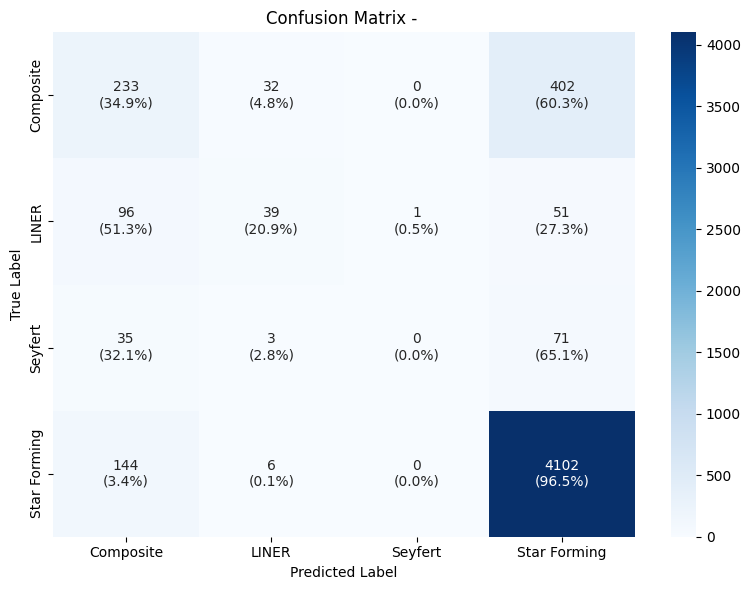

Classification Report:
               precision    recall  f1-score   support

   Composite       0.46      0.35      0.40       667
       LINER       0.49      0.21      0.29       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.89      0.96      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.46      0.38      0.40      5215
weighted avg       0.80      0.84      0.81      5215



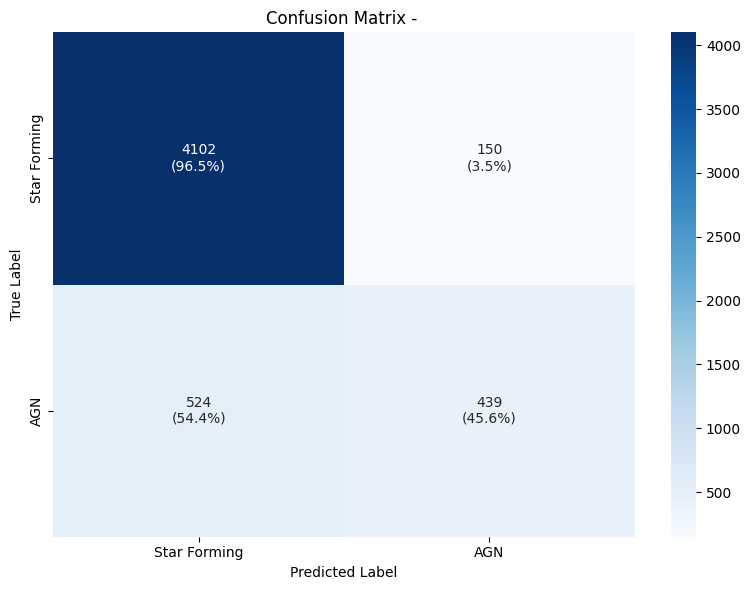

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.92      4252
         AGN       0.75      0.46      0.57       963

    accuracy                           0.87      5215
   macro avg       0.82      0.71      0.74      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = rf_clf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(cm, class_names)

print("Classification Report:\n", classification_report(y_test, y_pred, target_names=class_names))

y_b_true, y_b_pred = merge_agn_classes(cm)

b_cm = confusion_matrix(y_b_true, y_b_pred)

plot_confusion_matrix(b_cm, binary_class_names)

print("Binary Classification Report:\n", classification_report(y_b_true, y_b_pred, target_names=binary_class_names))


## Overfitting

We start by testing overfitting in four architectures: light contractive, heavy contractive, autoencoder, and inverse autoencoder, in that order. The light and heavy contractive models allow us to compare the effects of depth versus the number of filters, while the autoencoder and inverse autoencoder help gain insights into how changes in the feature space may affect the solution.

Results show that all models are capable of overfitting, reaching accuracies close to the Random Forest baseline. The architectures present similar performance, with training loss values around 0.18, except for the inverse autoencoder, which reaches 0.16 or lower.

In [ ]:
def get_classification_model(input, layer_filters, classes):

    inputs = Input(shape=(input.shape[1],))

    x = inputs
    for lf in layer_filters:
        x = layers.Dense(lf, activation='relu')(x)

    # Output layer
    outputs = layers.Dense(len(np.unique(classes)), activation='softmax')(x)

    # Define model
    model = keras.models.Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
model = get_classification_model(X_train, [256, 128, 64, 32, 16, 8], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,260 (184.61 KB)

 Trainable params: 47,260 (184.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_split=0.2)

Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.8139 - loss: 0.3027 - val_accuracy: 0.8233 - val_loss: 0.2109
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8298 - loss: 0.2151 - val_accuracy: 0.8303 - val_loss: 0.2060
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8356 - loss: 0.2042 - val_accuracy: 0.8344 - val_loss: 0.2086
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8372 - loss: 0.1993 - val_accuracy: 0.8277 - val_loss: 0.2081
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8370 - loss: 0.1989 - val_accuracy: 0.8363 - val_loss: 0.1978
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8335 - loss: 0.2022 - val_accuracy: 0.8281 - val_loss: 0.2020
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8412 - loss: 0.1928 - val_accuracy: 0.8360 - val_loss: 0.1959
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8333 - loss: 0.1979 - val_accuracy: 0.

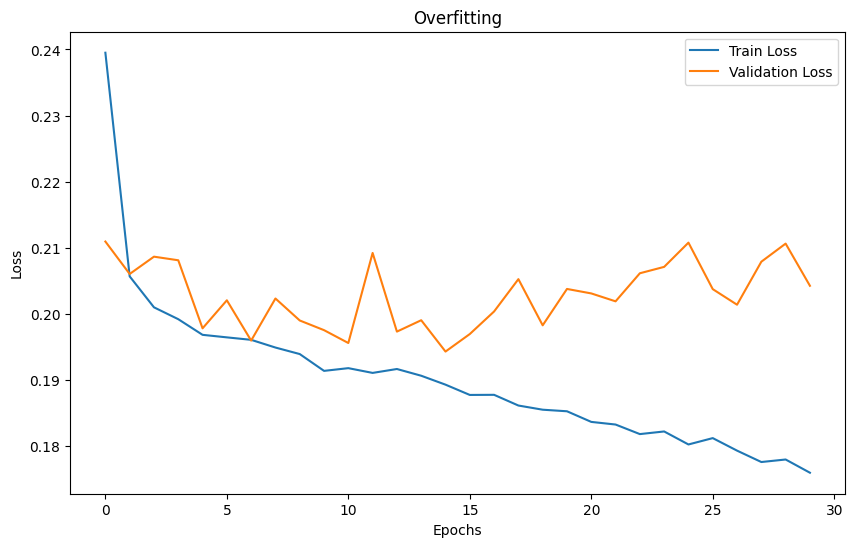

In [ ]:
plot_loss(history, "Overfitting")

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


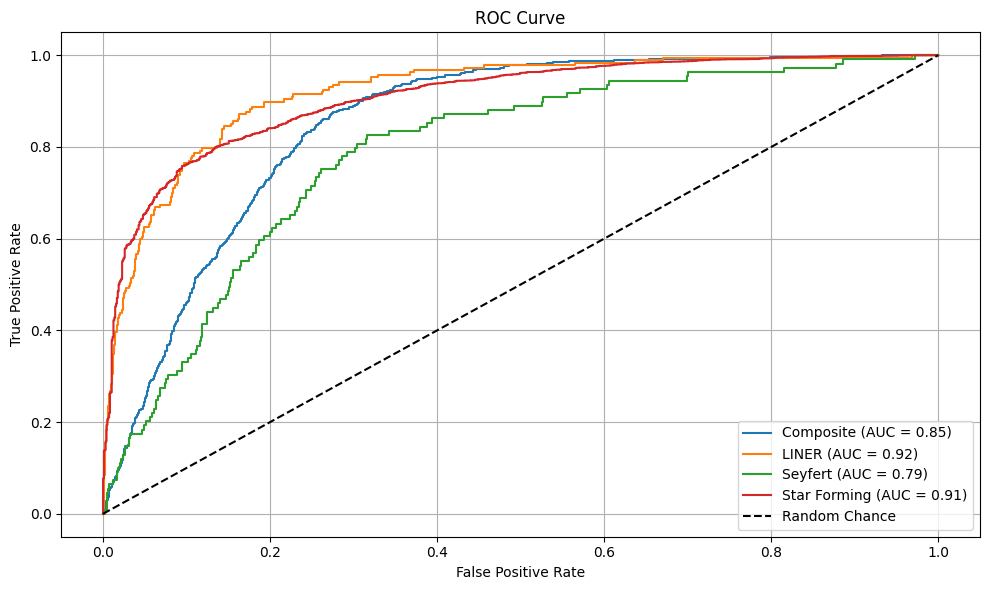

Accuracy: 0.8402684563758389


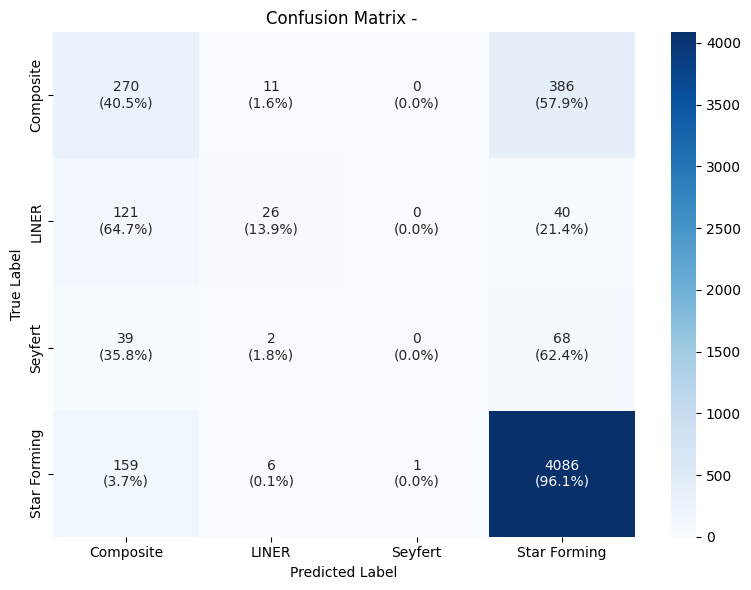

Classification Report:
               precision    recall  f1-score   support

   Composite       0.46      0.40      0.43       667
       LINER       0.58      0.14      0.22       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.89      0.96      0.93      4252

    accuracy                           0.84      5215
   macro avg       0.48      0.38      0.39      5215
weighted avg       0.81      0.84      0.82      5215



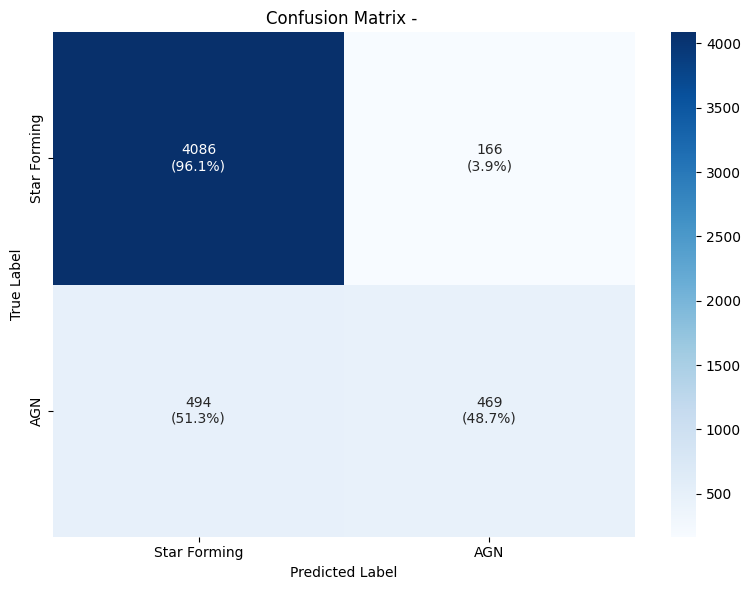

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.93      4252
         AGN       0.74      0.49      0.59       963

    accuracy                           0.87      5215
   macro avg       0.82      0.72      0.76      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model(X_train,[1024, 512, 256],class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1024)           │        13,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 670,468 (2.56 MB)

 Trainable params: 670,468 (2.56 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_split=0.2)

Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.8148 - loss: 0.2584 - val_accuracy: 0.8293 - val_loss: 0.2004
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8328 - loss: 0.2007 - val_accuracy: 0.8334 - val_loss: 0.2024
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8390 - loss: 0.1975 - val_accuracy: 0.8358 - val_loss: 0.1997
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8390 - loss: 0.2007 - val_accuracy: 0.8317 - val_loss: 0.2097
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8390 - loss: 0.1936 - val_accuracy: 0.8346 - val_loss: 0.2083
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8394 - loss: 0.1950 - val_accuracy: 0.8344 - val_loss: 0.1973
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8379 - loss: 0.1917 - val_accuracy: 0.8257 - val_loss: 0.2148
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8394 - loss: 0.1944 - val_accuracy: 0

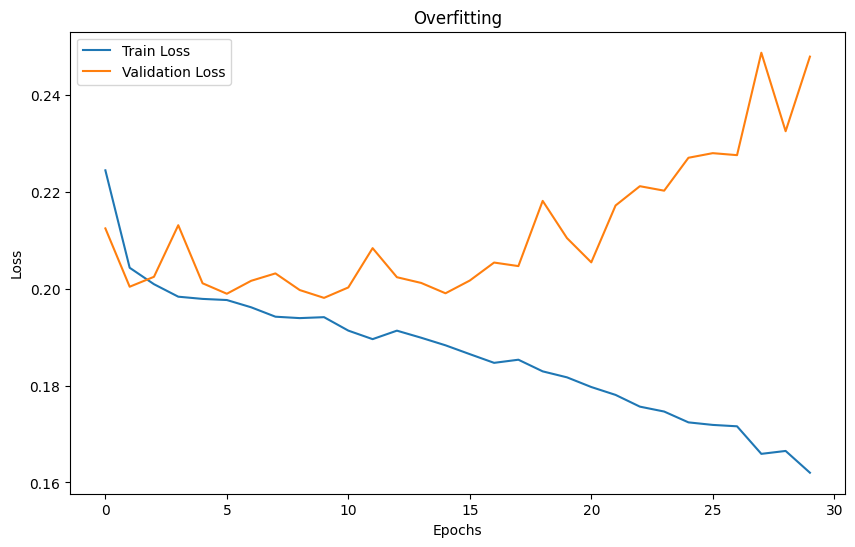

In [ ]:
plot_loss(history, "Overfitting")

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


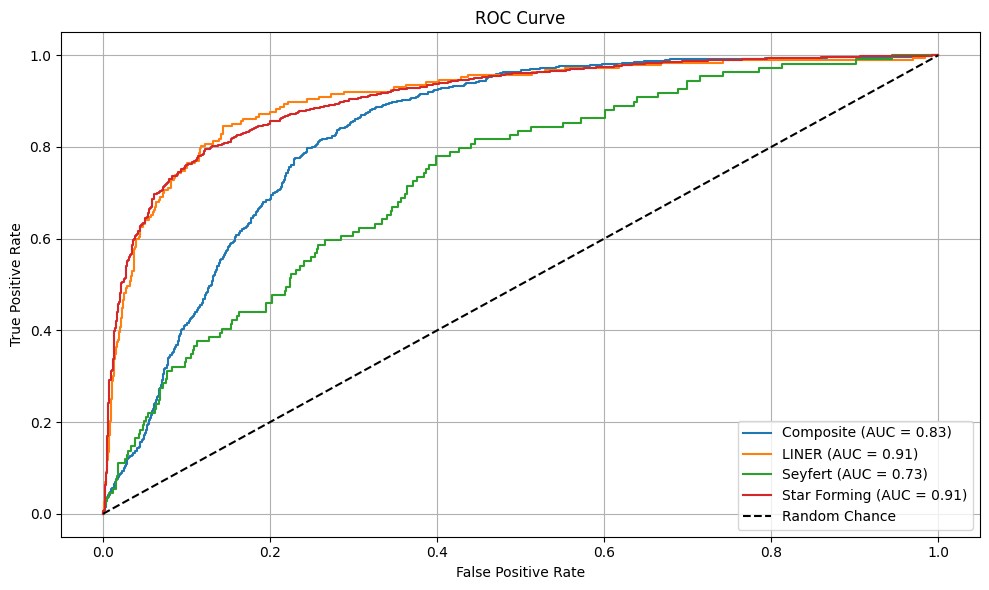

Accuracy: 0.836241610738255


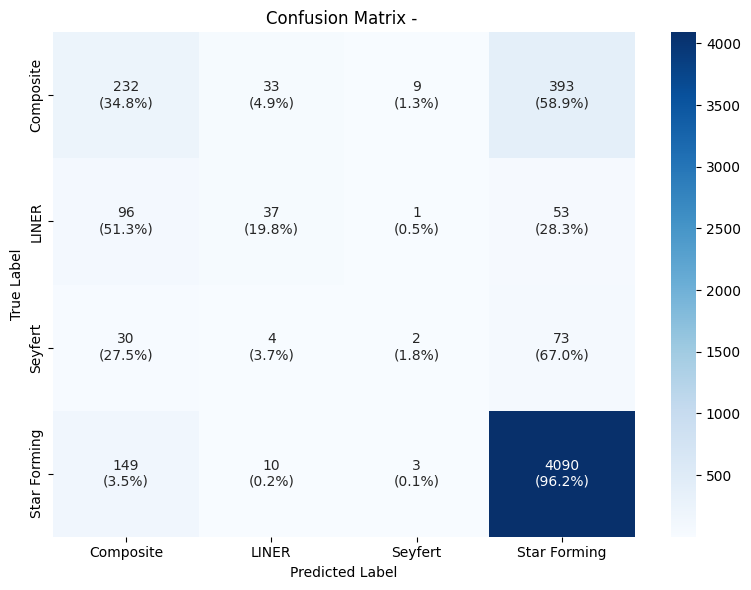

Classification Report:
               precision    recall  f1-score   support

   Composite       0.46      0.35      0.40       667
       LINER       0.44      0.20      0.27       187
     Seyfert       0.13      0.02      0.03       109
Star Forming       0.89      0.96      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.48      0.38      0.41      5215
weighted avg       0.80      0.84      0.81      5215



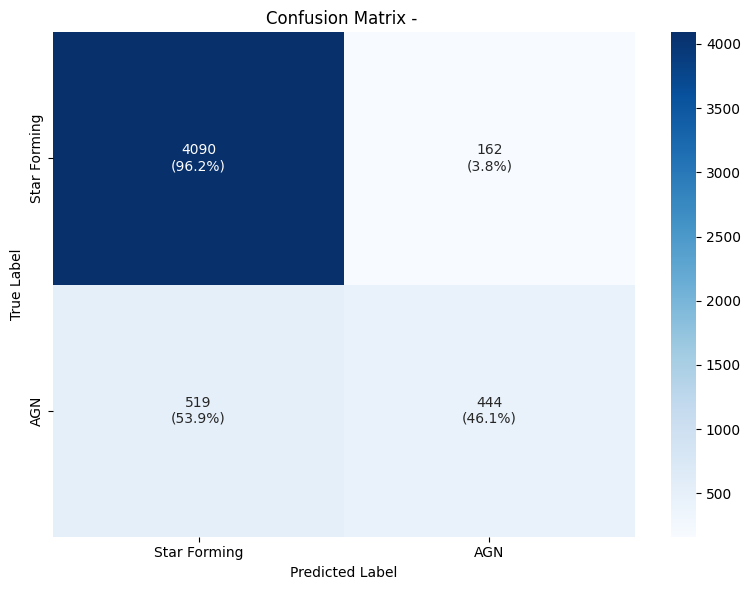

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.92      4252
         AGN       0.73      0.46      0.57       963

    accuracy                           0.87      5215
   macro avg       0.81      0.71      0.74      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model(X_train, [512,256,128,256,512], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 512)            │         6,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 337,540 (1.29 MB)

 Trainable params: 337,540 (1.29 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_split=0.2)

Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.8125 - loss: 0.2599 - val_accuracy: 0.8186 - val_loss: 0.2368
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8295 - loss: 0.2079 - val_accuracy: 0.8327 - val_loss: 0.1994
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8360 - loss: 0.2037 - val_accuracy: 0.8325 - val_loss: 0.2069
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8359 - loss: 0.2010 - val_accuracy: 0.8281 - val_loss: 0.2035
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8346 - loss: 0.2007 - val_accuracy: 0.8281 - val_loss: 0.2131
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8381 - loss: 0.2001 - val_accuracy: 0.8375 - val_loss: 0.2071
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8342 - loss: 0.1940 - val_accuracy: 0.8344 - val_loss: 0.1990
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8333 - loss: 0.2043 - val_accuracy: 0.

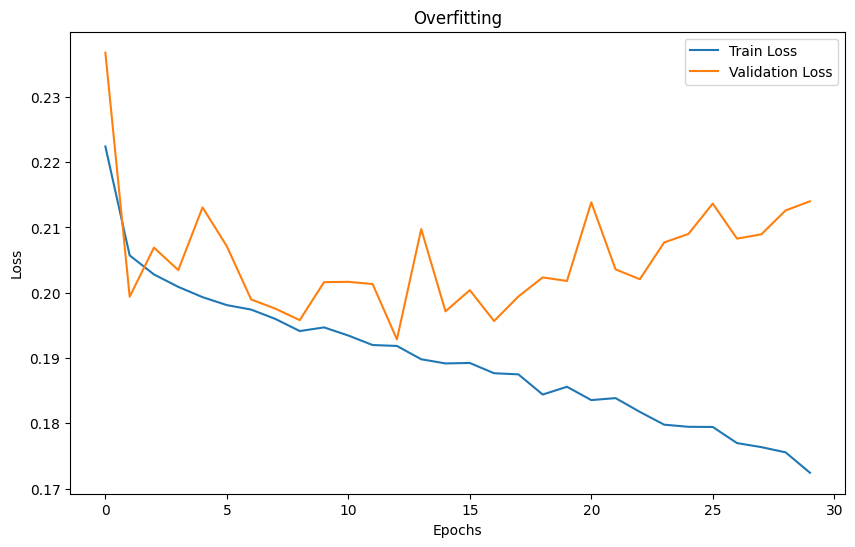

In [ ]:
plot_loss(history, "Overfitting")

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


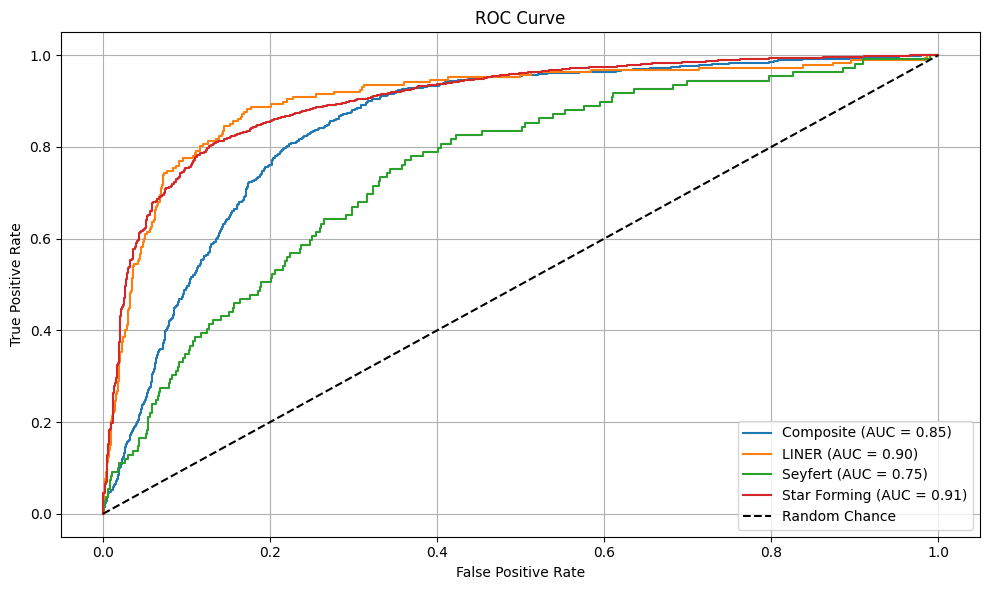

Accuracy: 0.836241610738255


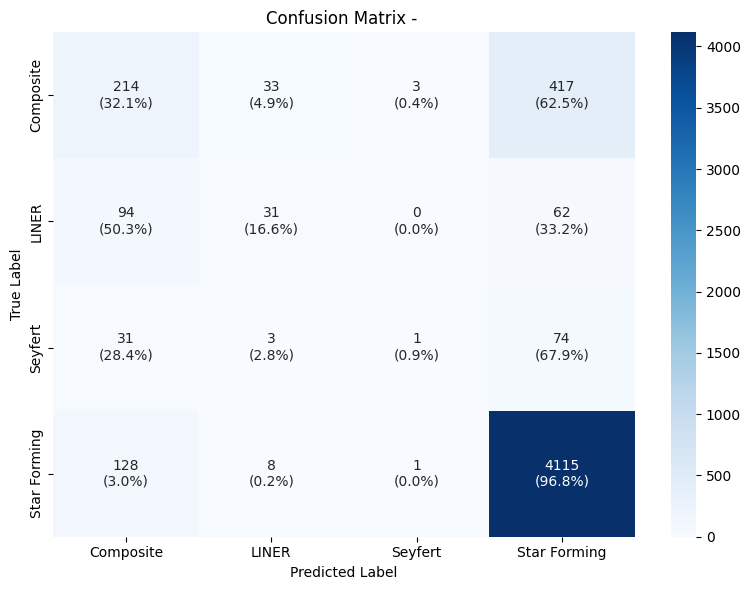

Classification Report:
               precision    recall  f1-score   support

   Composite       0.46      0.32      0.38       667
       LINER       0.41      0.17      0.24       187
     Seyfert       0.20      0.01      0.02       109
Star Forming       0.88      0.97      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.49      0.37      0.39      5215
weighted avg       0.80      0.84      0.81      5215



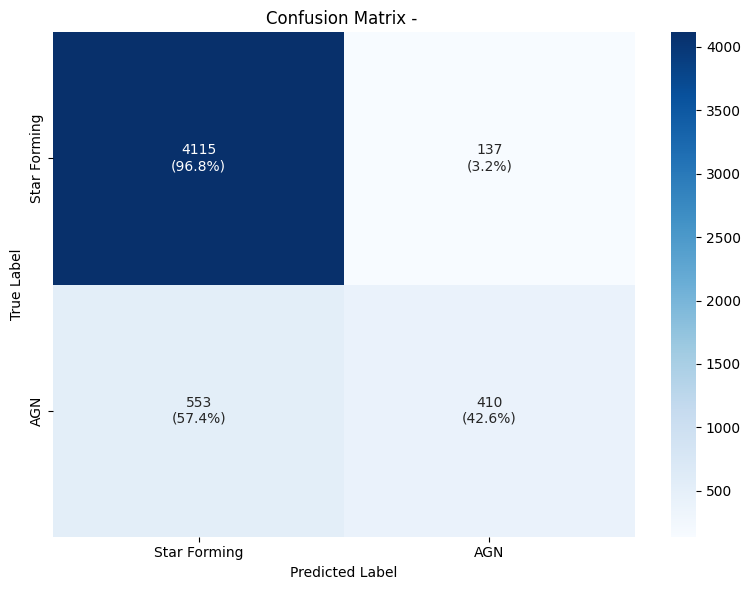

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.97      0.92      4252
         AGN       0.75      0.43      0.54       963

    accuracy                           0.87      5215
   macro avg       0.82      0.70      0.73      5215
weighted avg       0.86      0.87      0.85      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model(X_train, [128,1024,128], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 128)            │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 265,476 (1.01 MB)

 Trainable params: 265,476 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_split=0.2)

Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.8217 - loss: 0.2529 - val_accuracy: 0.8358 - val_loss: 0.2060
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8387 - loss: 0.1991 - val_accuracy: 0.8380 - val_loss: 0.1948
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8386 - loss: 0.1991 - val_accuracy: 0.8341 - val_loss: 0.2018
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8400 - loss: 0.1925 - val_accuracy: 0.8325 - val_loss: 0.2035
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8403 - loss: 0.1910 - val_accuracy: 0.8267 - val_loss: 0.2005
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8428 - loss: 0.1850 - val_accuracy: 0.8286 - val_loss: 0.1978
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8359 - loss: 0.1938 - val_accuracy: 0.8337 - val_loss: 0.1970
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8355 - loss: 0.1936 - val_accuracy: 0.

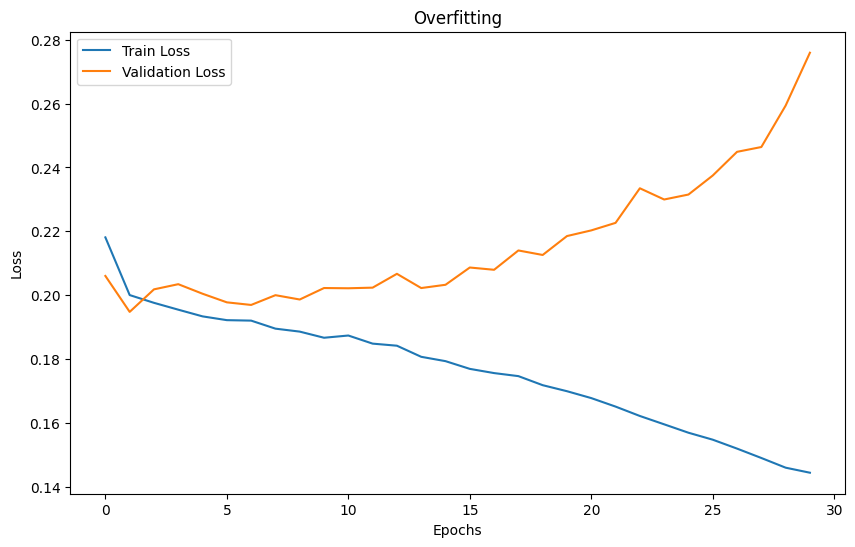

In [ ]:
plot_loss(history, "Overfitting")

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


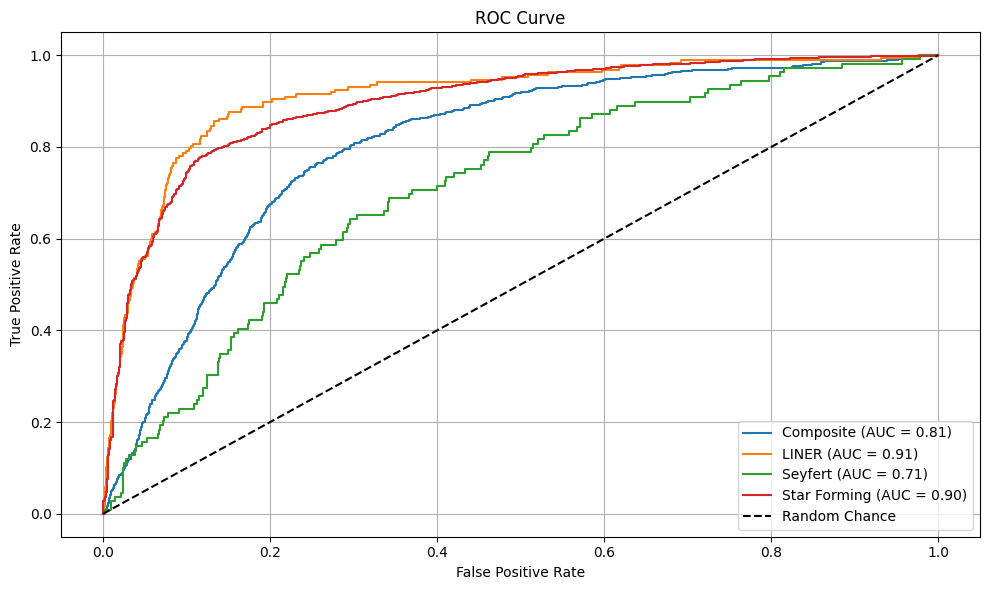

Accuracy: 0.8285714285714286


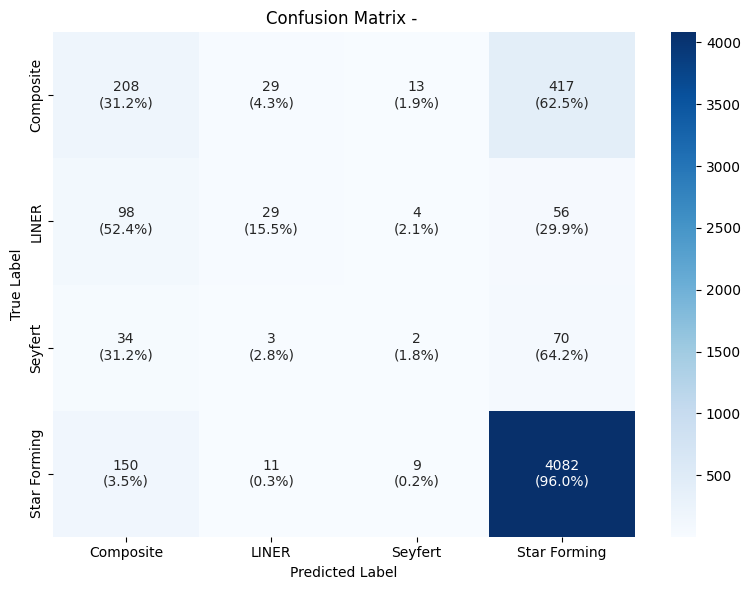

Classification Report:
               precision    recall  f1-score   support

   Composite       0.42      0.31      0.36       667
       LINER       0.40      0.16      0.22       187
     Seyfert       0.07      0.02      0.03       109
Star Forming       0.88      0.96      0.92      4252

    accuracy                           0.83      5215
   macro avg       0.45      0.36      0.38      5215
weighted avg       0.79      0.83      0.80      5215



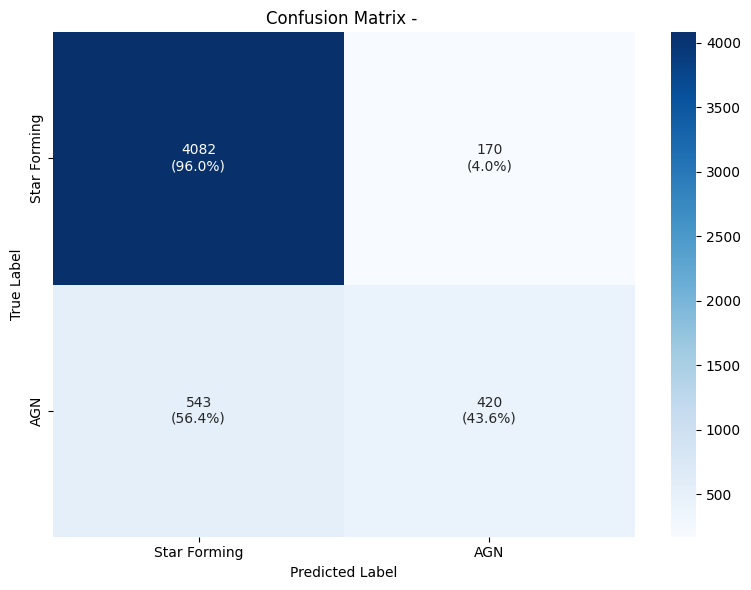

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.96      0.92      4252
         AGN       0.71      0.44      0.54       963

    accuracy                           0.86      5215
   macro avg       0.80      0.70      0.73      5215
weighted avg       0.85      0.86      0.85      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

## K-Fold Architecture Selection

We use K-fold validation to measure model performance and ensure that the architecture can generalize over the entire dataset, rather than overfitting to the validation data.

There does not seem to be a significant performance difference between the light and heavy contractive models. Accuracy values are nearly the same, with only slight variation in AGN precision recovery and ROC curve shapes, which can be attributed to the stochastic nature of the model training process. We decide to proceed with the light model going forward, as there is no clear distinction in result quality, but a considerable difference in model size—185 KB versus 2.5 MB. We acknowledge that regularization on the heavy model could lead to better results, but with a difference of about 0.01 in training loss, we abide by our decision.

The autoencoder and inverse autoencoder models present a minor difference in size, with 1.3 MB versus 1 MB. The autoencoder approach produces better ROC curves and shows a slight increase in AGN precision in the binary classification task. On the other hand, the inverse autoencoder reaches much lower training loss values (0.14 vs. 0.18) and exhibits better AGN recall despite its smaller capacity. These differences could again be due to the stochastic nature of the training process. We will proceed with the inverse autoencoder for further tests since the lower training loss suggests potential improvements after regularization.

We note that, using log2 for the sizes of the layers and rounding log2 of 12 to 4, our architectures present the following weight matrix distributions:

* Light Contractive   : 4x8  ; 8x7  ; 7x6  ; 6x5 ; 5x5 ; 4x3 ; 3x2

* Heavy Contractive   : 4x10 ; 10x9 ; 9x8  ; 8x2

* Autoencoder         : 4x9  ; 9x8  ; 8x7  ; 7x8 ; 8x9 ; 9x2

* Inverse Autoencoder : 4x7  ; 7x10 ; 10x7 ; 7x2

We highlight this because the models selected for follow-up testing, based on performance versus memory usage, also have the smallest differences between their input or output layers and the corresponding hidden layers. This could indicate that a sharp increase in feature space can cause learning difficulties. Possible causes include the low impact of each weight on adjacent layers leading to conflicting weight updates (noise), gradient explosion due to sharp value changes required for each weight, or simply a loss of coherence due to diffusion of the input and output across the feature space.



In [ ]:
model = get_classification_model(X_train, [256, 128, 64, 32, 16, 8], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 256)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,260 (184.61 KB)

 Trainable params: 47,260 (184.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.8175 - loss: 0.3153 - val_accuracy: 0.8281 - val_loss: 0.2081
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8294 - loss: 0.2051 - val_accuracy: 0.8337 - val_loss: 0.2050
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8384 - loss: 0.1973 - val_accuracy: 0.8349 - val_loss: 0.2111
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8365 - loss: 0.2015 - val_accuracy: 0.8368 - val_loss: 0.2002
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8358 - loss: 0.1987 - val_accuracy: 0.8296 - val_loss: 0.2060
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8389 - loss: 0.1937 - val_accuracy: 0.8356 - val_loss: 0.1964
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8374 - loss: 0.1901 - val_accuracy: 0.8332 - val_loss: 0.1962
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8394 - loss: 0.1922 - v

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


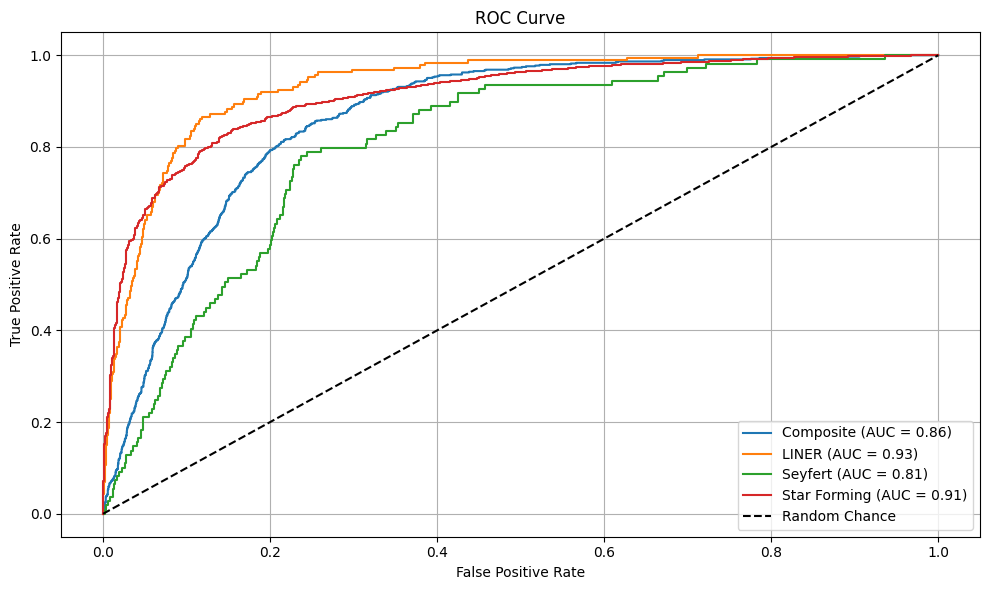

Accuracy: 0.8412272291466922


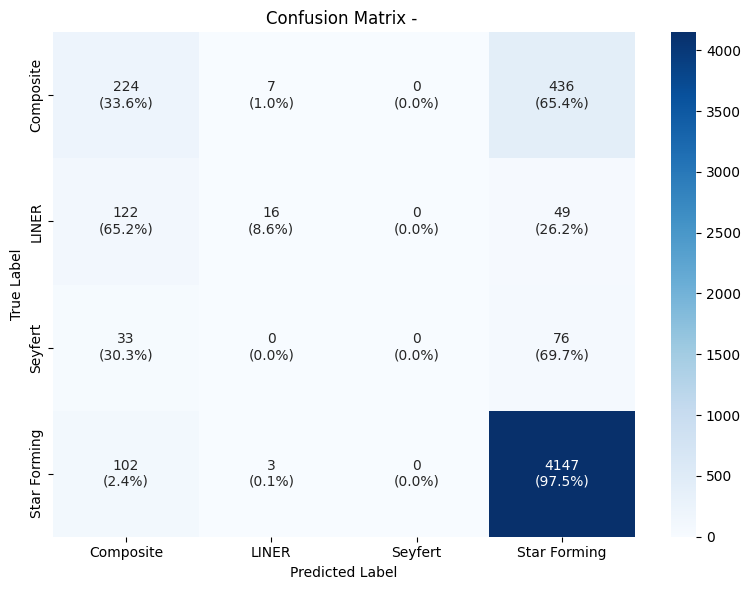

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.47      0.34      0.39       667
       LINER       0.62      0.09      0.15       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.88      0.98      0.93      4252

    accuracy                           0.84      5215
   macro avg       0.49      0.35      0.37      5215
weighted avg       0.80      0.84      0.81      5215



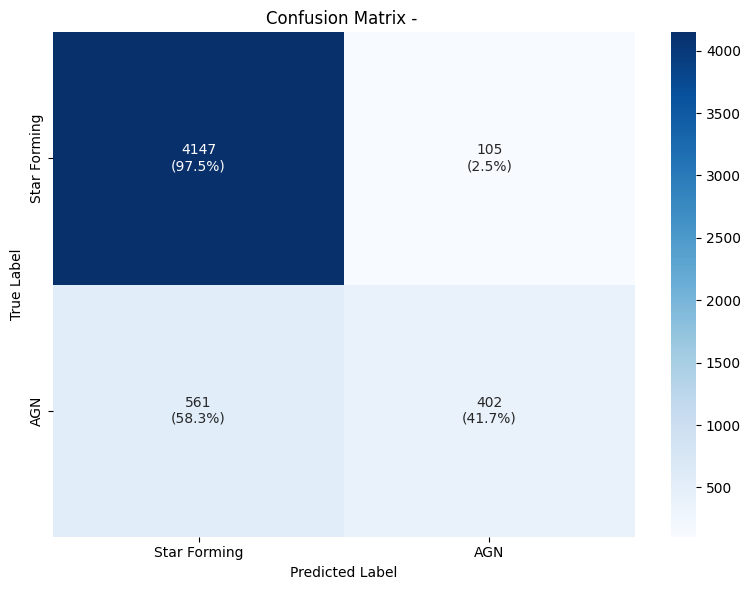

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.98      0.93      4252
         AGN       0.79      0.42      0.55       963

    accuracy                           0.87      5215
   macro avg       0.84      0.70      0.74      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model(X_train,[1024, 512, 256],class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 1024)           │        13,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 670,468 (2.56 MB)

 Trainable params: 670,468 (2.56 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8137 - loss: 0.2552 - val_accuracy: 0.8315 - val_loss: 0.2036
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8372 - loss: 0.1968 - val_accuracy: 0.8308 - val_loss: 0.2025
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8375 - loss: 0.1986 - val_accuracy: 0.8337 - val_loss: 0.2048
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8380 - loss: 0.1971 - val_accuracy: 0.8356 - val_loss: 0.2026

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8340 - loss: 0.1996 - val_accuracy: 0.8363 - val_loss: 0.2037
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8341 - loss: 0.2027 - val_accuracy: 0.8356 - val_loss: 0.2018
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8362 - loss: 0.2004 - val_accuracy: 0.8377 - val_loss: 0.1962
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8408 - l

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


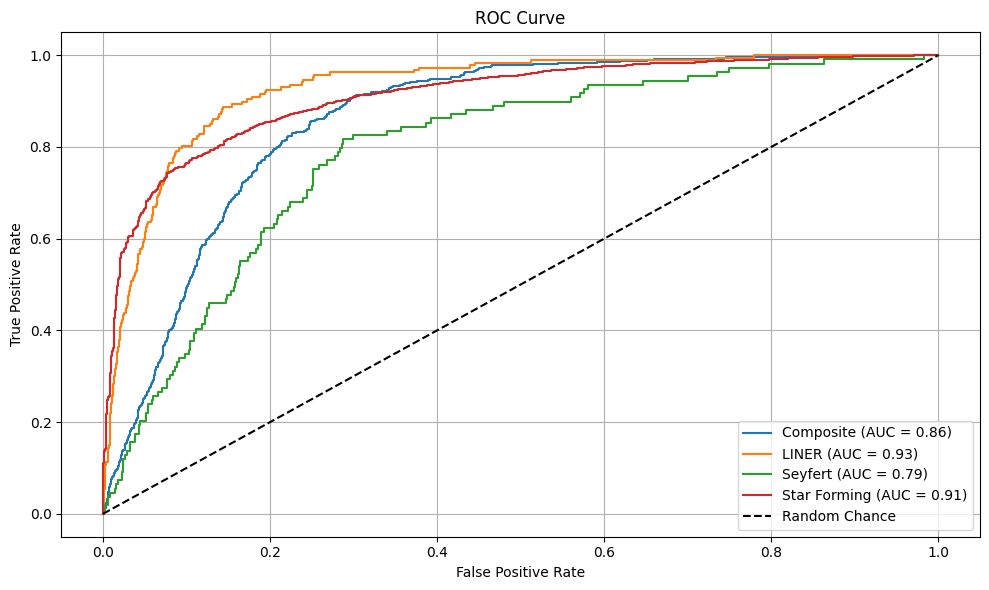

Accuracy: 0.8373921380632791


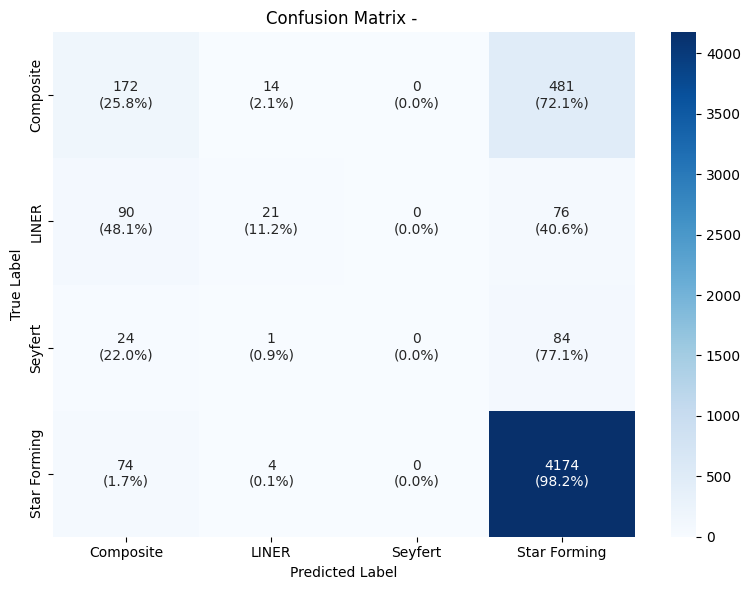

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.48      0.26      0.33       667
       LINER       0.53      0.11      0.19       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.87      0.98      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.47      0.34      0.36      5215
weighted avg       0.79      0.84      0.80      5215



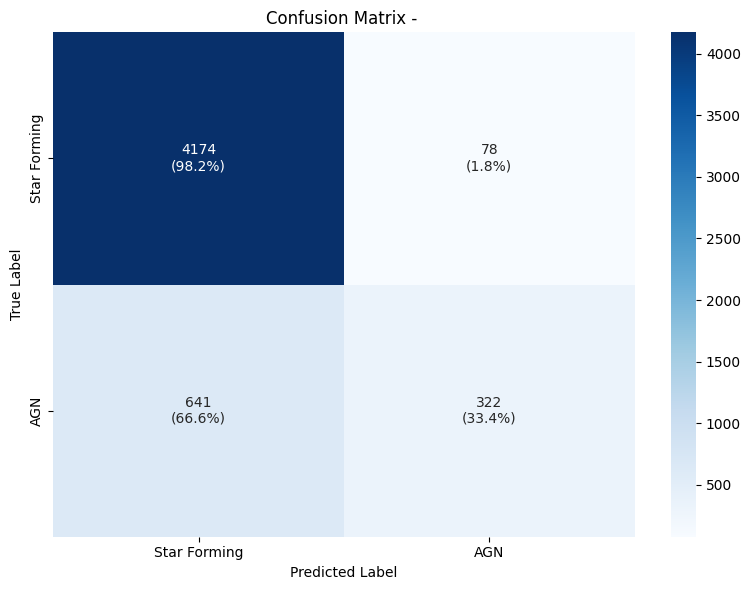

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.87      0.98      0.92      4252
         AGN       0.81      0.33      0.47       963

    accuracy                           0.86      5215
   macro avg       0.84      0.66      0.70      5215
weighted avg       0.86      0.86      0.84      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model(X_train, [512,256,128,256,512], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 512)            │         6,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 337,540 (1.29 MB)

 Trainable params: 337,540 (1.29 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.8142 - loss: 0.2584 - val_accuracy: 0.8322 - val_loss: 0.1987
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8331 - loss: 0.2051 - val_accuracy: 0.8341 - val_loss: 0.2049
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8346 - loss: 0.2018 - val_accuracy: 0.8341 - val_loss: 0.2002

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8381 - loss: 0.1994 - val_accuracy: 0.8217 - val_loss: 0.2177
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8335 - loss: 0.2065 - val_accuracy: 0.8368 - val_loss: 0.2007
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8365 - loss: 0.1989 - val_accuracy: 0.8363 - val_loss: 0.2000
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8382 - loss: 0.1945 - val_accuracy: 0.8250 - val_loss: 0.2175
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8365 - l

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


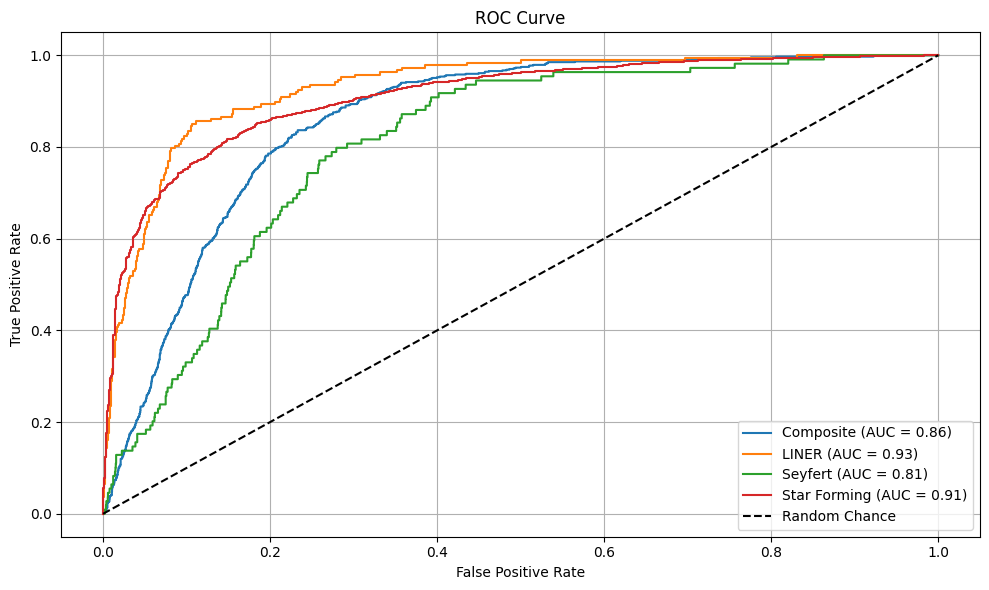

Accuracy: 0.8377756471716203


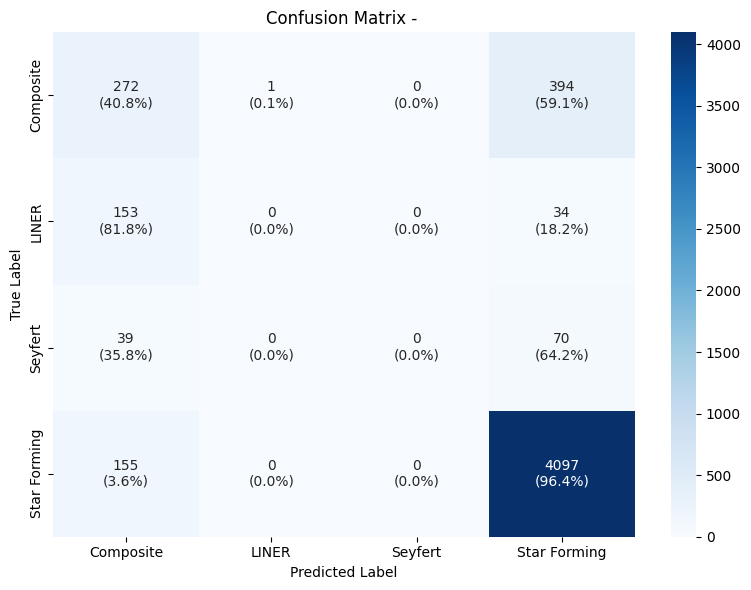

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.44      0.41      0.42       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.89      0.96      0.93      4252

    accuracy                           0.84      5215
   macro avg       0.33      0.34      0.34      5215
weighted avg       0.78      0.84      0.81      5215



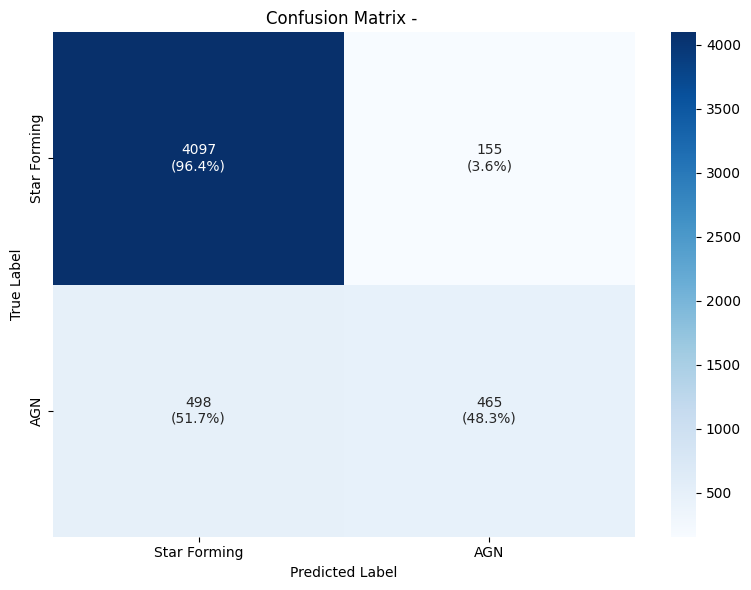

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.93      4252
         AGN       0.75      0.48      0.59       963

    accuracy                           0.87      5215
   macro avg       0.82      0.72      0.76      5215
weighted avg       0.87      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model(X_train, [128,1024,128], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 128)            │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 265,476 (1.01 MB)

 Trainable params: 265,476 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.8150 - loss: 0.2599 - val_accuracy: 0.8356 - val_loss: 0.2060
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8322 - loss: 0.1994 - val_accuracy: 0.8356 - val_loss: 0.2064
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8412 - loss: 0.1914 - val_accuracy: 0.8368 - val_loss: 0.1971
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8406 - loss: 0.1947 - val_accuracy: 0.8380 - val_loss: 0.1988
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8399 - loss: 0.1943 - val_accuracy: 0.8370 - val_loss: 0.2011

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8397 - loss: 0.1946 - val_accuracy: 0.8394 - val_loss: 0.1990
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8338 - loss: 0.1995 - val_accuracy: 0.8380 - val_loss: 0.1993
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8370 -

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


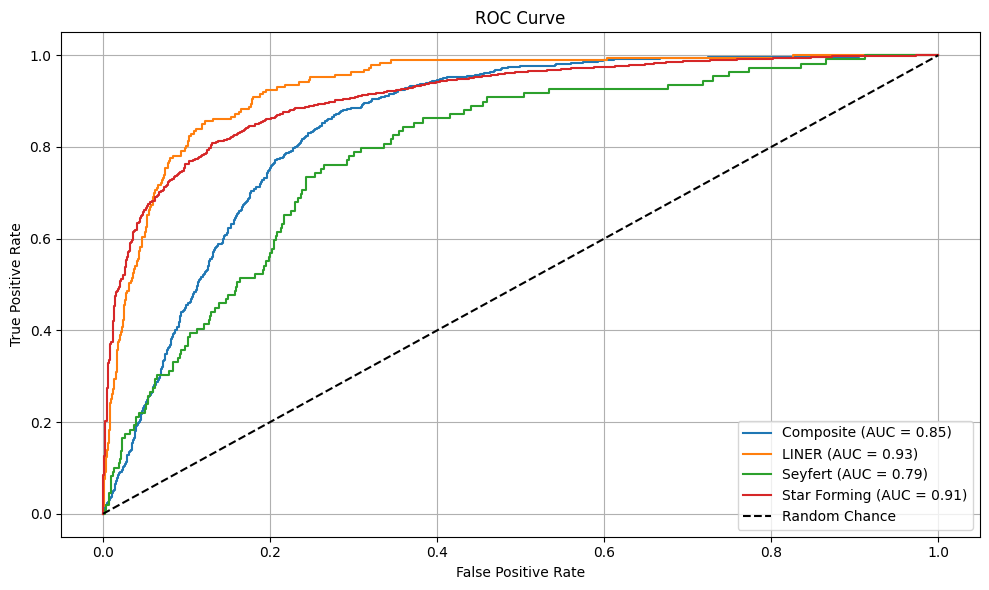

Accuracy: 0.8377756471716203


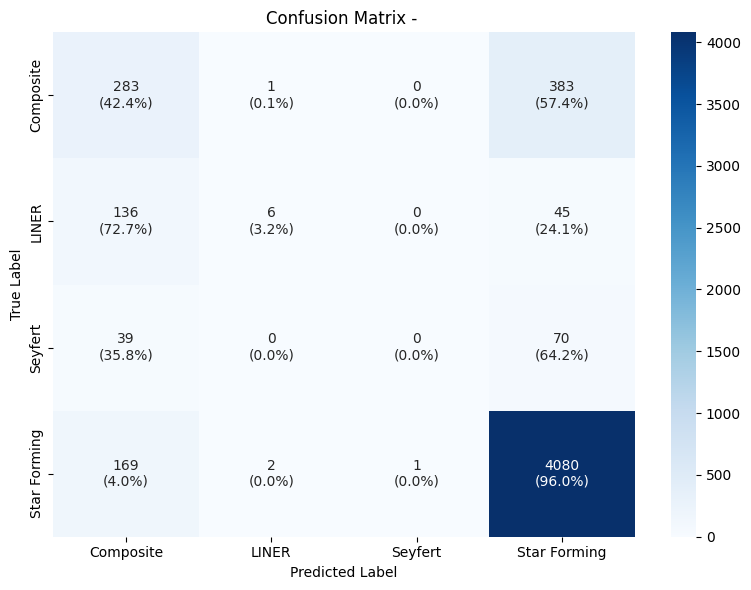

Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.42      0.44       667
       LINER       0.67      0.03      0.06       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.89      0.96      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.50      0.35      0.36      5215
weighted avg       0.81      0.84      0.81      5215



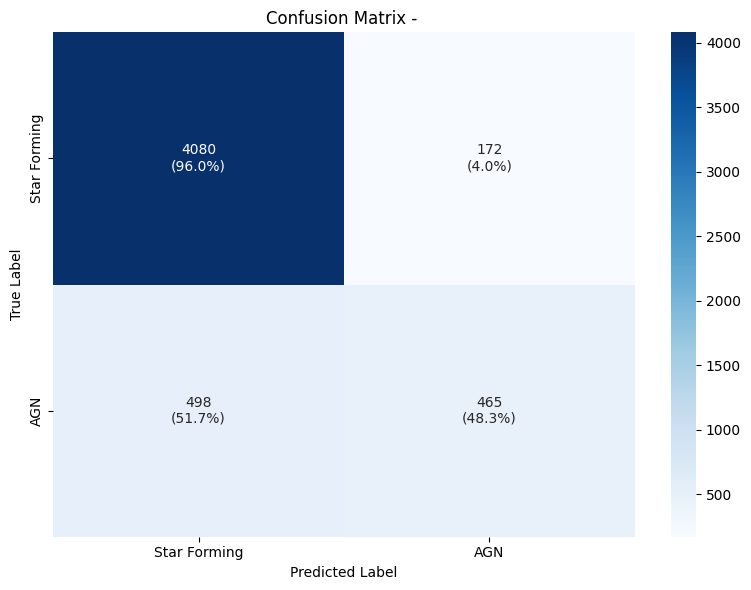

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.92      4252
         AGN       0.73      0.48      0.58       963

    accuracy                           0.87      5215
   macro avg       0.81      0.72      0.75      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

## L2 Regularization


We test model performance with L2 regularization applied to the hidden layers, using values of 0.001 and 0.002, as our architectures still have a high feature count. Since L2 regularization tends to be more effective in smaller models, we expect to see larger effects in the light contractive model (LCM) than in the inverse autoencoder model (IAM), which we refer to as LCM and IAM from now on. We focus primarily on binary AGN classification accuracy due to the nature of the problem.

Results from applying L2 regularization are somewhat noisy across iterations, causing either slight improvements or worsening of performance. We therefore consider these results inconclusive and will proceed without L2 regularization going forward.

In [ ]:
def get_classification_model_l2(input, layer_filters, classes, l2_value = 0.001):
    inputs = Input(shape=(input.shape[1],))

    x = inputs
    for lf in layer_filters:
        x = layers.Dense(lf, activation='relu', kernel_regularizer=regularizers.l2(l2_value))(x)

    outputs = layers.Dense(len(np.unique(classes)), activation='softmax')(x)

    model = models.Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
model = get_classification_model_l2(X_train, [256, 128, 64, 32, 16, 8], class_names, 0.001)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 256)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,260 (184.61 KB)

 Trainable params: 47,260 (184.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.7828 - loss: 0.4997 - val_accuracy: 0.8327 - val_loss: 0.2643
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8363 - loss: 0.2532 - val_accuracy: 0.8346 - val_loss: 0.2388
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8329 - loss: 0.2367 - val_accuracy: 0.8327 - val_loss: 0.2260
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8335 - loss: 0.2229 - val_accuracy: 0.8286 - val_loss: 0.2239
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8383 - loss: 0.2180 - val_accuracy: 0.8360 - val_loss: 0.2193
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8328 - loss: 0.2183 - val_accuracy: 0.8332 - val_loss: 0.2204
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8375 - loss: 0.2159 - val_accuracy: 0.8329 - val_loss: 0.2147
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8391 - loss: 0.2122 - v

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


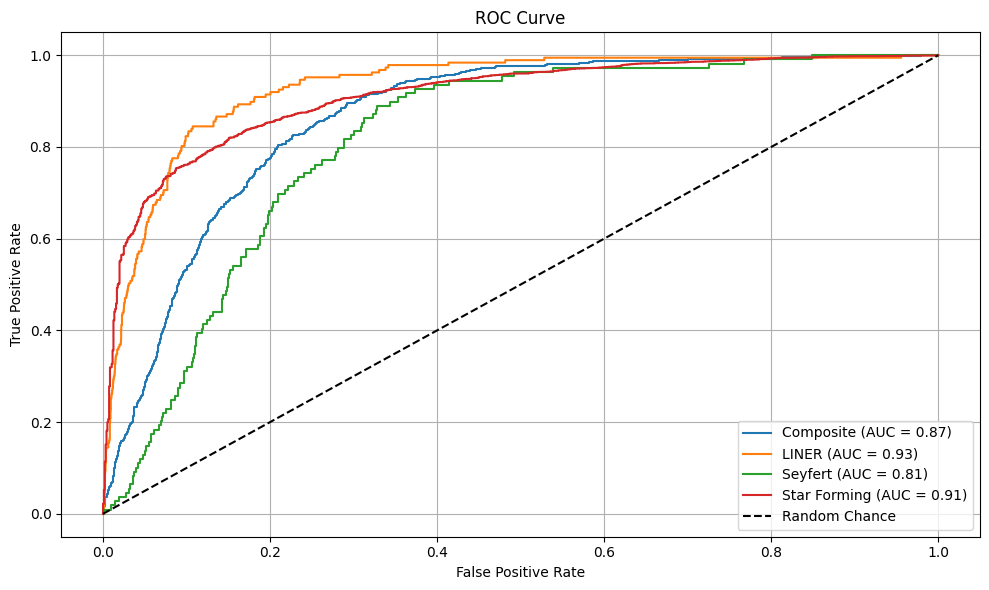

Accuracy: 0.8383509108341323


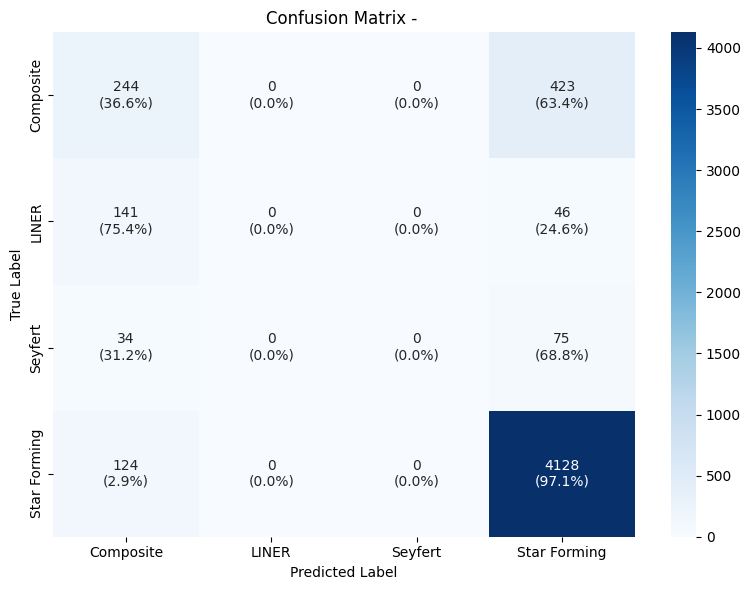

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.37      0.40       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.88      0.97      0.93      4252

    accuracy                           0.84      5215
   macro avg       0.33      0.33      0.33      5215
weighted avg       0.78      0.84      0.81      5215



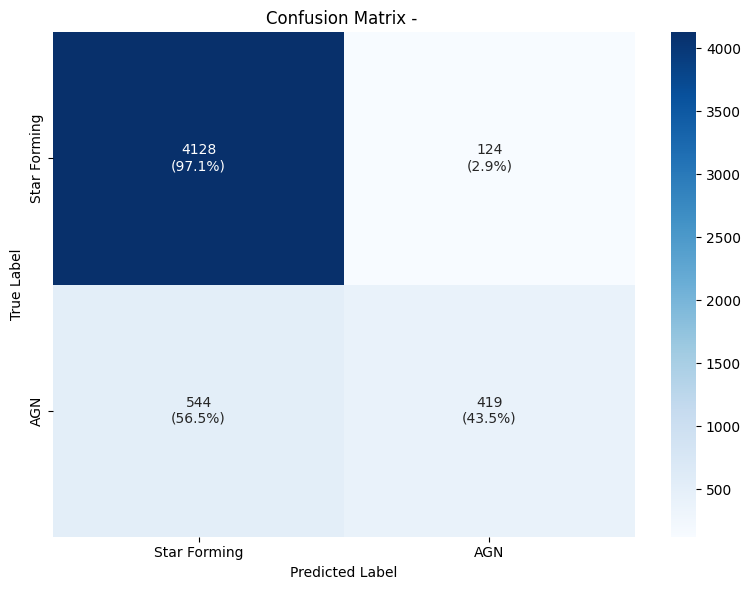

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.97      0.93      4252
         AGN       0.77      0.44      0.56       963

    accuracy                           0.87      5215
   macro avg       0.83      0.70      0.74      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model_l2(X_train, [128,1024,128], class_names, 0.001)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 128)            │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 265,476 (1.01 MB)

 Trainable params: 265,476 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.8156 - loss: 0.4807 - val_accuracy: 0.8341 - val_loss: 0.2433
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8333 - loss: 0.2377 - val_accuracy: 0.8322 - val_loss: 0.2269
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.8370 - loss: 0.2181 - val_accuracy: 0.8317 - val_loss: 0.2240
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - accuracy: 0.8380 - loss: 0.2153 - val_accuracy: 0.8257 - val_loss: 0.2213
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8360 - loss: 0.2098 - val_accuracy: 0.8327 - val_loss: 0.2171
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8329 - loss: 0.2137 - val_accuracy: 0.8322 - val_loss: 0.2104
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8392 - loss: 0.2056 - val_accuracy: 0.8358 - val_loss: 0.2126
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.8375 - loss: 0.

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


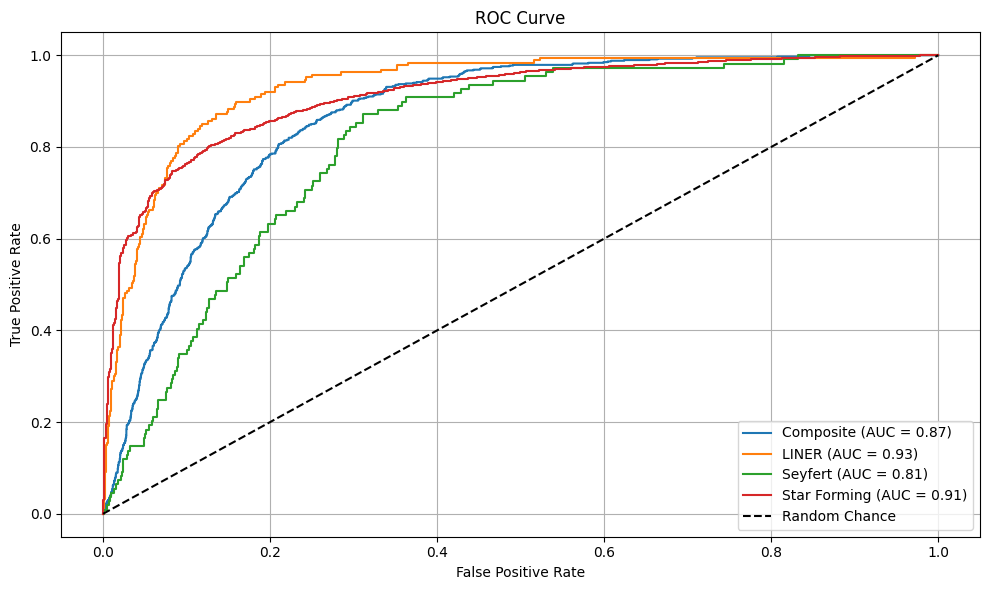

Accuracy: 0.8429530201342282


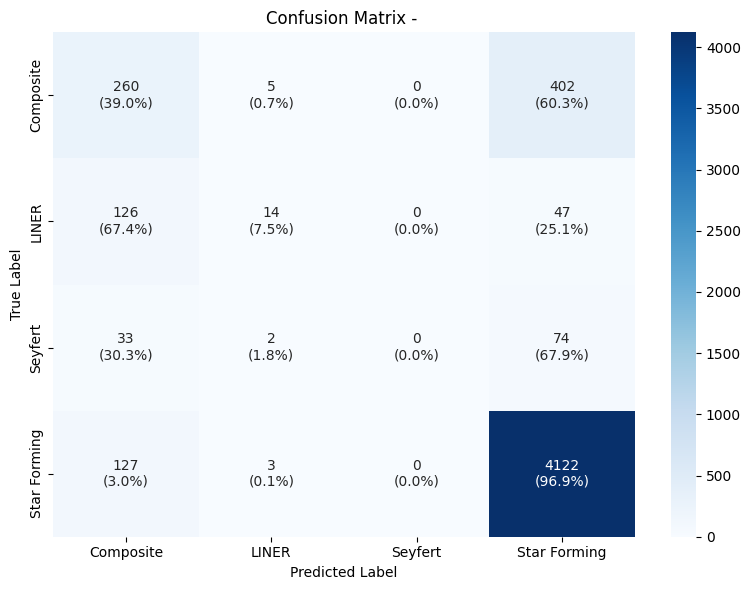

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.48      0.39      0.43       667
       LINER       0.58      0.07      0.13       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.89      0.97      0.93      4252

    accuracy                           0.84      5215
   macro avg       0.49      0.36      0.37      5215
weighted avg       0.81      0.84      0.82      5215



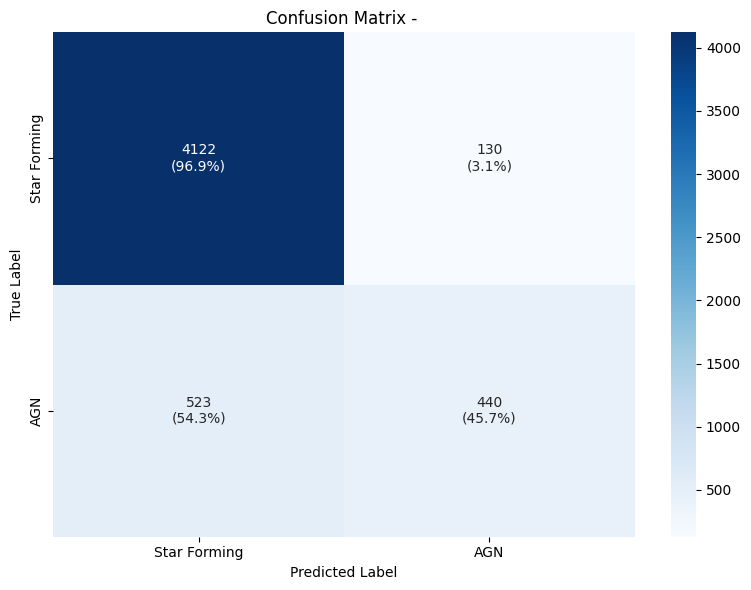

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.97      0.93      4252
         AGN       0.77      0.46      0.57       963

    accuracy                           0.87      5215
   macro avg       0.83      0.71      0.75      5215
weighted avg       0.87      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model_l2(X_train, [256, 128, 64, 32, 16, 8], class_names, 0.002)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 256)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,260 (184.61 KB)

 Trainable params: 47,260 (184.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8198 - loss: 0.6446 - val_accuracy: 0.8293 - val_loss: 0.2969
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8358 - loss: 0.2746 - val_accuracy: 0.8308 - val_loss: 0.2495
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8312 - loss: 0.2471 - val_accuracy: 0.8339 - val_loss: 0.2407
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8310 - loss: 0.2393 - val_accuracy: 0.8325 - val_loss: 0.2371
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8334 - loss: 0.2274 - val_accuracy: 0.8322 - val_loss: 0.2287
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8344 - loss: 0.2258 - val_accuracy: 0.8358 - val_loss: 0.2257
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8322 - loss: 0.2264 - val_accuracy: 0.8322 - val_loss: 0.2257
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8343 - loss: 0.2268 - v

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


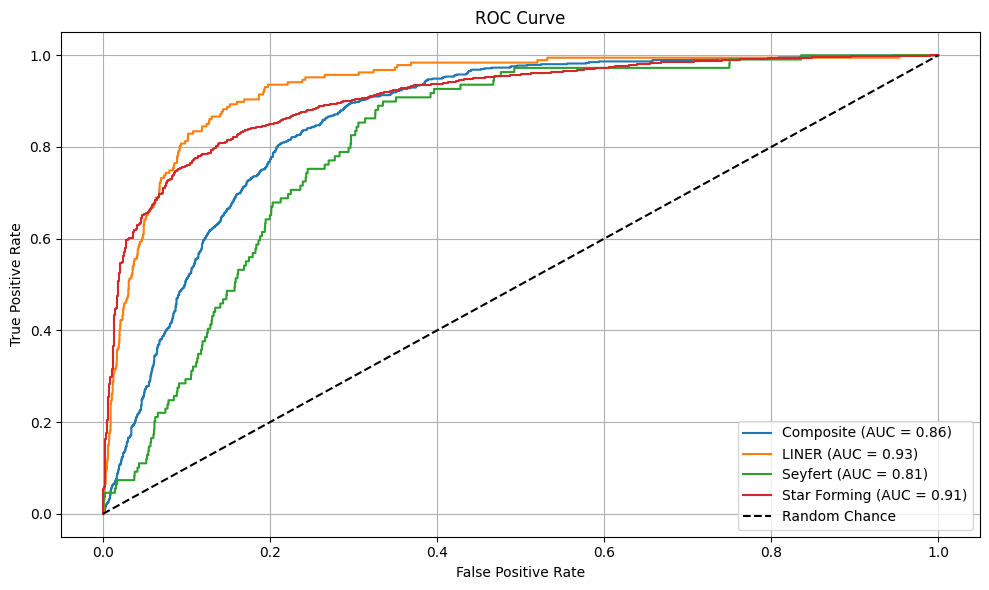

Accuracy: 0.8381591562799616


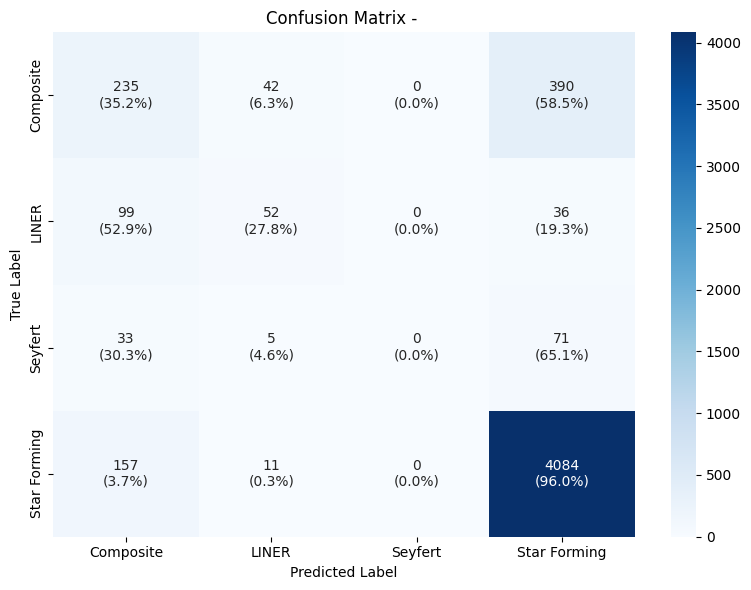

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.35      0.39       667
       LINER       0.47      0.28      0.35       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.89      0.96      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.45      0.40      0.42      5215
weighted avg       0.80      0.84      0.82      5215



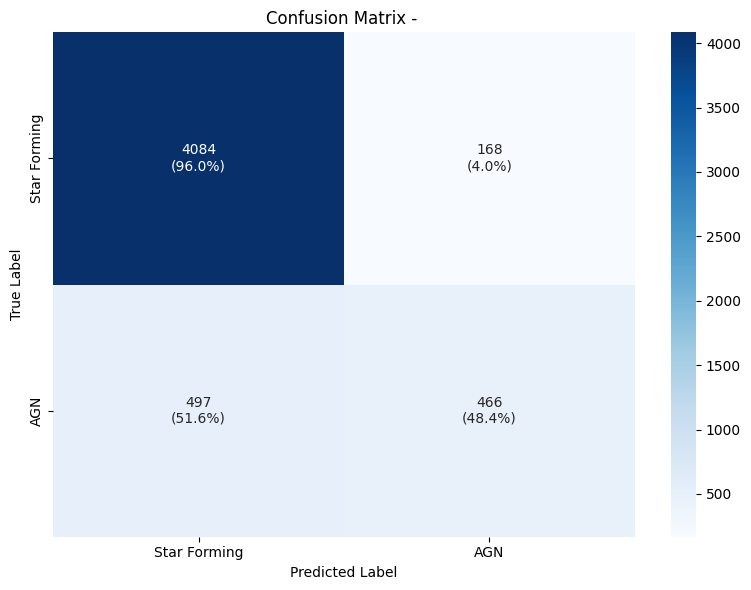

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.92      4252
         AGN       0.74      0.48      0.58       963

    accuracy                           0.87      5215
   macro avg       0.81      0.72      0.75      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model_l2(X_train, [128,1024,128], class_names, 0.002)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 128)            │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 265,476 (1.01 MB)

 Trainable params: 265,476 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - accuracy: 0.8185 - loss: 0.6015 - val_accuracy: 0.8339 - val_loss: 0.2460
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8336 - loss: 0.2382 - val_accuracy: 0.8315 - val_loss: 0.2284
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8314 - loss: 0.2249 - val_accuracy: 0.8358 - val_loss: 0.2218
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8336 - loss: 0.2190 - val_accuracy: 0.8358 - val_loss: 0.2195
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.8299 - loss: 0.2240 - val_accuracy: 0.8380 - val_loss: 0.2141
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.8317 - loss: 0.2151 - val_accuracy: 0.8380 - val_loss: 0.2120
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.8357 - loss: 0.2160 - val_accuracy: 0.8349 - val_loss: 0.2119
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8357 - loss: 0.208

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


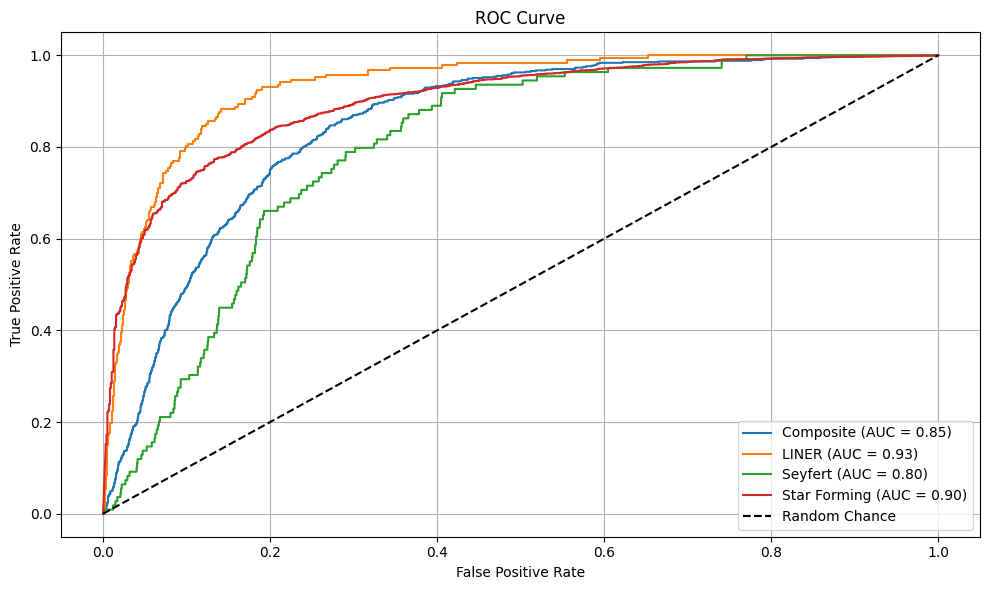

Accuracy: 0.8337488015340364


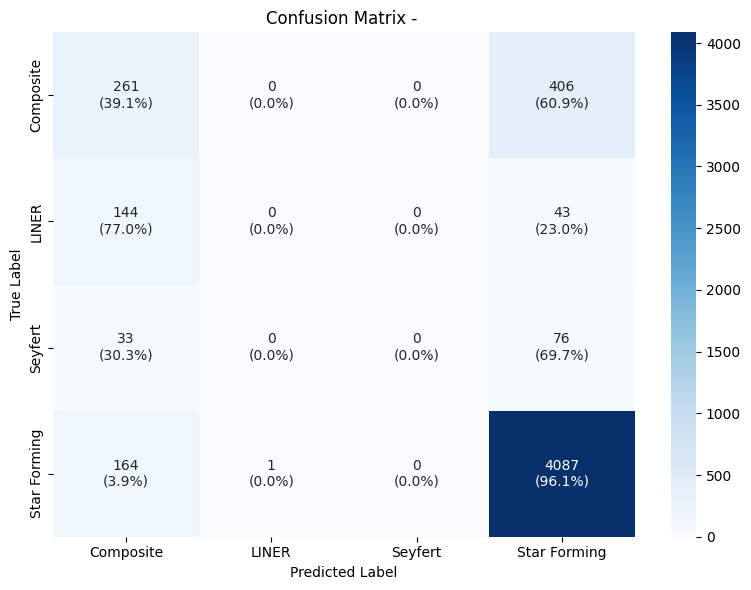

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.43      0.39      0.41       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.89      0.96      0.92      4252

    accuracy                           0.83      5215
   macro avg       0.33      0.34      0.33      5215
weighted avg       0.78      0.83      0.80      5215



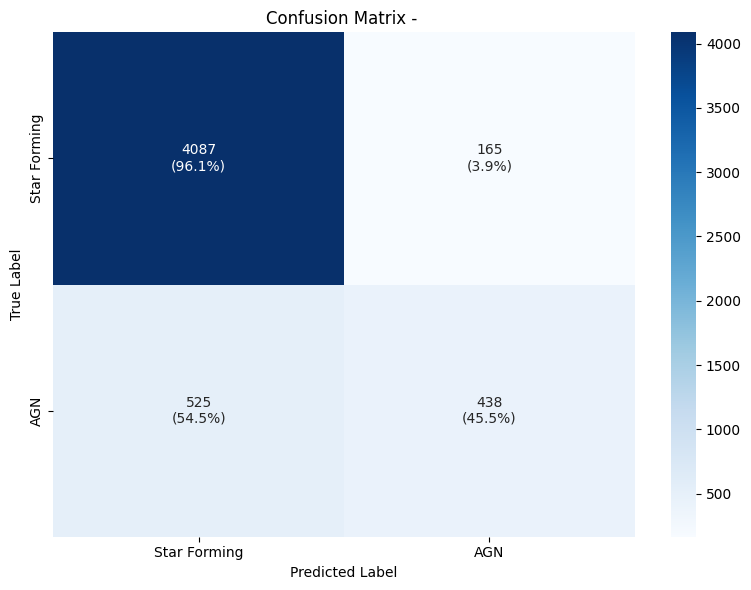

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.92      4252
         AGN       0.73      0.45      0.56       963

    accuracy                           0.87      5215
   macro avg       0.81      0.71      0.74      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

## Dropout Regularization


We test model performance with dropout applied after each hidden layer, using values of 0.5 and 0.25. We expect performance deterioration in the LCM and improvement in the IAM due to their size difference.

The IAM model shows some improvement in AGN precision with dropout rates between 0.25 and 0.5, although dropout at 0.5 reduces recall. The LCM either maintains or drops performance, so we conclude that dropout is not beneficial for this model. While results tend to favor better performance of the IAM with dropout at 0.25, they remain somewhat inconclusive as performance varies across iterations, sometimes causing negligible deterioration. Nevertheless, we decide to apply a dropout rate of 0.25 to the IAM model going forward.



In [ ]:
def get_classification_model_do(input, layer_filters, classes, do_value = 0.25):
    inputs = Input(shape=(input.shape[1],))

    x = inputs
    for lf in layer_filters:
        x = layers.Dense(lf, activation='relu')(x)
        x = layers.Dropout(do_value)(x)

    outputs = layers.Dense(len(np.unique(classes)), activation='softmax')(x)

    model = models.Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
model = get_classification_model_do(X_train, [256, 128, 64, 32, 16, 8], class_names, 0.5)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 256)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,260 (184.61 KB)

 Trainable params: 47,260 (184.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - accuracy: 0.7252 - loss: 0.5141 - val_accuracy: 0.8154 - val_loss: 0.2573
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8088 - loss: 0.3085 - val_accuracy: 0.8154 - val_loss: 0.2384
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8079 - loss: 0.2740 - val_accuracy: 0.8154 - val_loss: 0.2342
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8152 - loss: 0.2699 - val_accuracy: 0.8154 - val_loss: 0.2335
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8187 - loss: 0.2578 - val_accuracy: 0.8154 - val_loss: 0.2273
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8110 - loss: 0.2588 - val_accuracy: 0.8154 - val_loss: 0.2232
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8162 - loss: 0.2492 - val_accuracy: 0.8154 - val_loss: 0.2207
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8205 - loss: 0.2419 -

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


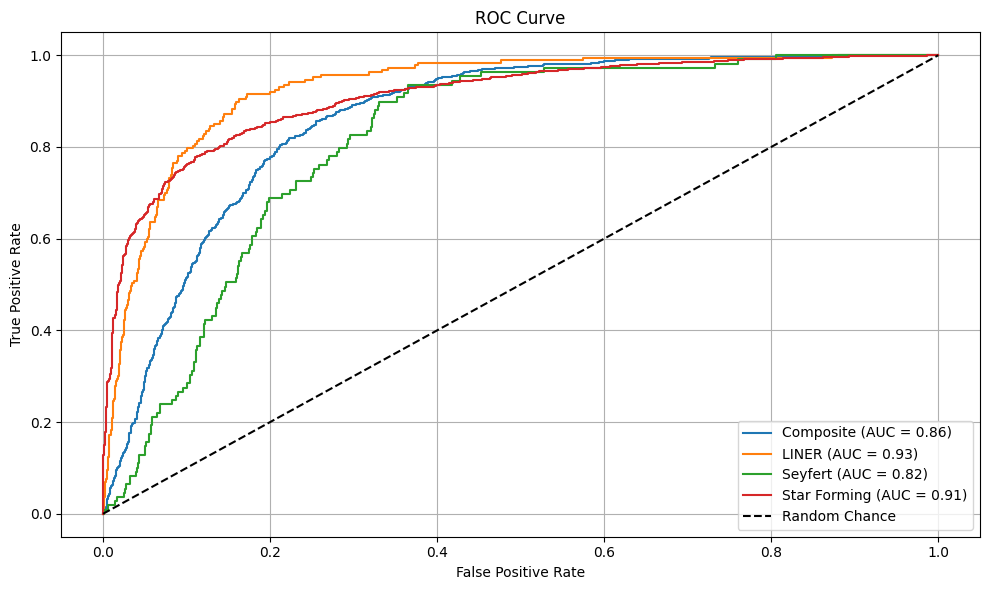

Accuracy: 0.824352828379674


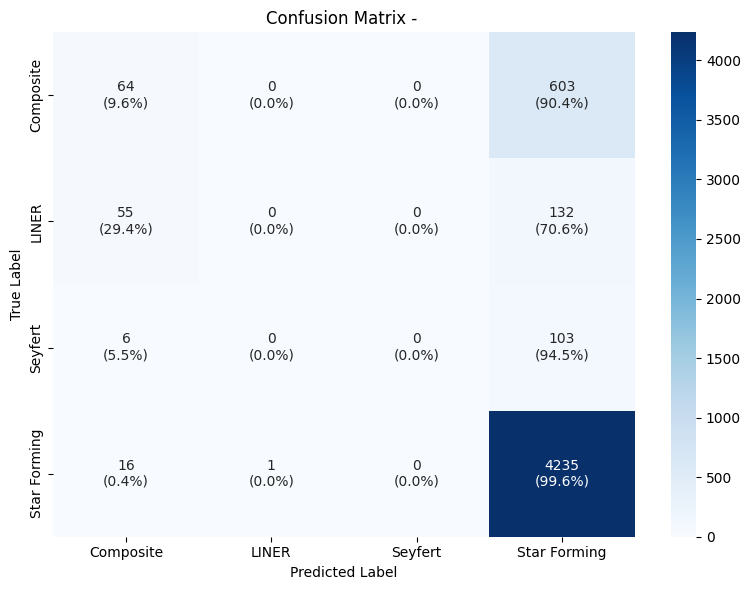

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.10      0.16       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.83      1.00      0.91      4252

    accuracy                           0.82      5215
   macro avg       0.32      0.27      0.27      5215
weighted avg       0.74      0.82      0.76      5215



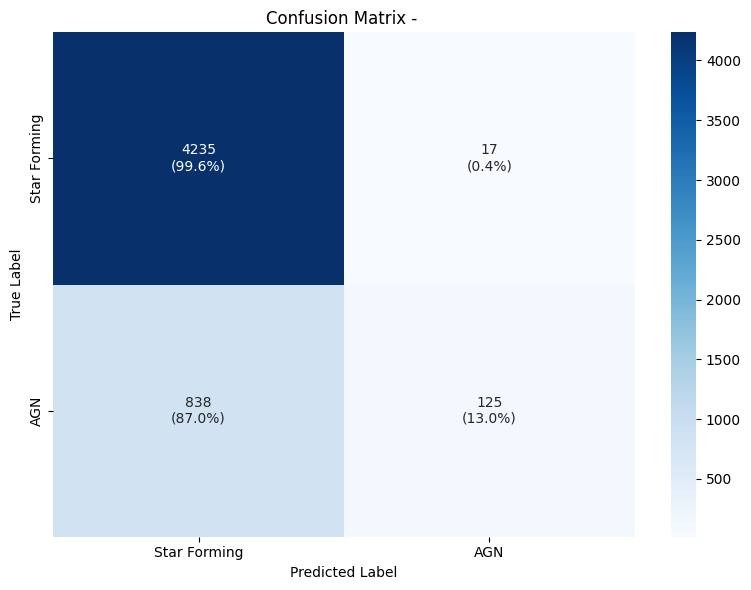

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.83      1.00      0.91      4252
         AGN       0.88      0.13      0.23       963

    accuracy                           0.84      5215
   macro avg       0.86      0.56      0.57      5215
weighted avg       0.84      0.84      0.78      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model_do(X_train, [128,1024,128], class_names, 0.5)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_109 (InputLayer)    │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 128)            │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_90 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_91 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_92 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 265,476 (1.01 MB)

 Trainable params: 265,476 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.8091 - loss: 0.2980 - val_accuracy: 0.8360 - val_loss: 0.2136
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.8298 - loss: 0.2176 - val_accuracy: 0.8327 - val_loss: 0.2022
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8308 - loss: 0.2118 - val_accuracy: 0.8317 - val_loss: 0.1995
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.8359 - loss: 0.2057 - val_accuracy: 0.8269 - val_loss: 0.2020
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8278 - loss: 0.2108 - val_accuracy: 0.8341 - val_loss: 0.2023

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8304 - loss: 0.2140 - val_accuracy: 0.8372 - val_loss: 0.2042
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8370 - loss: 0.2108 - val_accuracy: 0.8365 - val_loss: 0.1979
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8386 

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


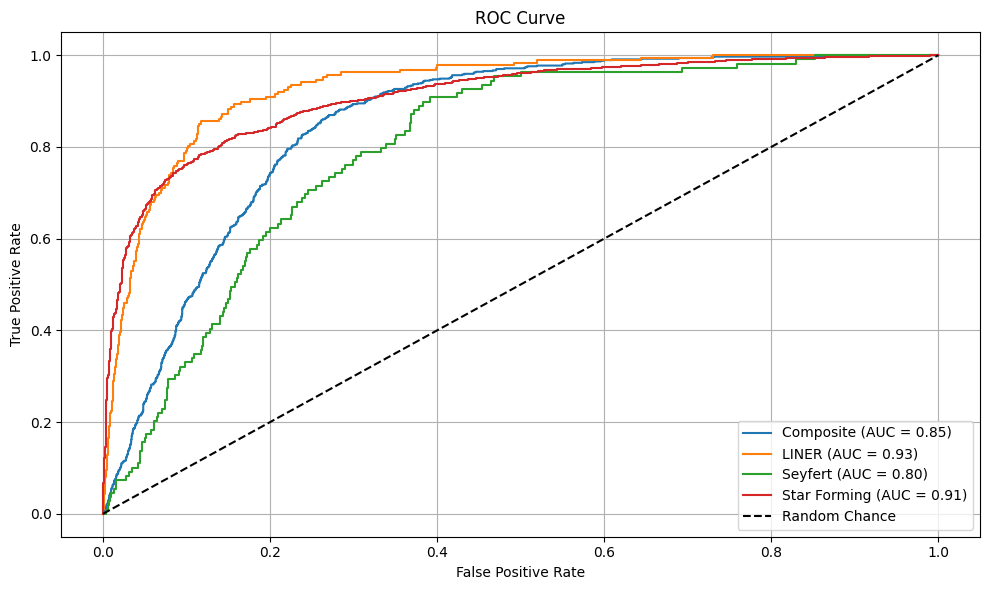

Accuracy: 0.8289549376797699


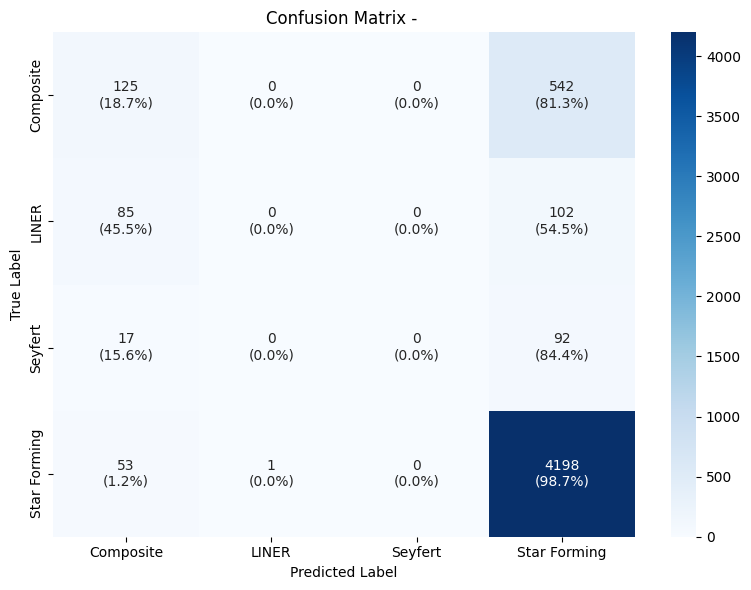

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.19      0.26       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.85      0.99      0.91      4252

    accuracy                           0.83      5215
   macro avg       0.32      0.29      0.29      5215
weighted avg       0.75      0.83      0.78      5215



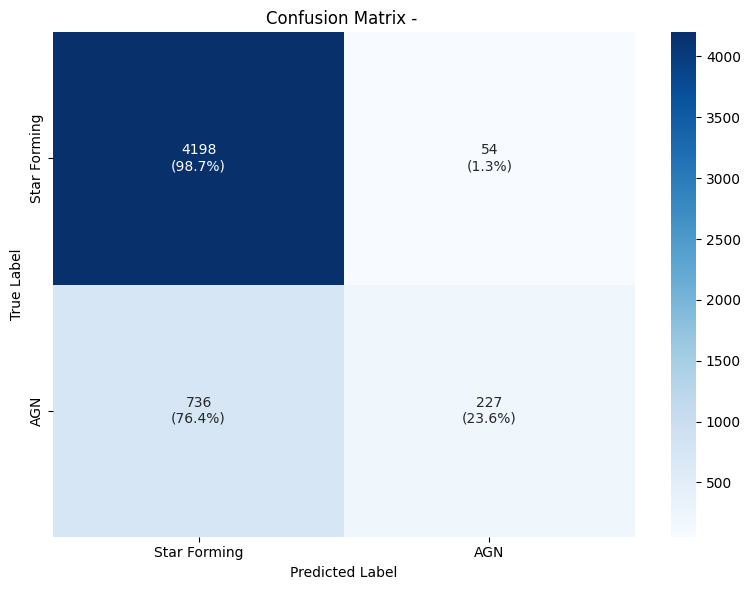

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.85      0.99      0.91      4252
         AGN       0.81      0.24      0.36       963

    accuracy                           0.85      5215
   macro avg       0.83      0.61      0.64      5215
weighted avg       0.84      0.85      0.81      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model_do(X_train, [256, 128, 64, 32, 16, 8], class_names, 0.25)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_88 (InputLayer)     │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 256)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_63 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_64 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_65 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_490 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_66 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_67 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_68 (Dropout)            │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,260 (184.61 KB)

 Trainable params: 47,260 (184.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - accuracy: 0.7379 - loss: 0.4042 - val_accuracy: 0.8154 - val_loss: 0.2153
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8201 - loss: 0.2376 - val_accuracy: 0.8253 - val_loss: 0.2104
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8195 - loss: 0.2303 - val_accuracy: 0.8269 - val_loss: 0.2057
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8290 - loss: 0.2175 - val_accuracy: 0.8334 - val_loss: 0.2105
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8219 - loss: 0.2263 - val_accuracy: 0.8303 - val_loss: 0.2071

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8204 - loss: 0.2268 - val_accuracy: 0.8320 - val_loss: 0.2073
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8302 - loss: 0.2170 - val_accuracy: 0.8329 - val_loss: 0.2047
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8339 - l

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


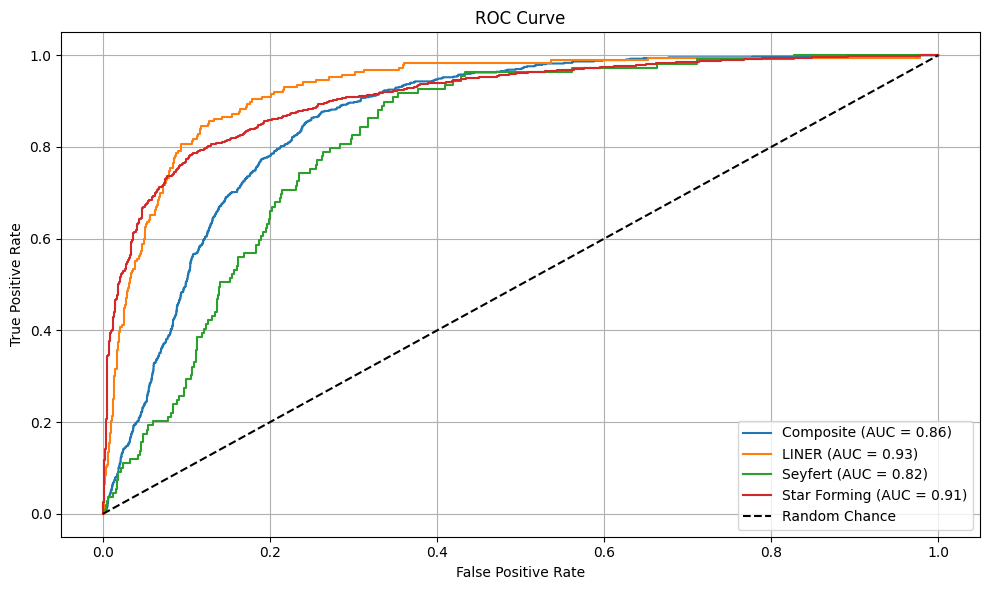

Accuracy: 0.8373921380632791


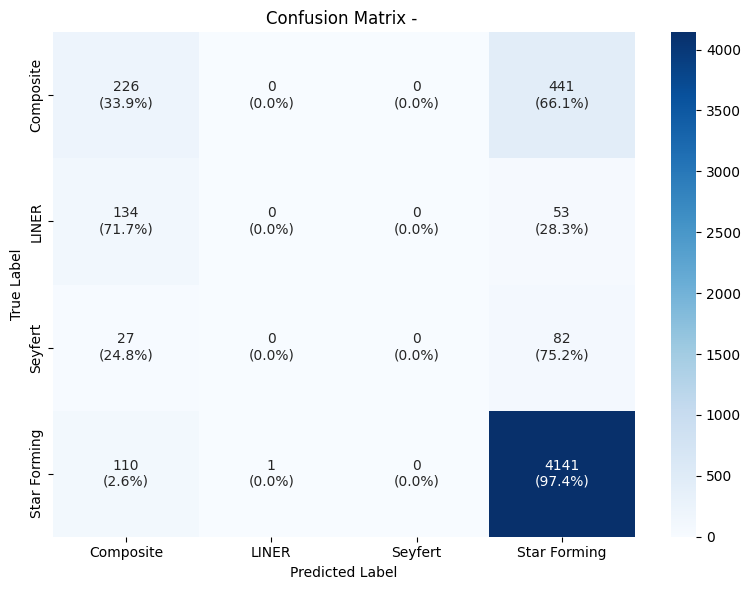

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.34      0.39       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.88      0.97      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.33      0.33      0.33      5215
weighted avg       0.77      0.84      0.80      5215



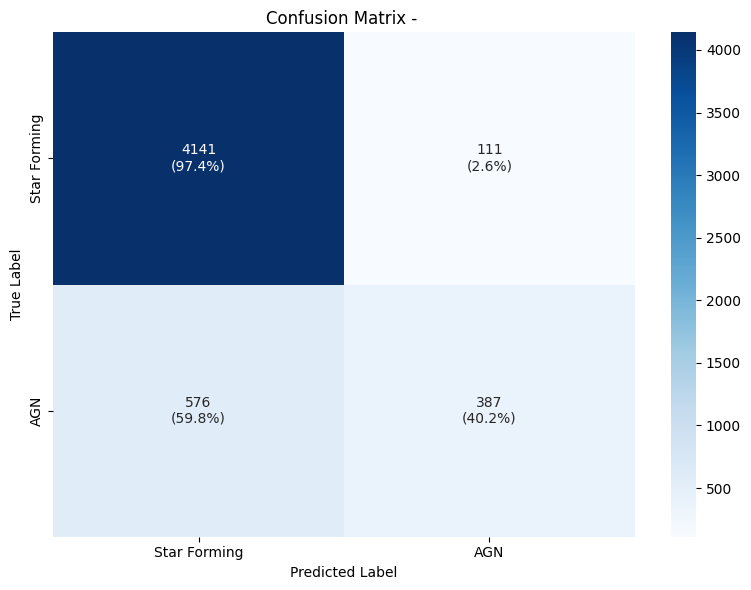

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.97      0.92      4252
         AGN       0.78      0.40      0.53       963

    accuracy                           0.87      5215
   macro avg       0.83      0.69      0.73      5215
weighted avg       0.86      0.87      0.85      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

In [ ]:
model = get_classification_model_do(X_train, [128,1024,128], class_names, 0.25)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_110 (InputLayer)    │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 128)            │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_93 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_94 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_609 (Dense)               │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_95 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 265,476 (1.01 MB)

 Trainable params: 265,476 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train, y_train, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - accuracy: 0.8159 - loss: 0.2702 - val_accuracy: 0.8360 - val_loss: 0.2058
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8335 - loss: 0.2121 - val_accuracy: 0.8301 - val_loss: 0.2028
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8337 - loss: 0.2081 - val_accuracy: 0.8375 - val_loss: 0.2063
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8314 - loss: 0.2118 - val_accuracy: 0.8382 - val_loss: 0.1994
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8350 - loss: 0.2030 - val_accuracy: 0.8341 - val_loss: 0.1990
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8362 - loss: 0.2007 - val_accuracy: 0.8358 - val_loss: 0.1970
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8365 - loss: 0.2009 - val_accuracy: 0.8401 - val_loss: 0.1979
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8368 - loss: 0.2000 -

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


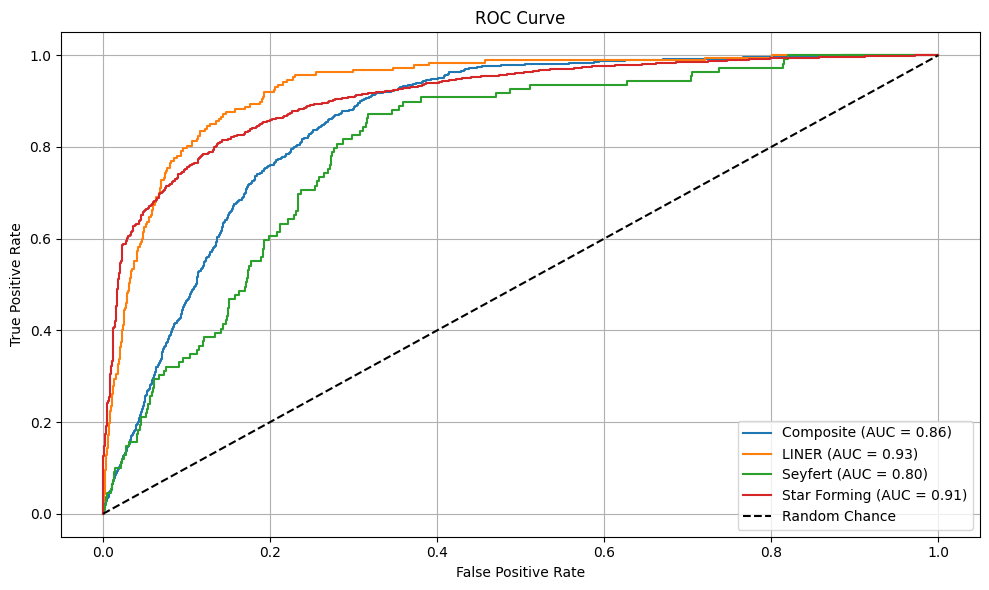

Accuracy: 0.839693192713327


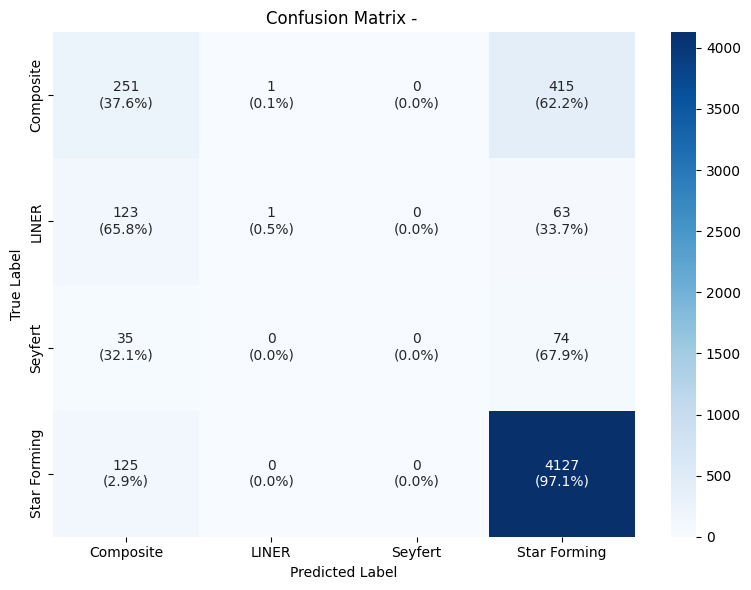

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.47      0.38      0.42       667
       LINER       0.50      0.01      0.01       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.88      0.97      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.46      0.34      0.34      5215
weighted avg       0.80      0.84      0.81      5215



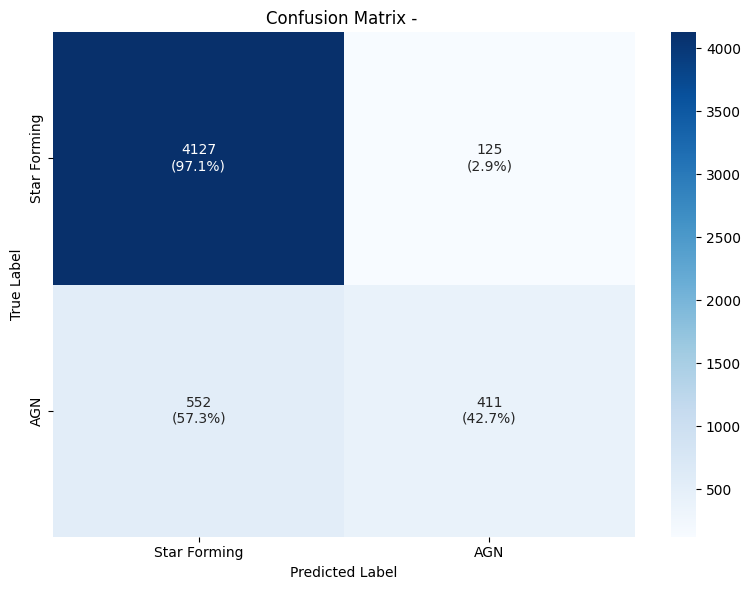

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.97      0.92      4252
         AGN       0.77      0.43      0.55       963

    accuracy                           0.87      5215
   macro avg       0.82      0.70      0.74      5215
weighted avg       0.86      0.87      0.85      5215



In [ ]:
y_pred = model.predict(X_test)
test_model(y_pred, y_test, class_names)

## Feature Selection

We test performance using a reduced input consisting only of the wide filters, since their use is more widespread. We apply standard color calculations both on the full set of filters and on the wide band subset. The information is extracted from the original filter measurements rather than the already normalized data, as normalization would otherwise alter the color calculations and cause the standard deviation of the set to differ from 1.

Results are within expectations: models trained with colors derived from all filters perform slightly better in AGN binary classification purity. This improvement could be due either to the indirect increase in features—from 12×N to 66×N—or to the colors carrying higher-quality information. Using only the wide filters results in a decrease in model capacity for AGN classification, but values remain above 70%, while models using color inputs from the wide bands reach around 75%.

In [ ]:
combined_filters, combined_filters_names = combine_filters(filters, filter_columns)
combined_filters = scaler.fit_transform(combined_filters)
wide_filters = filters[:,:5]
wide_filters = scaler.fit_transform(wide_filters)
combined_wide_filters, combined_wfilters_names = combine_filters(wide_filters, filter_columns[:5])
combined_wide_filters = scaler.fit_transform(combined_wide_filters)

In [ ]:
X_train_allc, X_test_allc, y_train_allc, y_test_allc = train_test_split(combined_filters, labels, test_size=0.2, random_state=42, stratify=labels)
X_train_wide, X_test_wide, y_train_wide, y_test_wide = train_test_split(wide_filters, labels, test_size=0.2, random_state=42, stratify=labels)
X_train_widec, X_test_widec, y_train_widec, y_test_widec = train_test_split(combined_wide_filters, labels, test_size=0.2, random_state=42, stratify=labels)

In [ ]:
model = get_classification_model(X_train_allc, [256, 128, 64, 32, 16, 8], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 66)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 256)            │        17,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 61,084 (238.61 KB)

 Trainable params: 61,084 (238.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_allc, y_train_allc, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.6993 - loss: 0.3849 - val_accuracy: 0.8351 - val_loss: 0.2206
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8336 - loss: 0.2094 - val_accuracy: 0.8310 - val_loss: 0.2167
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8326 - loss: 0.2076 - val_accuracy: 0.8375 - val_loss: 0.2104
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8380 - loss: 0.2028 - val_accuracy: 0.8322 - val_loss: 0.2109
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8386 - loss: 0.1984 - val_accuracy: 0.8370 - val_loss: 0.2096
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8367 - loss: 0.1972 - val_accuracy: 0.8380 - val_loss: 0.2067
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8408 - loss: 0.1922 - val_accuracy: 0.8368 - val_loss: 0.2052
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8380 - loss: 0.1932 - 

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


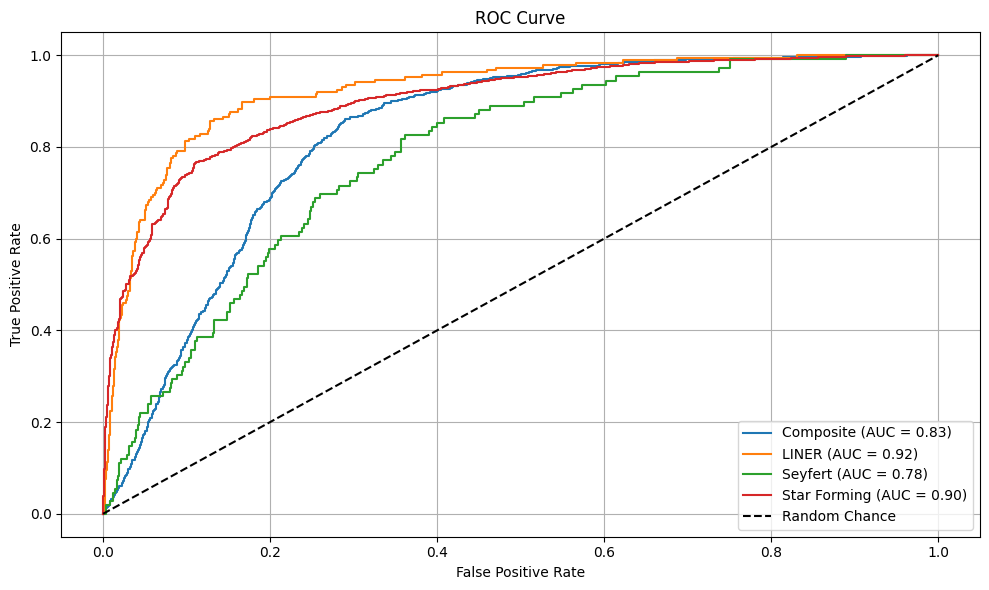

Accuracy: 0.8299137104506232


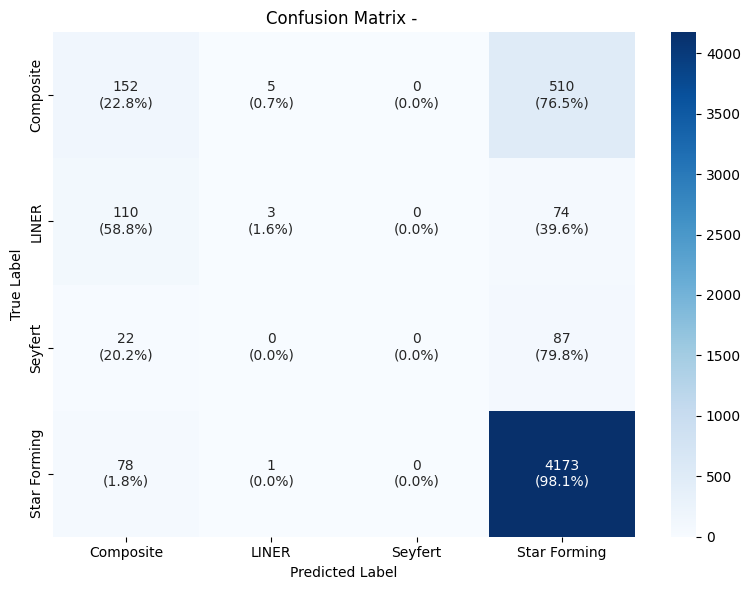

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.42      0.23      0.30       667
       LINER       0.33      0.02      0.03       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.86      0.98      0.92      4252

    accuracy                           0.83      5215
   macro avg       0.40      0.31      0.31      5215
weighted avg       0.77      0.83      0.79      5215



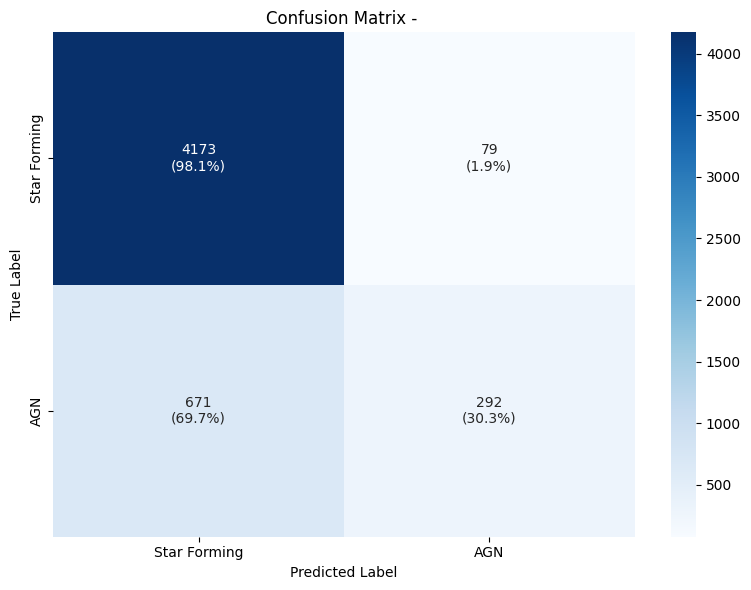

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.86      0.98      0.92      4252
         AGN       0.79      0.30      0.44       963

    accuracy                           0.86      5215
   macro avg       0.82      0.64      0.68      5215
weighted avg       0.85      0.86      0.83      5215



In [ ]:
y_pred = model.predict(X_test_allc)
test_model(y_pred, y_test_allc, class_names)

In [ ]:
model = get_classification_model(X_train_wide, [256, 128, 64, 32, 16, 8], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 5)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 256)            │         1,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 45,468 (177.61 KB)

 Trainable params: 45,468 (177.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_wide, y_train_wide, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.7782 - loss: 0.3089 - val_accuracy: 0.8231 - val_loss: 0.2092
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8249 - loss: 0.2126 - val_accuracy: 0.8236 - val_loss: 0.2153
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8319 - loss: 0.2020 - val_accuracy: 0.8327 - val_loss: 0.2050
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8363 - loss: 0.2004 - val_accuracy: 0.8334 - val_loss: 0.2016
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8361 - loss: 0.1986 - val_accuracy: 0.8308 - val_loss: 0.2000
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8288 - loss: 0.2090 - val_accuracy: 0.8317 - val_loss: 0.2022
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8335 - loss: 0.2001 - val_accuracy: 0.8349 - val_loss: 0.2046

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8279 - l

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


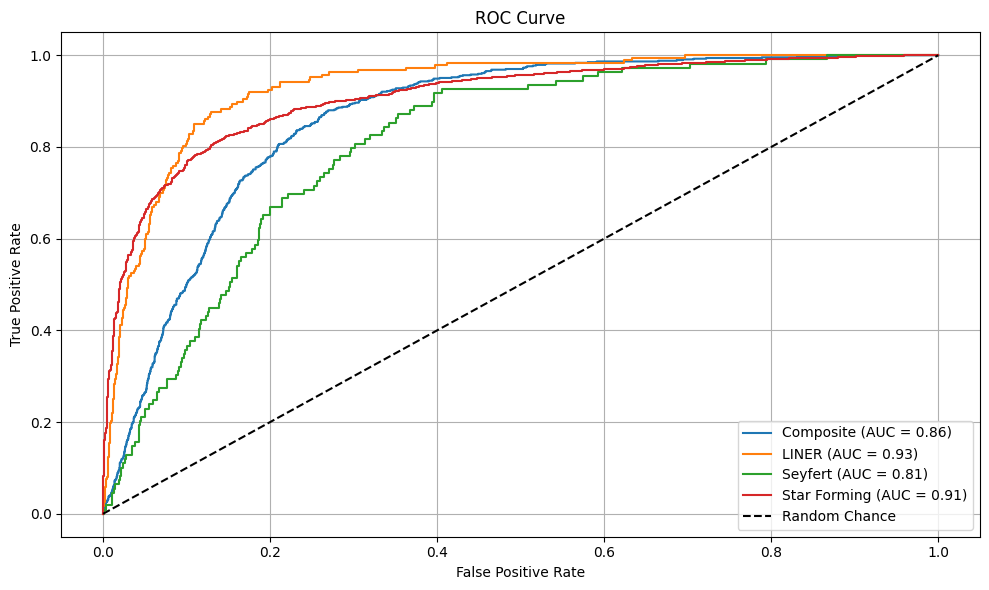

Accuracy: 0.8354745925215724


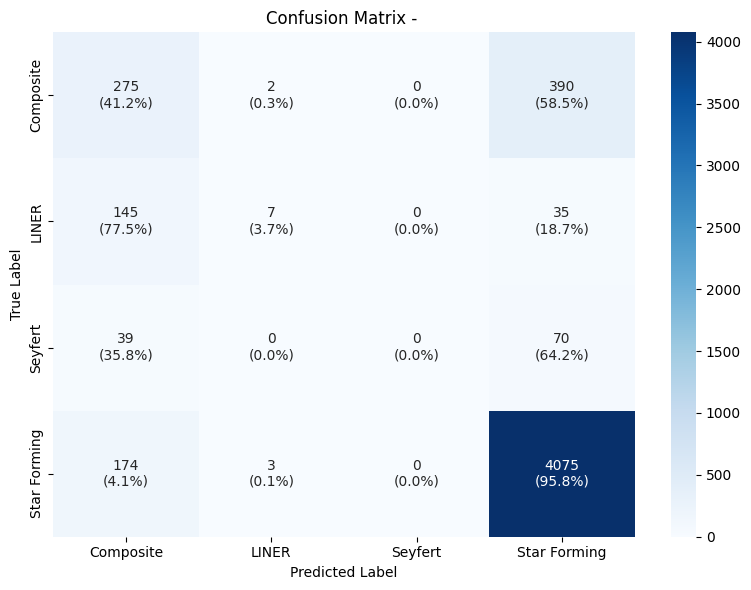

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.43      0.41      0.42       667
       LINER       0.58      0.04      0.07       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.89      0.96      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.48      0.35      0.35      5215
weighted avg       0.80      0.84      0.81      5215



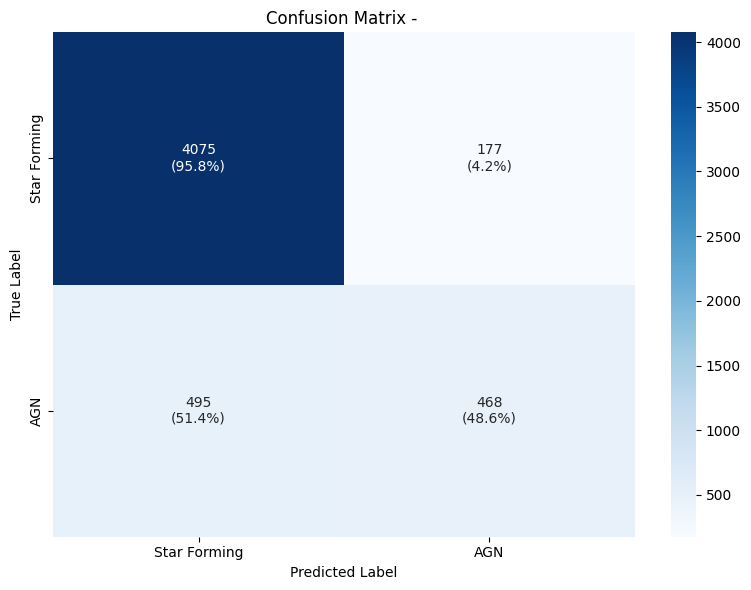

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.92      4252
         AGN       0.73      0.49      0.58       963

    accuracy                           0.87      5215
   macro avg       0.81      0.72      0.75      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test_wide)
test_model(y_pred, y_test_wide, class_names)

In [ ]:
model = get_classification_model(X_train_widec, [256, 128, 64, 32, 16, 8], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 256)            │         2,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,748 (182.61 KB)

 Trainable params: 46,748 (182.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_widec, y_train_widec, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8161 - loss: 0.3305 - val_accuracy: 0.8233 - val_loss: 0.2234
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8237 - loss: 0.2203 - val_accuracy: 0.8296 - val_loss: 0.2256
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8303 - loss: 0.2131 - val_accuracy: 0.8245 - val_loss: 0.2198
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8310 - loss: 0.2095 - val_accuracy: 0.8255 - val_loss: 0.2185
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8304 - loss: 0.2064 - val_accuracy: 0.8284 - val_loss: 0.2163
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8287 - loss: 0.2111 - val_accuracy: 0.8298 - val_loss: 0.2163
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8282 - loss: 0.2099 - val_accuracy: 0.8325 - val_loss: 0.2141
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8283 - loss: 0.2069 - v

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


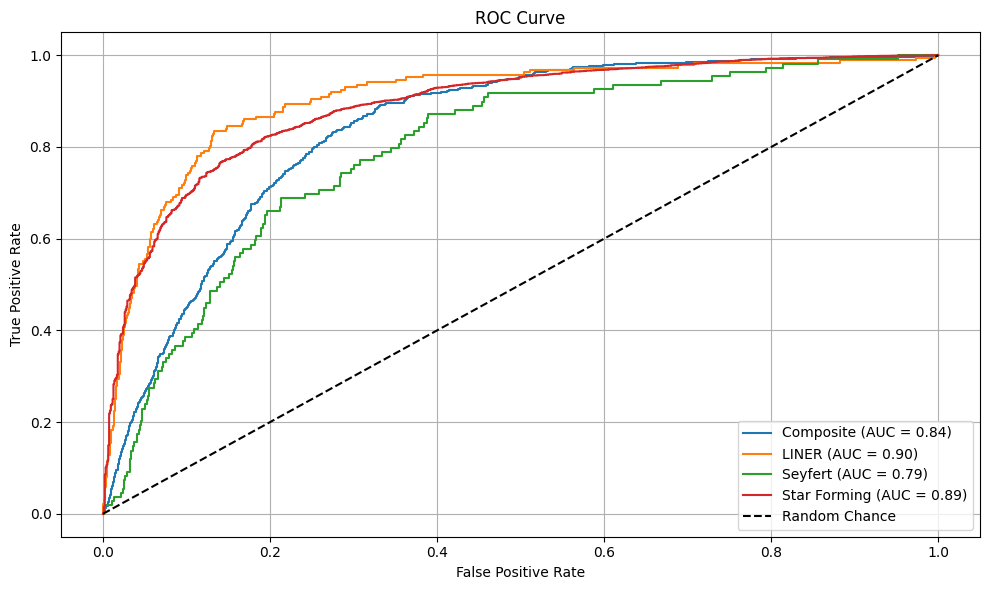

Accuracy: 0.8333652924256951


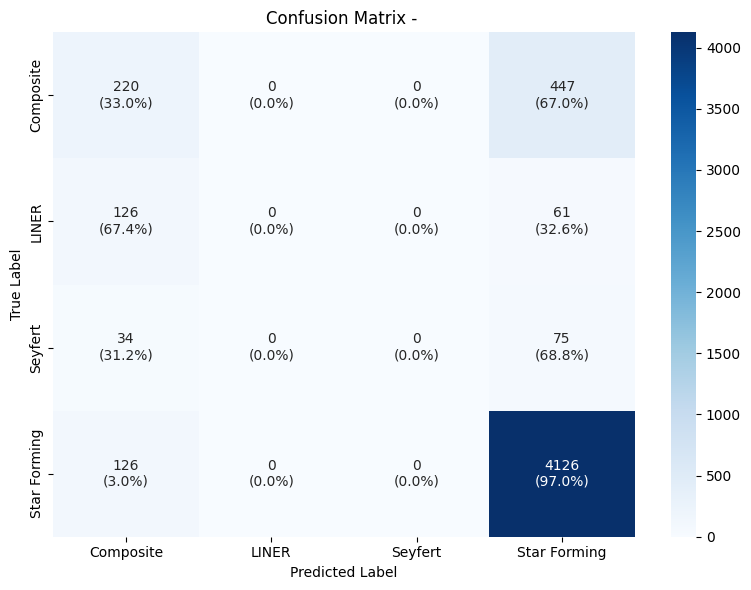

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.43      0.33      0.38       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.88      0.97      0.92      4252

    accuracy                           0.83      5215
   macro avg       0.33      0.33      0.32      5215
weighted avg       0.77      0.83      0.80      5215



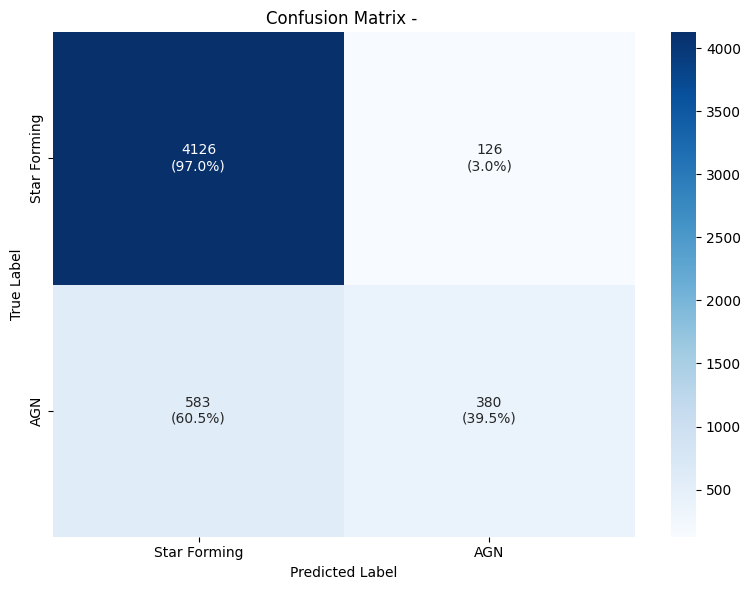

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.97      0.92      4252
         AGN       0.75      0.39      0.52       963

    accuracy                           0.86      5215
   macro avg       0.81      0.68      0.72      5215
weighted avg       0.85      0.86      0.85      5215



In [ ]:
y_pred = model.predict(X_test_widec)
test_model(y_pred, y_test_widec, class_names)

In [ ]:
model = get_classification_model(X_train_allc, [128,1024,128], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 66)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 128)            │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 272,388 (1.04 MB)

 Trainable params: 272,388 (1.04 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_allc, y_train_allc, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.8210 - loss: 0.2526 - val_accuracy: 0.8358 - val_loss: 0.2198
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8328 - loss: 0.2030 - val_accuracy: 0.8368 - val_loss: 0.2209
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8365 - loss: 0.2010 - val_accuracy: 0.8392 - val_loss: 0.2125
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - accuracy: 0.8408 - loss: 0.1948 - val_accuracy: 0.8392 - val_loss: 0.2099
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.8372 - loss: 0.1938 - val_accuracy: 0.8380 - val_loss: 0.2137
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - accuracy: 0.8373 - loss: 0.1919 - val_accuracy: 0.8358 - val_loss: 0.2192

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8410 - loss: 0.1978 - val_accuracy: 0.8377 - val_loss: 0.1942
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.842

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


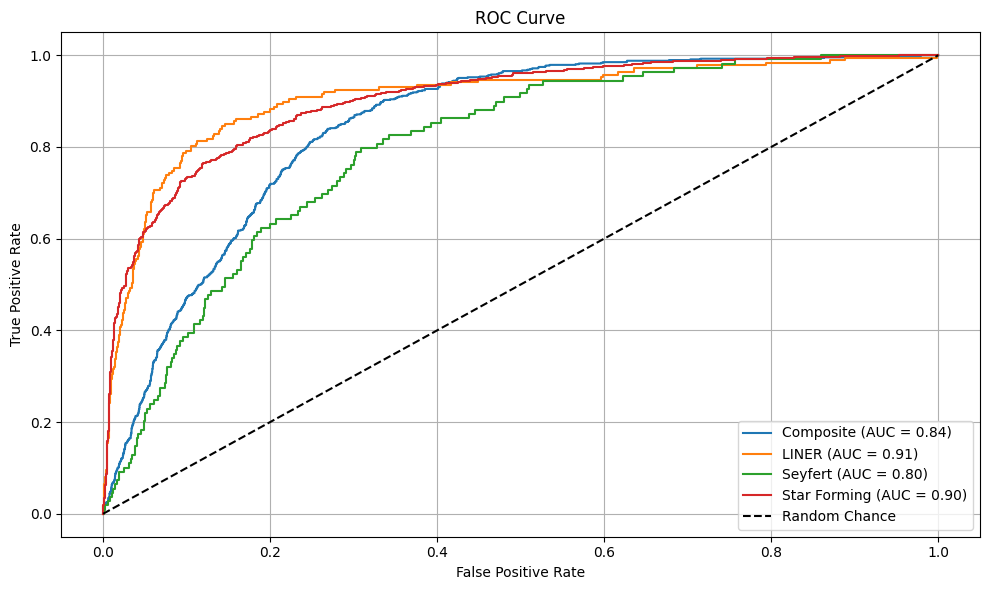

Accuracy: 0.8370086289549377


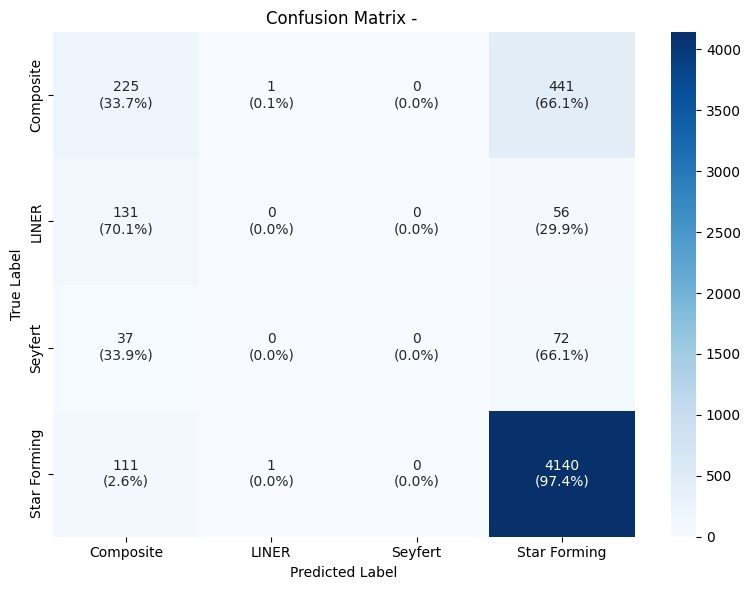

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.34      0.38       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.88      0.97      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.33      0.33      0.33      5215
weighted avg       0.77      0.84      0.80      5215



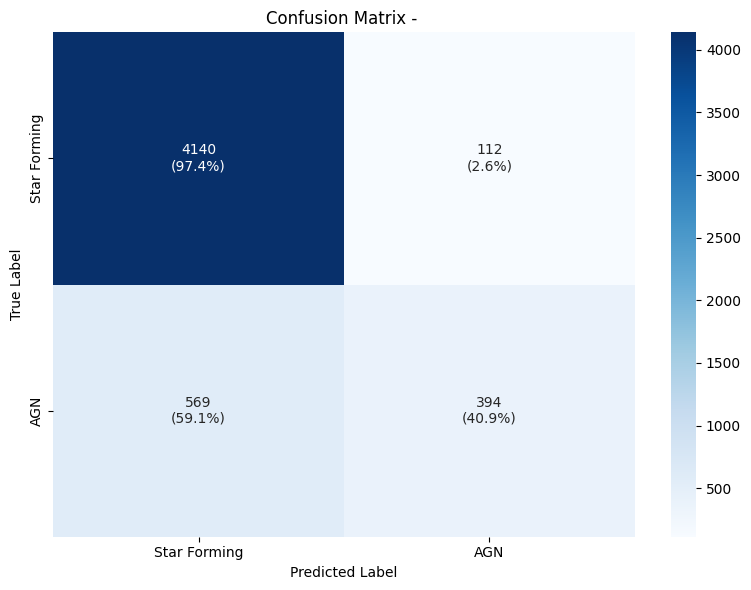

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.97      0.92      4252
         AGN       0.78      0.41      0.54       963

    accuracy                           0.87      5215
   macro avg       0.83      0.69      0.73      5215
weighted avg       0.86      0.87      0.85      5215



In [ ]:
y_pred = model.predict(X_test_allc)
test_model(y_pred, y_test_allc, class_names)

In [ ]:
model = get_classification_model(X_train_wide, [128,1024,128], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 5)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 128)            │           768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 264,580 (1.01 MB)

 Trainable params: 264,580 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_wide, y_train_wide, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.8121 - loss: 0.2575 - val_accuracy: 0.8349 - val_loss: 0.2150
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8286 - loss: 0.2055 - val_accuracy: 0.8327 - val_loss: 0.2036
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.8322 - loss: 0.2044 - val_accuracy: 0.8339 - val_loss: 0.2004
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.8354 - loss: 0.1991 - val_accuracy: 0.8358 - val_loss: 0.2007
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8330 - loss: 0.1985 - val_accuracy: 0.8380 - val_loss: 0.1998
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.8324 - loss: 0.1986 - val_accuracy: 0.8327 - val_loss: 0.2016
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.8294 - loss: 0.2002 - val_accuracy: 0.8356 - val_loss: 0.1984
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8385 - loss: 0.1908

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


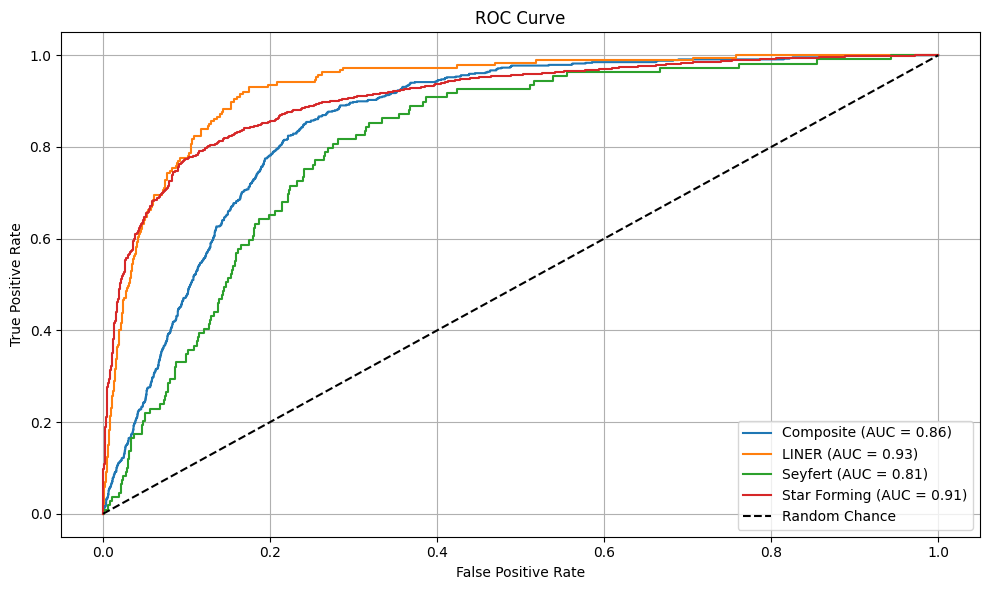

Accuracy: 0.8377756471716203


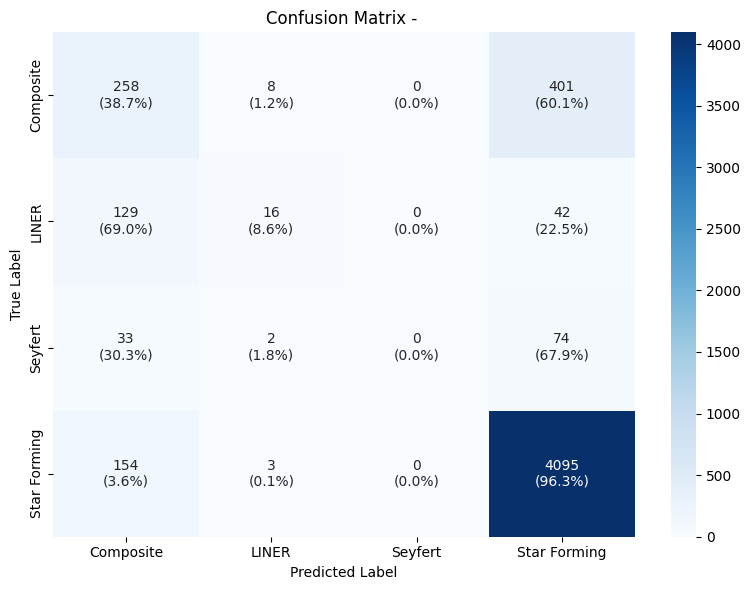

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.39      0.42       667
       LINER       0.55      0.09      0.15       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.89      0.96      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.47      0.36      0.37      5215
weighted avg       0.80      0.84      0.81      5215



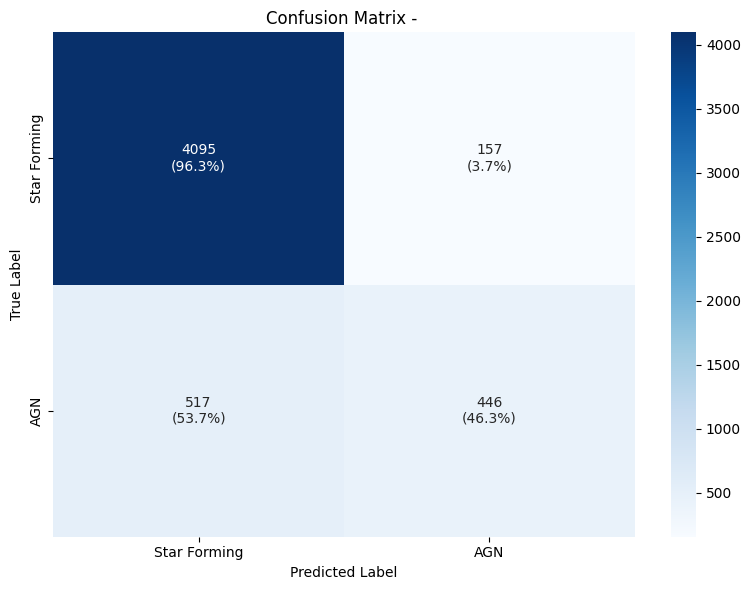

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.92      4252
         AGN       0.74      0.46      0.57       963

    accuracy                           0.87      5215
   macro avg       0.81      0.71      0.75      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test_wide)
test_model(y_pred, y_test_wide, class_names)

In [ ]:
model = get_classification_model(X_train_widec, [128,1024,128], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 128)            │         1,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 265,220 (1.01 MB)

 Trainable params: 265,220 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_widec, y_train_widec, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - accuracy: 0.8201 - loss: 0.2549 - val_accuracy: 0.8298 - val_loss: 0.2276
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8303 - loss: 0.2178 - val_accuracy: 0.8286 - val_loss: 0.2245
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.8259 - loss: 0.2143 - val_accuracy: 0.8286 - val_loss: 0.2213
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8317 - loss: 0.2088 - val_accuracy: 0.8310 - val_loss: 0.2143
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8263 - loss: 0.2170 - val_accuracy: 0.8322 - val_loss: 0.2128
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.8272 - loss: 0.2078 - val_accuracy: 0.8291 - val_loss: 0.2136
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8302 - loss: 0.2037 - val_accuracy: 0.8245 - val_loss: 0.2178

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8262 

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


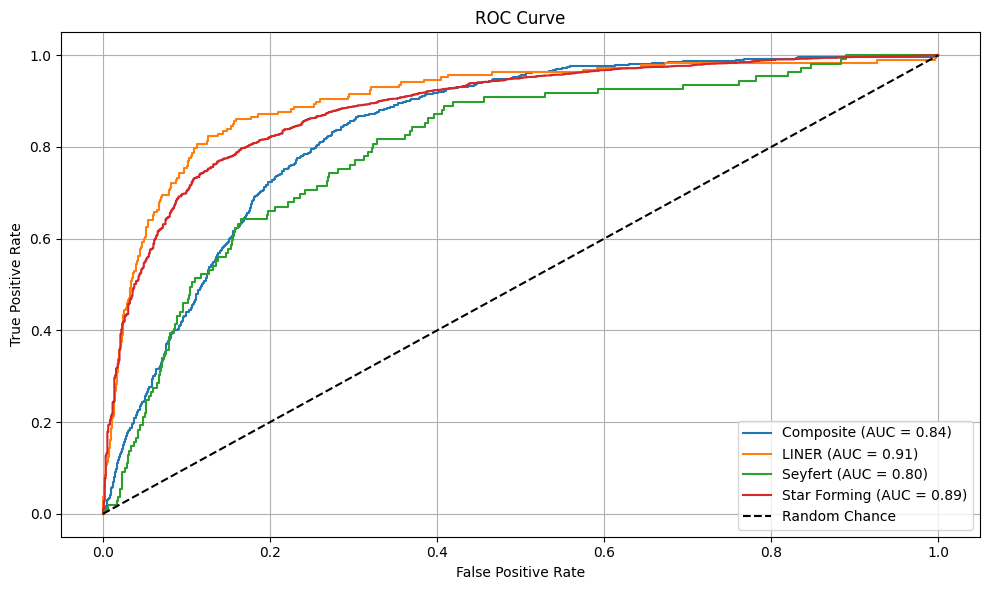

Accuracy: 0.8295302013422818


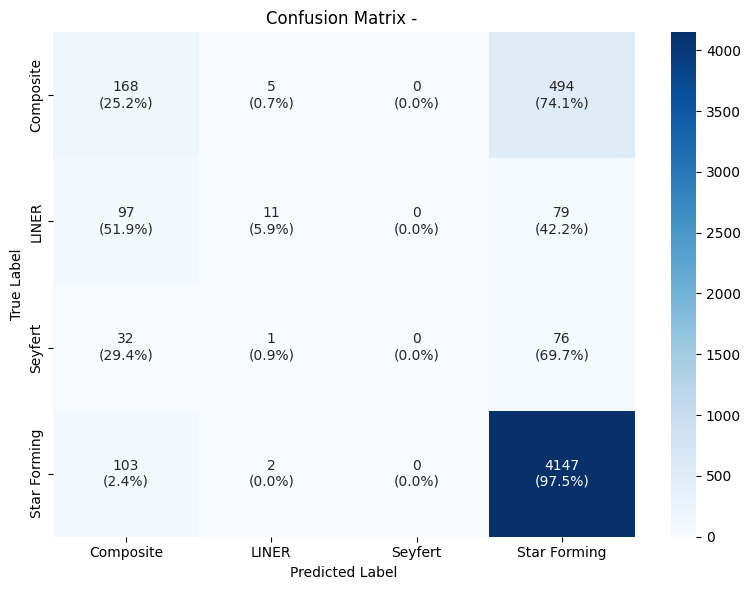

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.42      0.25      0.31       667
       LINER       0.58      0.06      0.11       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.86      0.98      0.92      4252

    accuracy                           0.83      5215
   macro avg       0.47      0.32      0.33      5215
weighted avg       0.78      0.83      0.79      5215



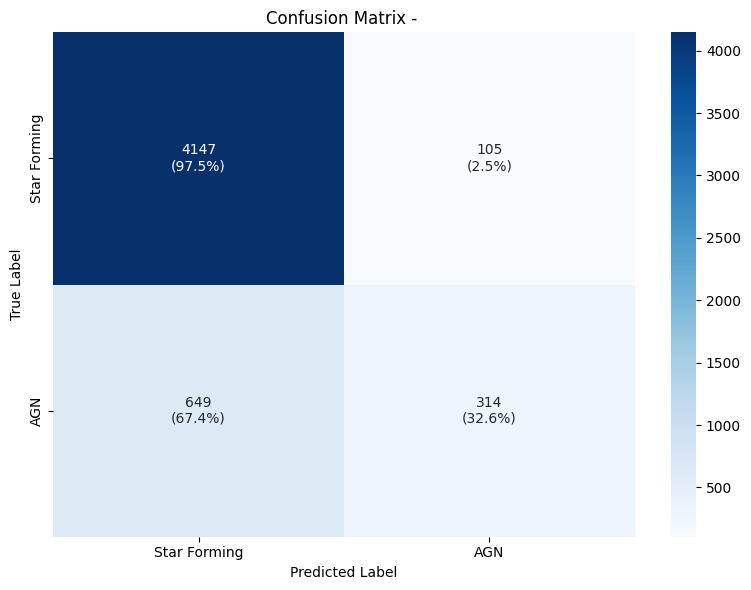

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.86      0.98      0.92      4252
         AGN       0.75      0.33      0.45       963

    accuracy                           0.86      5215
   macro avg       0.81      0.65      0.69      5215
weighted avg       0.84      0.86      0.83      5215



In [ ]:
y_pred = model.predict(X_test_widec)
test_model(y_pred, y_test_widec, class_names)

## Feature Selection and Regularization

The application of both dropout at 0.25 and feature engineering improves AGN purity detection of the IAM beyond the initial version of the model using the wide band combination, and also surpasses all previous versions that used the full filter set.

In [ ]:
model = get_classification_model_do(X_train_allc, [128,1024,128], class_names, 0.25)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

NameError: name 'X_train_allc' is not defined

In [ ]:
histories = k_fold_train(model, train_raw, X_train_allc, y_train_allc, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.8124 - loss: 0.2696 - val_accuracy: 0.8365 - val_loss: 0.2205
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8340 - loss: 0.2164 - val_accuracy: 0.8396 - val_loss: 0.2115
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.8349 - loss: 0.2119 - val_accuracy: 0.8387 - val_loss: 0.2125
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - accuracy: 0.8297 - loss: 0.2109 - val_accuracy: 0.8334 - val_loss: 0.2173

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8293 - loss: 0.2199 - val_accuracy: 0.8334 - val_loss: 0.2087
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.8358 - loss: 0.2052 - val_accuracy: 0.8382 - val_loss: 0.2041
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8351 - loss: 0.2110 - val_accuracy: 0.8339 - val_loss: 0.2104
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - accuracy: 0.83

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


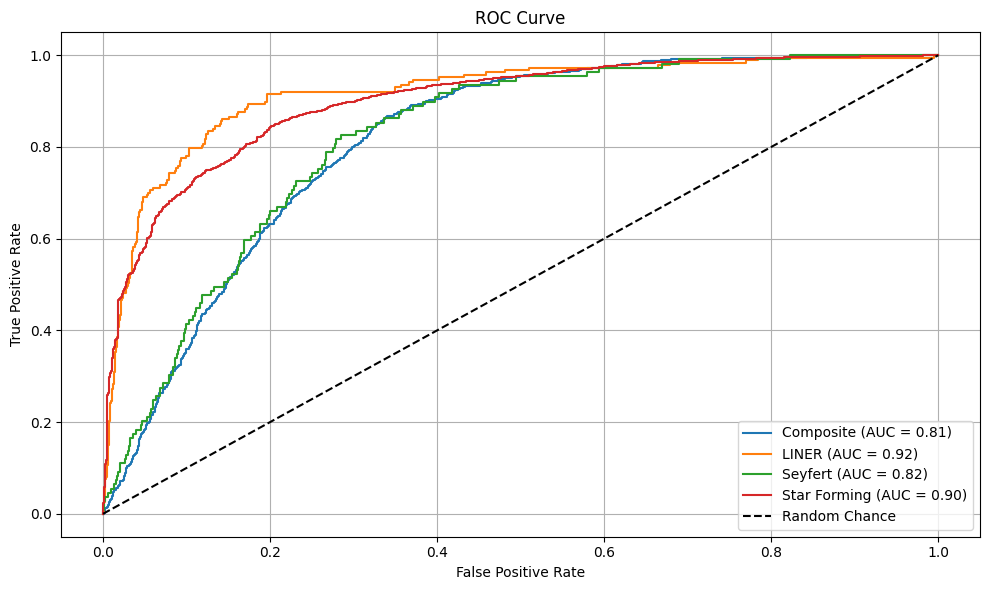

Accuracy: 0.8372003835091083


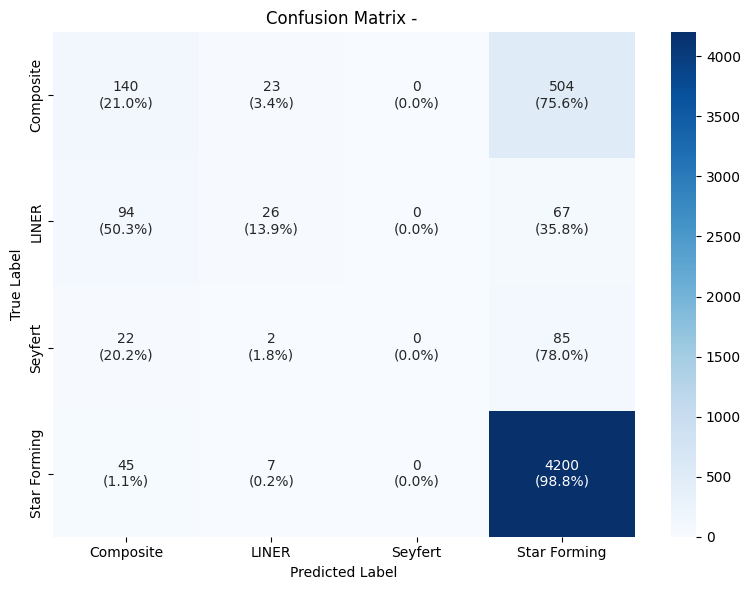

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.47      0.21      0.29       667
       LINER       0.45      0.14      0.21       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.86      0.99      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.44      0.33      0.36      5215
weighted avg       0.78      0.84      0.80      5215



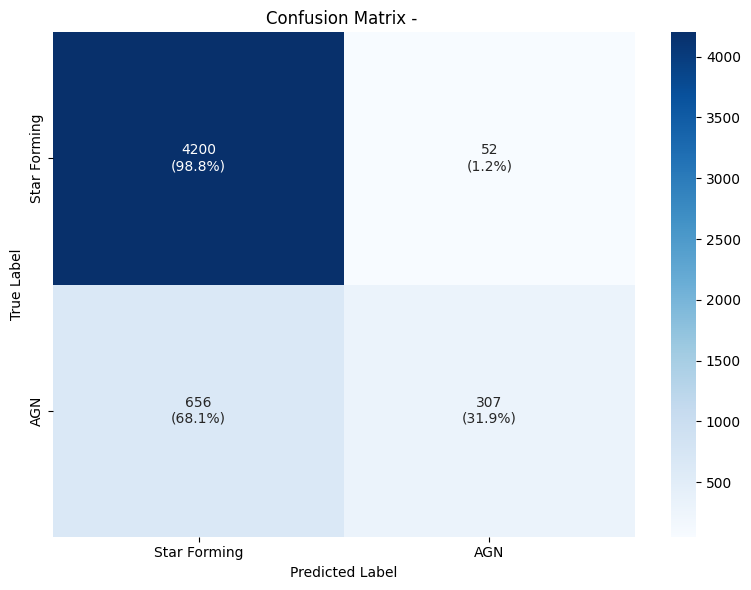

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.86      0.99      0.92      4252
         AGN       0.86      0.32      0.46       963

    accuracy                           0.86      5215
   macro avg       0.86      0.65      0.69      5215
weighted avg       0.86      0.86      0.84      5215



In [ ]:
y_pred = model.predict(X_test_allc)
test_model(y_pred, y_test_allc, class_names)

In [ ]:
model = get_classification_model_do(X_train_widec, [128,1024,128], class_names, 0.25)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 128)            │         1,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 265,220 (1.01 MB)

 Trainable params: 265,220 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_widec, y_train_widec, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.8158 - loss: 0.2590 - val_accuracy: 0.8262 - val_loss: 0.2246
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8296 - loss: 0.2218 - val_accuracy: 0.8269 - val_loss: 0.2257
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.8262 - loss: 0.2187 - val_accuracy: 0.8284 - val_loss: 0.2185
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8228 - loss: 0.2245 - val_accuracy: 0.8289 - val_loss: 0.2181
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - accuracy: 0.8267 - loss: 0.2161 - val_accuracy: 0.8293 - val_loss: 0.2188
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8319 - loss: 0.2088 - val_accuracy: 0.8313 - val_loss: 0.2142
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8257 - loss: 0.2151 - val_accuracy: 0.8255 - val_loss: 0.2196
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8302 - loss: 0.204

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


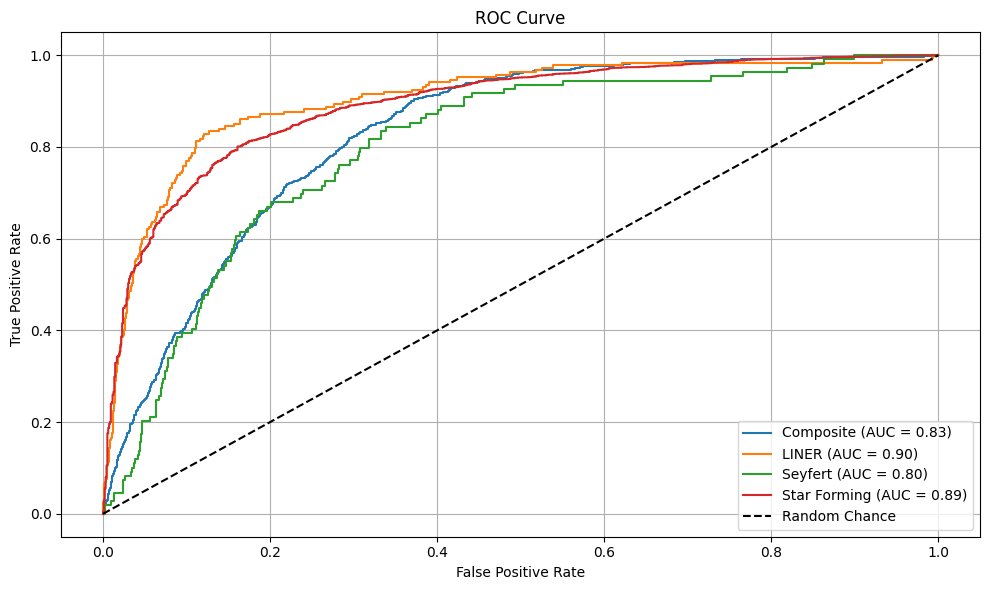

Accuracy: 0.8262703739213806


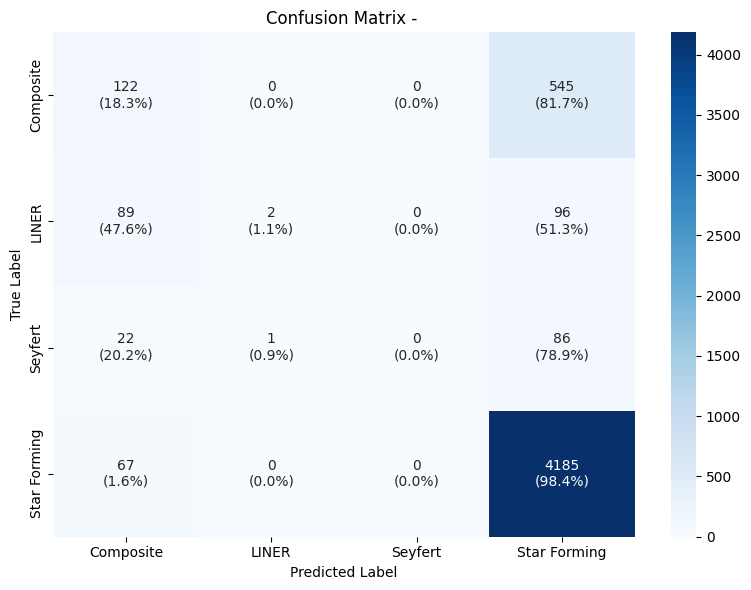

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.41      0.18      0.25       667
       LINER       0.67      0.01      0.02       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.85      0.98      0.91      4252

    accuracy                           0.83      5215
   macro avg       0.48      0.29      0.30      5215
weighted avg       0.77      0.83      0.78      5215



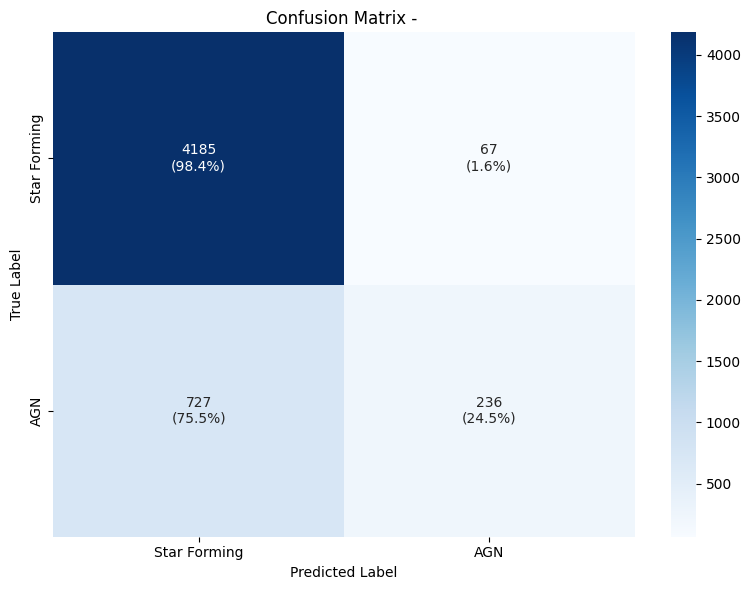

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.85      0.98      0.91      4252
         AGN       0.78      0.25      0.37       963

    accuracy                           0.85      5215
   macro avg       0.82      0.61      0.64      5215
weighted avg       0.84      0.85      0.81      5215



In [ ]:
y_pred = model.predict(X_test_widec)
test_model(y_pred, y_test_widec, class_names)

## Binary Approach

The first approach to binary classification was performed alongside the multi-class classification and involved combining the Seyfert, Liner, and Compound classes into a single AGN class. The models demonstrate good purity, above 75% in most cases, particularly when using color calculations from all filters combined with regularization.

The second approach separates the samples into AGN and StarForming categories prior to classification. We train the LCM and IAM (with dropout) models for binary classification using color calculations from both the wide filter set and the full filter set, then compare their results to those from the multi-class classification counterparts.

In [ ]:
binary_y_train = np.where((y_train == 3), 0, 1)
binary_y_test = np.where((y_test == 3), 0, 1)
binary_y_train_allc = np.where((y_train_allc == 3), 0, 1)
binary_y_test_allc = np.where((y_test_allc == 3), 0, 1)
binary_y_train_widec = np.where((y_train_widec == 3), 0, 1)
binary_y_test_widec = np.where((y_test_widec == 3), 0, 1)

## Base Line for Binary Classification

The simplest baseline would be to classify all samples as StarForming, resulting in an accuracy of 81.39%. However, since our focus is on AGN precision, establishing a meaningful common-sense baseline is less straightforward. Therefore, we use a Random Forest model to set a more consistent baseline.

This Random Forest model is smaller than previous models, with a memory footprint of about 10 KB and approximately 338,964 nodes. It achieves around 70% precision and 50% recall for AGN classification, although these values can vary slightly depending on the random state parameter. The first binary approach using the Random Forest yields similar results, with higher precision but lower recall.

In [ ]:
rf_bclf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_bclf.fit(X_train, binary_y_train)

RandomForestClassifier(random_state=42)

In [ ]:
random_forest_summary(rf_bclf)

Random Forest Summary:
- Number of Trees      : 100
- Nodes per Tree       : min = 3223, max = 3547, avg = 3389.64
- Approx. Memory Usage : 10.16 KB


Accuracy: 0.8732502396931927


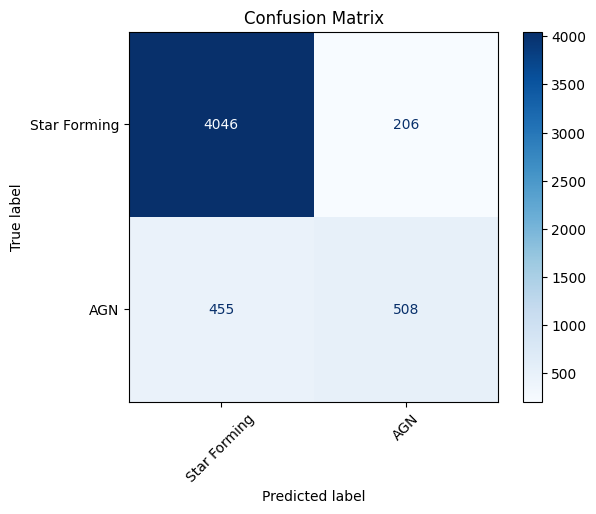

Classification Report:
               precision    recall  f1-score   support

Star Forming       0.90      0.95      0.92      4252
         AGN       0.71      0.53      0.61       963

    accuracy                           0.87      5215
   macro avg       0.81      0.74      0.77      5215
weighted avg       0.86      0.87      0.87      5215



In [ ]:
y_pred = rf_bclf.predict(X_test)

print("Accuracy:", accuracy_score(binary_y_test, y_pred))

cm = confusion_matrix(binary_y_test, y_pred)

# Display it with class labels
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=binary_class_names)
disp.plot(cmap='Blues', xticks_rotation=45)
plt.title("Confusion Matrix")
plt.show()

print("Classification Report:\n", classification_report(binary_y_test, y_pred, target_names=binary_class_names))

## Binary Classification with NN

Models present higher accuracy rates compared to their multi-class counterparts, but this is because, as binary classifiers, they have less room to make mistakes.

The LCM model shows similar values in both approaches, with the largest difference observed in recall when using full-color inputs—around 0.1.

The IAM model achieves higher precision in the first approach, with a difference of about 0.1, but at the cost of lower recall. The recall gaps are approximately 0.1 for full-color inputs and 0.2 for wide-color inputs.

In [ ]:
model = get_classification_model(X_train_allc, [256, 128, 64, 32, 16, 8], binary_class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 66)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        17,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 2)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 61,066 (238.54 KB)

 Trainable params: 61,066 (238.54 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_allc, binary_y_train_allc, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.8500 - loss: 0.0929 - val_accuracy: 0.8600 - val_loss: 0.0851
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8700 - loss: 0.0794 - val_accuracy: 0.8694 - val_loss: 0.0787
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8716 - loss: 0.0769 - val_accuracy: 0.8703 - val_loss: 0.0784
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8716 - loss: 0.0789 - val_accuracy: 0.8696 - val_loss: 0.0795
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8746 - loss: 0.0760 - val_accuracy: 0.8646 - val_loss: 0.0790

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8710 - loss: 0.0791 - val_accuracy: 0.8742 - val_loss: 0.0802
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.8758 - loss: 0.0759 - val_accuracy: 0.8720 - val_loss: 0.0798
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - accuracy: 0.8718 - 

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


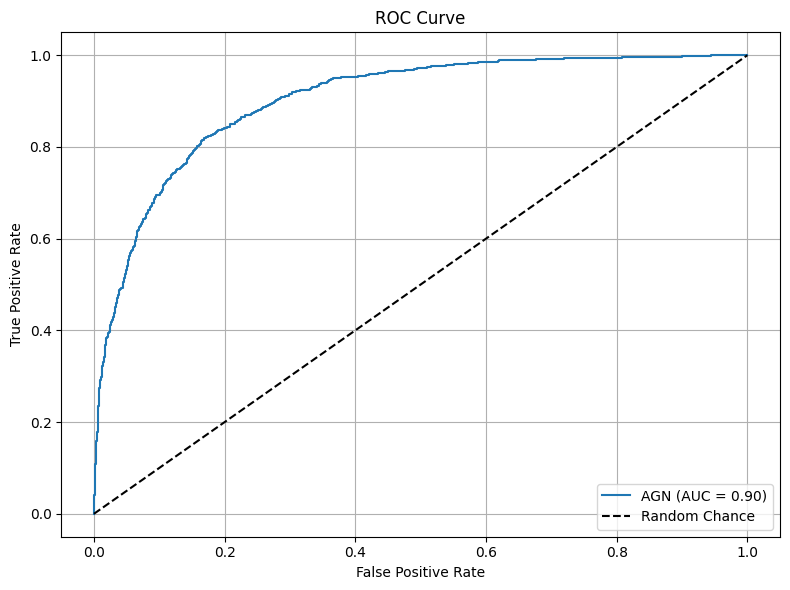

Accuracy: 0.8726749760306808


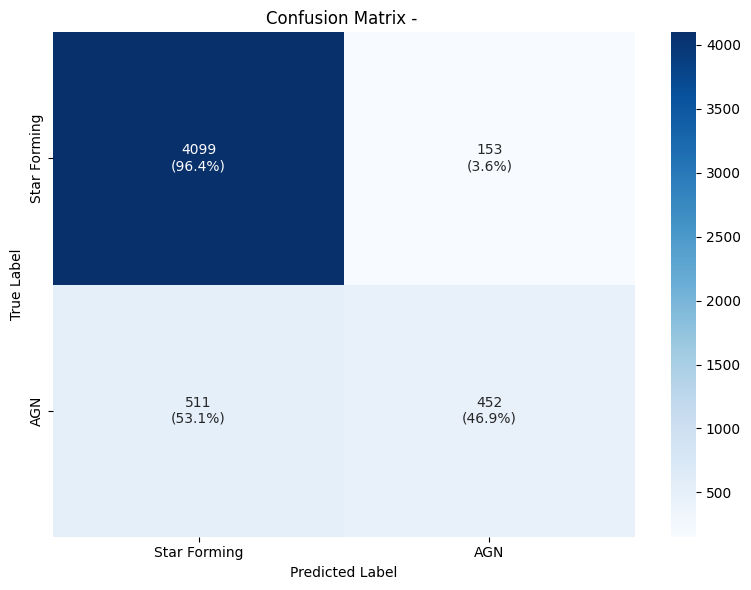

Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.93      4252
         AGN       0.75      0.47      0.58       963

    accuracy                           0.87      5215
   macro avg       0.82      0.72      0.75      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
y_pred = model.predict(X_test_allc)
test_model(y_pred, binary_y_test_allc, binary_class_names)

In [ ]:
model = get_classification_model(X_train_widec, [256, 128, 64, 32, 16, 8], binary_class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 256)            │         2,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 2)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,730 (182.54 KB)

 Trainable params: 46,730 (182.54 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_widec, binary_y_train_widec, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8382 - loss: 0.1016 - val_accuracy: 0.8677 - val_loss: 0.0835
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8605 - loss: 0.0847 - val_accuracy: 0.8619 - val_loss: 0.0820
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8626 - loss: 0.0830 - val_accuracy: 0.8670 - val_loss: 0.0811
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8612 - loss: 0.0830 - val_accuracy: 0.8603 - val_loss: 0.0831
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8618 - loss: 0.0823 - val_accuracy: 0.8531 - val_loss: 0.0824

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8594 - loss: 0.0823 - val_accuracy: 0.8648 - val_loss: 0.0859
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8690 - loss: 0.0806 - val_accuracy: 0.8583 - val_loss: 0.0832
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8638 - l

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


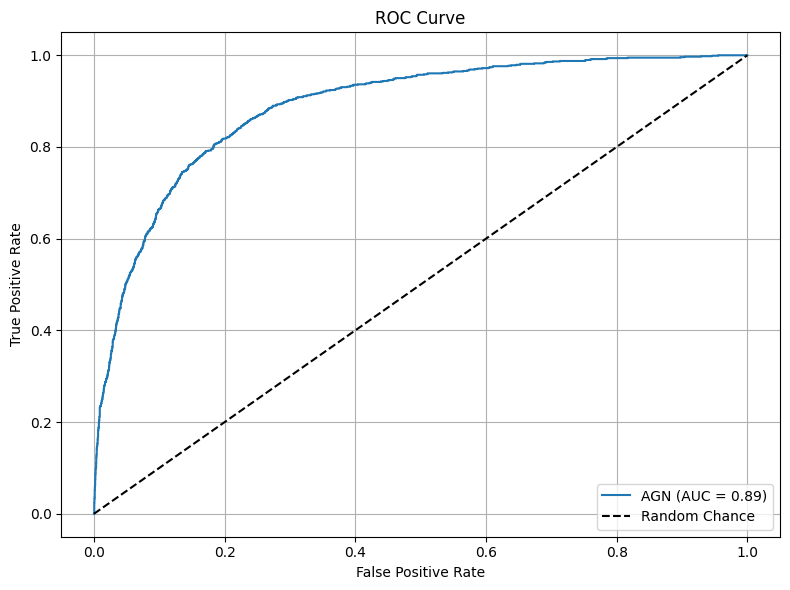

Accuracy: 0.8607861936720997


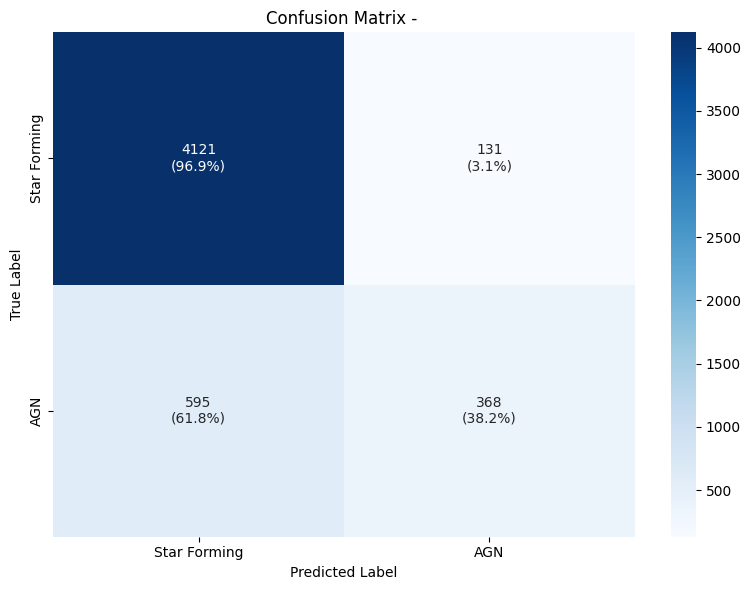

Classification Report:
               precision    recall  f1-score   support

Star Forming       0.87      0.97      0.92      4252
         AGN       0.74      0.38      0.50       963

    accuracy                           0.86      5215
   macro avg       0.81      0.68      0.71      5215
weighted avg       0.85      0.86      0.84      5215



In [ ]:
y_pred = model.predict(X_test_widec)
test_model(y_pred, binary_y_test_widec, binary_class_names)

In [ ]:
model = get_classification_model_do(X_train_allc, [128,1024,128], binary_class_names, 0.25)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 66)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 128)            │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 272,130 (1.04 MB)

 Trainable params: 272,130 (1.04 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_allc, binary_y_train_allc, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 15s 17ms/step - accuracy: 0.8370 - loss: 0.1090 - val_accuracy: 0.8646 - val_loss: 0.0830
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.8653 - loss: 0.0843 - val_accuracy: 0.8607 - val_loss: 0.0820
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - accuracy: 0.8651 - loss: 0.0816 - val_accuracy: 0.8761 - val_loss: 0.0793
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.8687 - loss: 0.0802 - val_accuracy: 0.8701 - val_loss: 0.0807
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8664 - loss: 0.0825 - val_accuracy: 0.8730 - val_loss: 0.0781
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8717 - loss: 0.0814 - val_accuracy: 0.8730 - val_loss: 0.0803
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - accuracy: 0.8713 - loss: 0.0792 - val_accuracy: 0.8751 - val_loss: 0.0778
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - accuracy: 0.8713 - loss: 0.

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


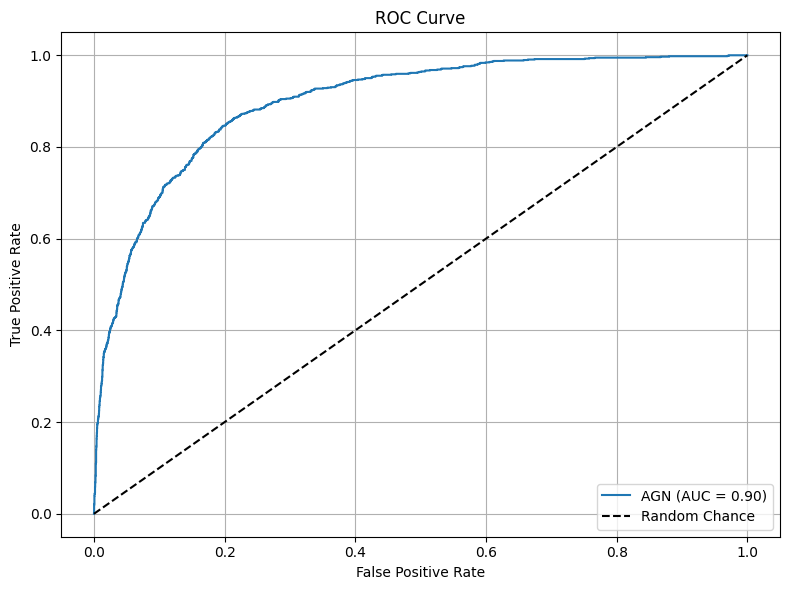

Accuracy: 0.8692233940556088


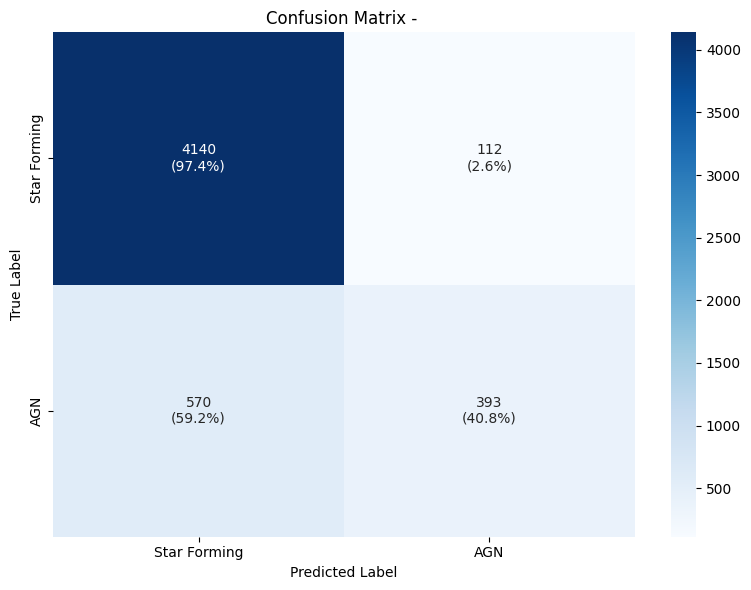

Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.97      0.92      4252
         AGN       0.78      0.41      0.54       963

    accuracy                           0.87      5215
   macro avg       0.83      0.69      0.73      5215
weighted avg       0.86      0.87      0.85      5215



In [ ]:
y_pred = model.predict(X_test_allc)
test_model(y_pred, binary_y_test_allc, binary_class_names)

In [ ]:
model = get_classification_model_do(X_train_widec, [128,1024,128], binary_class_names, 0.25)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 128)            │         1,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 264,962 (1.01 MB)

 Trainable params: 264,962 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_widec, binary_y_train_widec, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - accuracy: 0.8371 - loss: 0.1009 - val_accuracy: 0.8646 - val_loss: 0.0840
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 12s 16ms/step - accuracy: 0.8552 - loss: 0.0890 - val_accuracy: 0.8634 - val_loss: 0.0832
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - accuracy: 0.8594 - loss: 0.0862 - val_accuracy: 0.8660 - val_loss: 0.0825
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.8587 - loss: 0.0875 - val_accuracy: 0.8627 - val_loss: 0.0824
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.8587 - loss: 0.0853 - val_accuracy: 0.8607 - val_loss: 0.0816
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.8559 - loss: 0.0835 - val_accuracy: 0.8641 - val_loss: 0.0812
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.8639 - loss: 0.0829 - val_accuracy: 0.8651 - val_loss: 0.0809
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8611 - loss

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


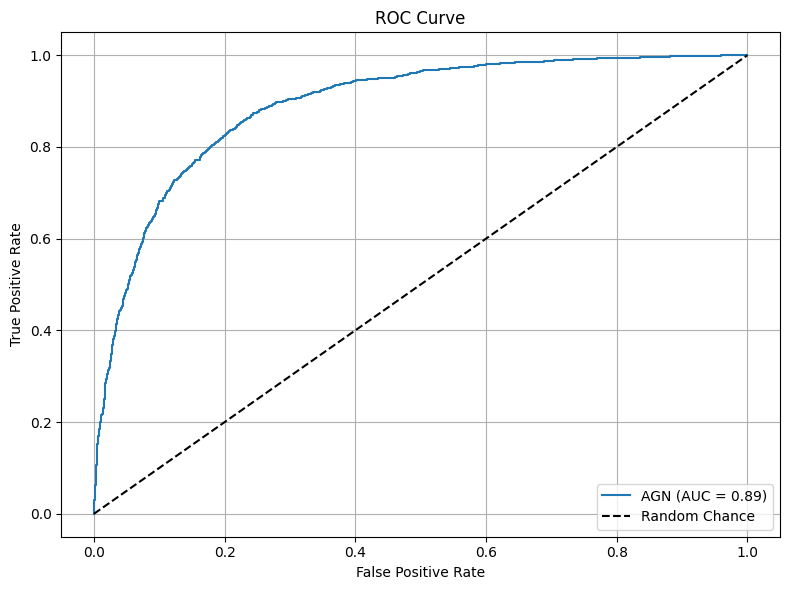

Accuracy: 0.8646212847555129


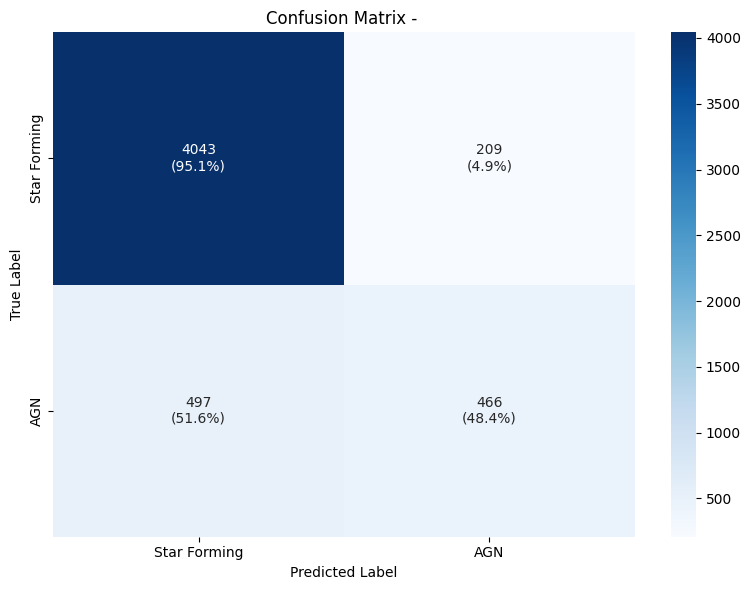

Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.95      0.92      4252
         AGN       0.69      0.48      0.57       963

    accuracy                           0.86      5215
   macro avg       0.79      0.72      0.74      5215
weighted avg       0.85      0.86      0.85      5215



In [ ]:
y_pred = model.predict(X_test_widec)
test_model(y_pred, binary_y_test_widec, binary_class_names)

## Threshold Balancing


As we mentioned before, multiclass classification models present discrepancies between the results of the ROC curve and the confusion matrix. ROC curves show values above 70 for Seyfert and LINERs in all cases and above 80 in some, but the confusion matrix shows that the models do not manage to accurately classify samples in those classes.

This means that while the models have a good chance of classifying the samples correctly, the final step of selecting a class is failing. We are assigning a sample to the class with the highest probability according to the model output, but either due to imbalance in the data or the nature of the problem—where the classes are closely related and the photometric data may not provide enough information—this approach is not well-suited.

In the literature, there is prior use of custom thresholds for specific problems.
To get an idea of the threshold values for each class, we separate the model outputs based on their true classes and plot the probability distributions. It is possible to observe that there is overlap in the probabilities but, although the distributions are similar, there is a difference in the proportions of the probabilities for each true class, with Seyfert and Compounds being the more ambiguous.

We use this as a reference to implement selection constraints. Our selection constraints impose requirements on the probability distribution our model extracts for each class instead of using a single threshold per class. As each sample can satisfy either more than one or none of the constraints to assign the class, we first select as candidates the classes for which the constraints are fulfilled. If no constraint is satisfied, all classes are considered candidates. Then, in case there is more than one candidate, we select the one with the lowest difference between the probability distribution and the constraint. In the rare case that there is still more than one competing candidate, we fall back to choosing between them using the maximum probability of belonging to the class.

This approach has increased optimization complexity but allows for better fine-tuning and adjustment of the thresholds according to the metric of interest. Using loosely adjusted thresholds, we were able to increase the precision of the model predictions. We believe further optimization can lead to better results.

In [ ]:
model = get_classification_model(X_train_allc, [256, 128, 64, 32, 16, 8], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 66)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 256)            │        17,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 61,084 (238.61 KB)

 Trainable params: 61,084 (238.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_allc, y_train_allc, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8190 - loss: 0.2936 - val_accuracy: 0.8269 - val_loss: 0.2208
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.8343 - loss: 0.2074 - val_accuracy: 0.8344 - val_loss: 0.2109
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8370 - loss: 0.2035 - val_accuracy: 0.8408 - val_loss: 0.2061
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8359 - loss: 0.1975 - val_accuracy: 0.8396 - val_loss: 0.2061
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8390 - loss: 0.1934 - val_accuracy: 0.8425 - val_loss: 0.2081

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8368 - loss: 0.1994 - val_accuracy: 0.8339 - val_loss: 0.2041
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8392 - loss: 0.1947 - val_accuracy: 0.8370 - val_loss: 0.1998
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8362 - l

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


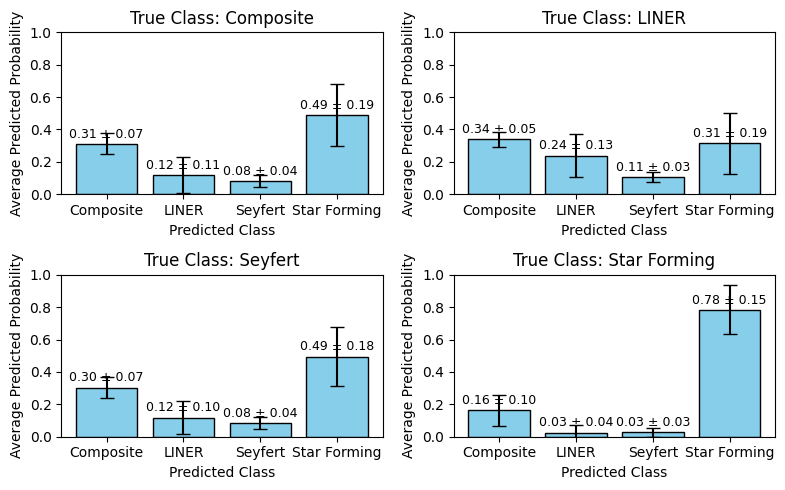

In [ ]:
y_pred_prob = model.predict(X_test_allc)
plot_avg_softmax_per_true_class(y_test_allc, y_pred_prob, class_names)

In [ ]:
threshold_rules = [
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Composite
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Liner
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Seyfert
    [(0.3, -1), (0.1, -1), (0.1, -1), (0.4, +1)],  # StarForming
]

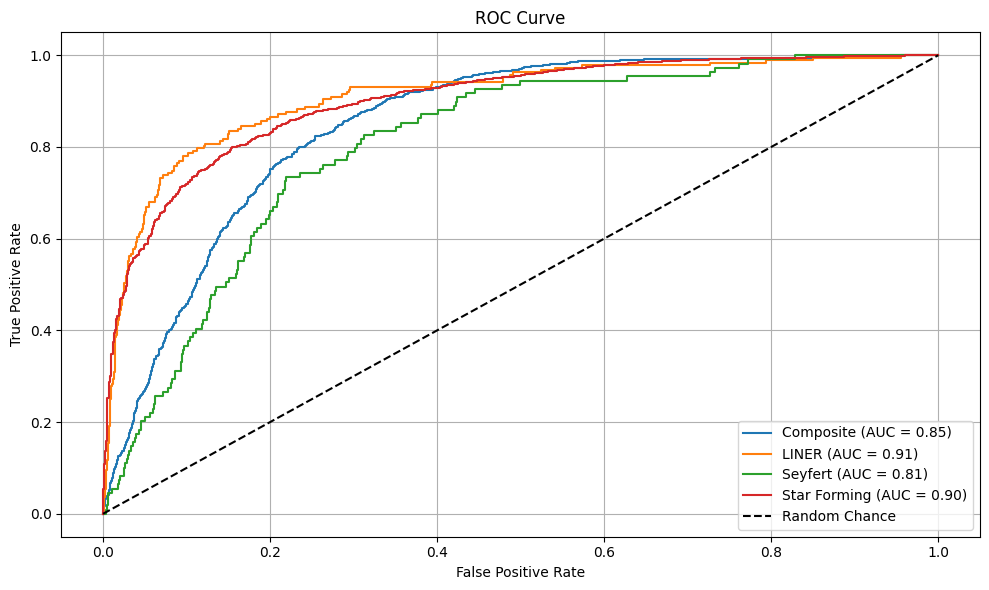

Accuracy: 0.8387344199424737


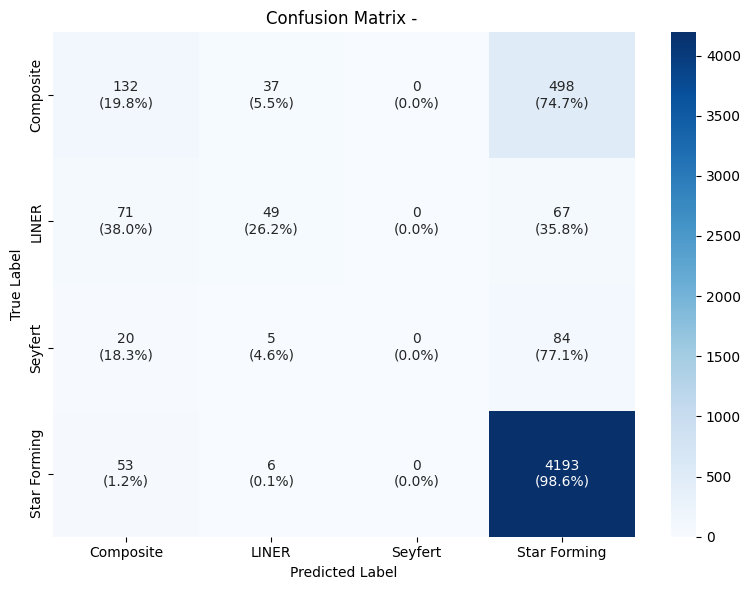

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.48      0.20      0.28       667
       LINER       0.51      0.26      0.35       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.87      0.99      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.46      0.36      0.39      5215
weighted avg       0.79      0.84      0.80      5215



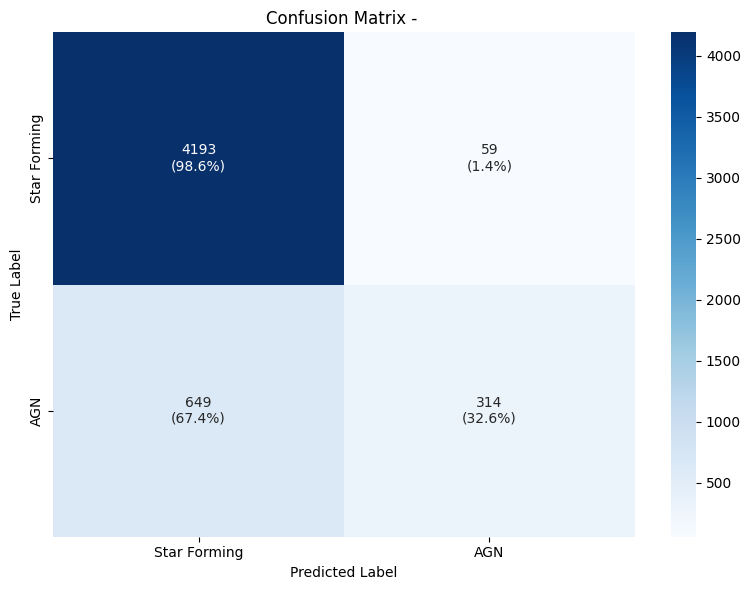

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.87      0.99      0.92      4252
         AGN       0.84      0.33      0.47       963

    accuracy                           0.86      5215
   macro avg       0.85      0.66      0.70      5215
weighted avg       0.86      0.86      0.84      5215



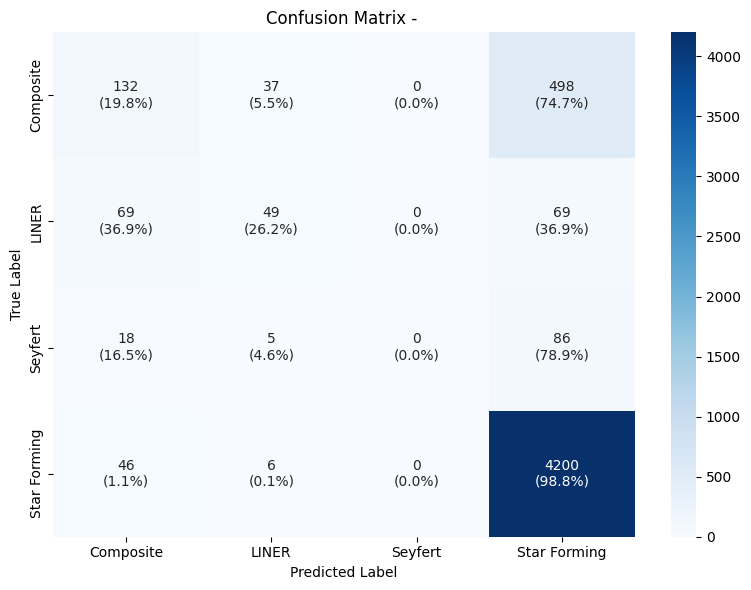

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.50      0.20      0.28       667
       LINER       0.51      0.26      0.35       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.87      0.99      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.47      0.36      0.39      5215
weighted avg       0.79      0.84      0.80      5215



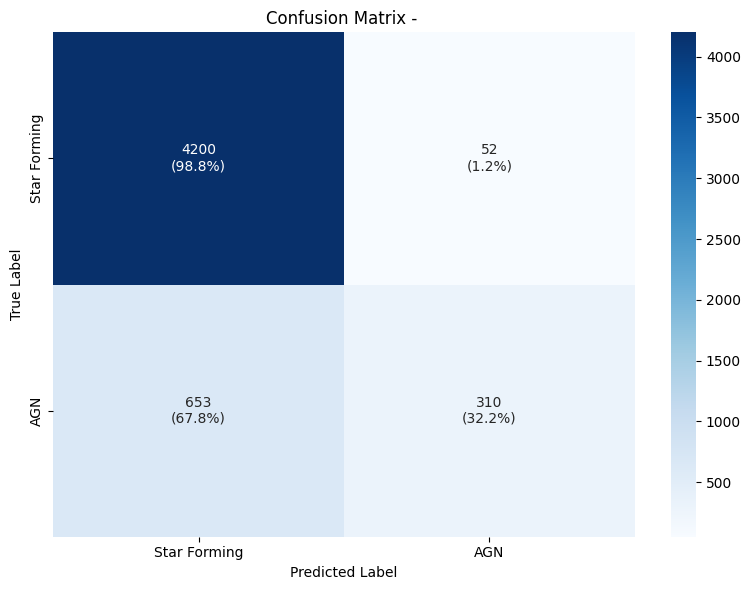

              precision    recall  f1-score   support

Star Forming       0.87      0.99      0.92      4252
         AGN       0.86      0.32      0.47       963

    accuracy                           0.86      5215
   macro avg       0.86      0.65      0.70      5215
weighted avg       0.86      0.86      0.84      5215



In [ ]:
test_model(y_pred_prob, y_test_allc, class_names)

y_pred = predict_with_thresholds(y_pred_prob, threshold_rules)

cm = confusion_matrix(y_test_allc, y_pred)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, y_pred, target_names=class_names))

binary_y_true, binary_y_pred = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_y_pred)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_y_pred, target_names=binary_class_names))

In [ ]:
model = get_classification_model_do(X_train_allc, [128,1024,128], class_names, 0.25)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)     │ (None, 66)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_84 (Dense)                │ (None, 128)            │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_48 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_49 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_50 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 272,388 (1.04 MB)

 Trainable params: 272,388 (1.04 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_allc, y_train_allc, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.8098 - loss: 0.2772 - val_accuracy: 0.8245 - val_loss: 0.2245
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - accuracy: 0.8285 - loss: 0.2141 - val_accuracy: 0.8327 - val_loss: 0.2188
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.8334 - loss: 0.2084 - val_accuracy: 0.8377 - val_loss: 0.2160
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - accuracy: 0.8379 - loss: 0.2057 - val_accuracy: 0.8387 - val_loss: 0.2125
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8361 - loss: 0.2081 - val_accuracy: 0.8356 - val_loss: 0.2131
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8368 - loss: 0.2092 - val_accuracy: 0.8358 - val_loss: 0.2149

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.8332 - loss: 0.2083 - val_accuracy: 0.8384 - val_loss: 0.1981
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.834

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


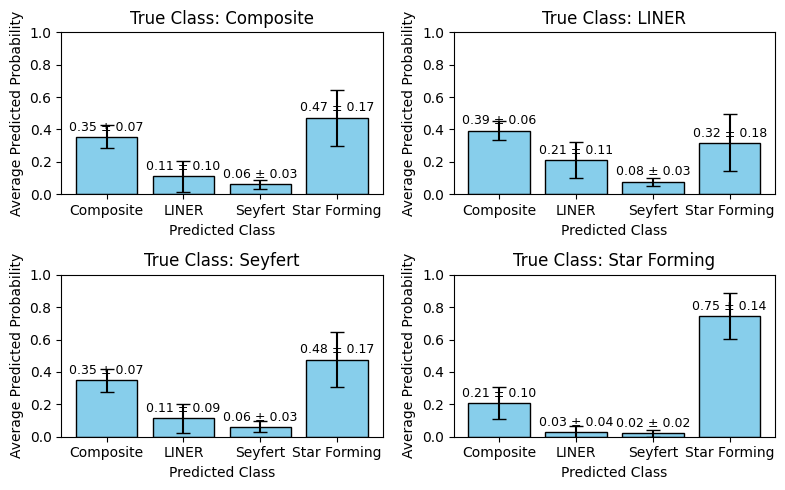

In [ ]:
y_pred_prob = model.predict(X_test_allc)
plot_avg_softmax_per_true_class(y_test_allc, y_pred_prob, class_names)

In [ ]:
threshold_rules = [
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Composite
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Liner
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Seyfert
    [(0.3, -1), (0.1, -1), (0.1, -1), (0.4, +1)],  # StarForming
]

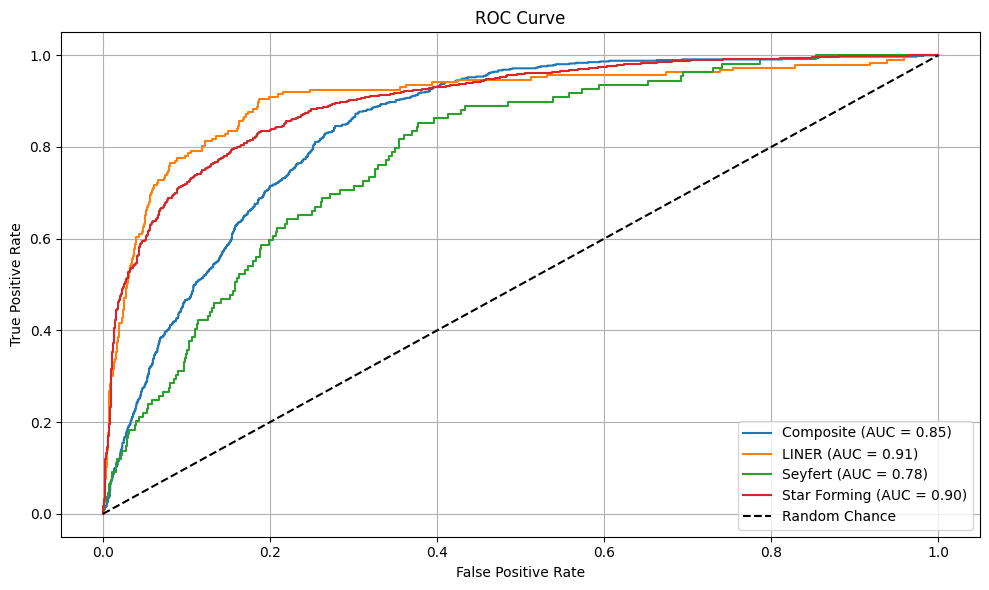

Accuracy: 0.8373921380632791


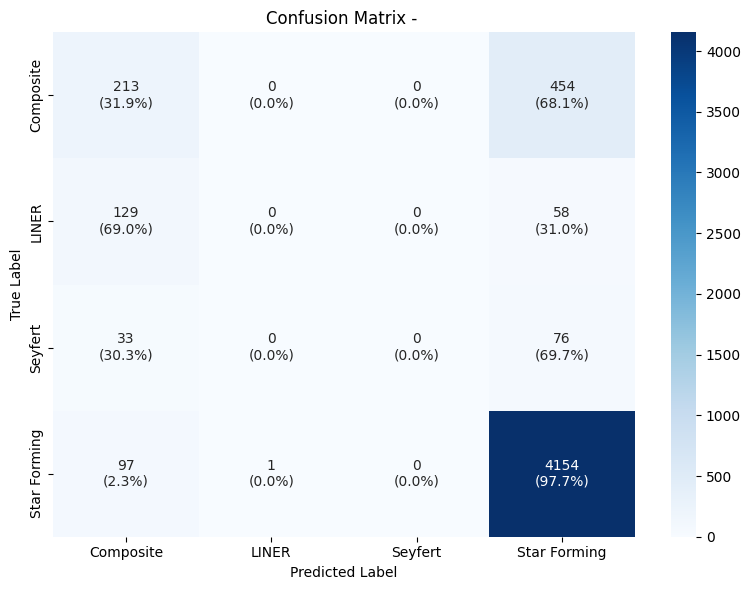

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.32      0.37       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.88      0.98      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.33      0.32      0.32      5215
weighted avg       0.77      0.84      0.80      5215



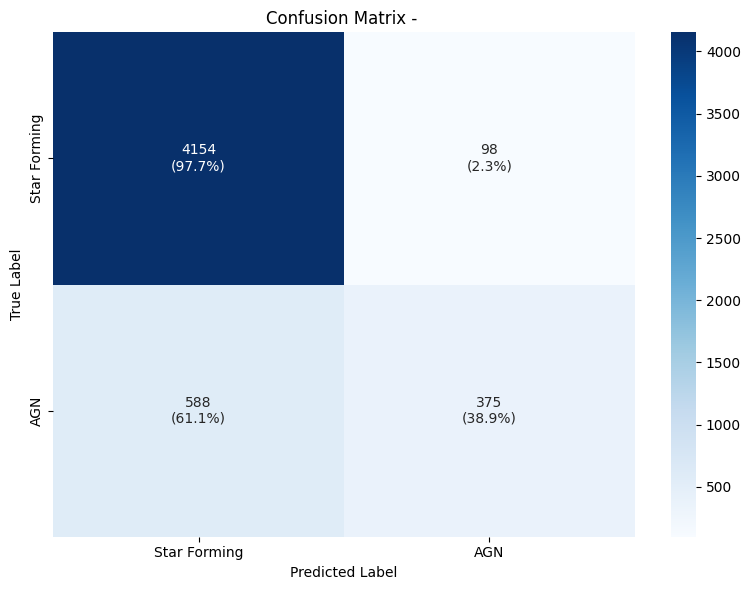

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.98      0.92      4252
         AGN       0.79      0.39      0.52       963

    accuracy                           0.87      5215
   macro avg       0.83      0.68      0.72      5215
weighted avg       0.86      0.87      0.85      5215



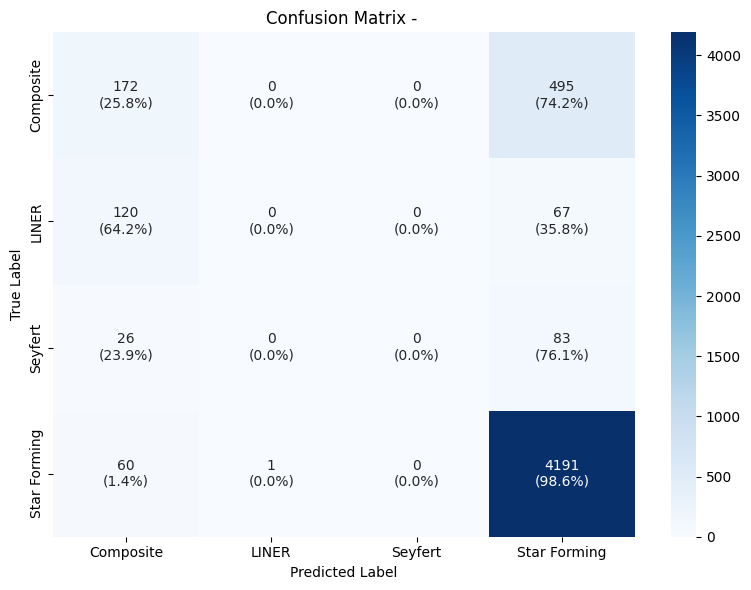

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.46      0.26      0.33       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.87      0.99      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.33      0.31      0.31      5215
weighted avg       0.76      0.84      0.79      5215



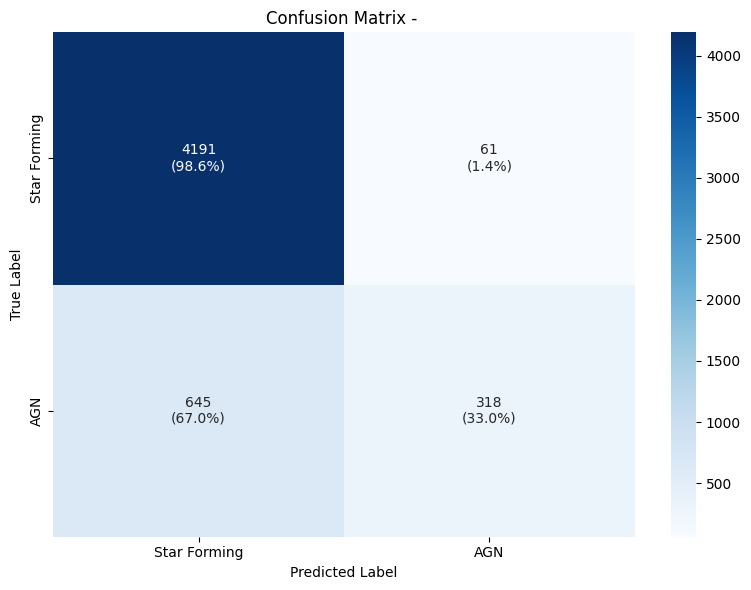

              precision    recall  f1-score   support

Star Forming       0.87      0.99      0.92      4252
         AGN       0.84      0.33      0.47       963

    accuracy                           0.86      5215
   macro avg       0.85      0.66      0.70      5215
weighted avg       0.86      0.86      0.84      5215



In [ ]:
test_model(y_pred_prob, y_test_allc, class_names)

y_pred = predict_with_thresholds(y_pred_prob, threshold_rules)

cm = confusion_matrix(y_test_allc, y_pred)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, y_pred, target_names=class_names))

binary_y_true, binary_y_pred = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_y_pred)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_y_pred, target_names=binary_class_names))

In [ ]:
model = get_classification_model(X_train_widec, [256,128,64,32,8], class_names)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)     │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 256)            │         2,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 8)              │           264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,348 (181.05 KB)

 Trainable params: 46,348 (181.05 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_widec, y_train_widec, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.8134 - loss: 0.2905 - val_accuracy: 0.8229 - val_loss: 0.2239
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8286 - loss: 0.2123 - val_accuracy: 0.8277 - val_loss: 0.2216
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8332 - loss: 0.2104 - val_accuracy: 0.8286 - val_loss: 0.2268
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8299 - loss: 0.2092 - val_accuracy: 0.8286 - val_loss: 0.2154
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8279 - loss: 0.2163 - val_accuracy: 0.8277 - val_loss: 0.2197
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8264 - loss: 0.2169 - val_accuracy: 0.8298 - val_loss: 0.2144
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8292 - loss: 0.2097 - val_accuracy: 0.8301 - val_loss: 0.2185
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8314 - loss: 0.2074 - v

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


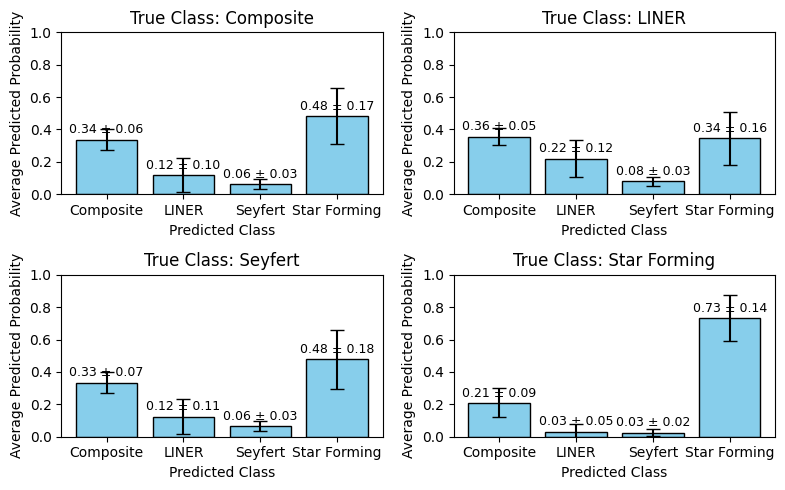

In [ ]:
y_pred_prob = model.predict(X_test_widec)
plot_avg_softmax_per_true_class(y_test_widec, y_pred_prob, class_names)

In [ ]:
threshold_rules = [
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Composite
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Liner
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Seyfert
    [(0.3, -1), (0.1, -1), (0.1, -1), (0.4, +1)],  # StarForming
]

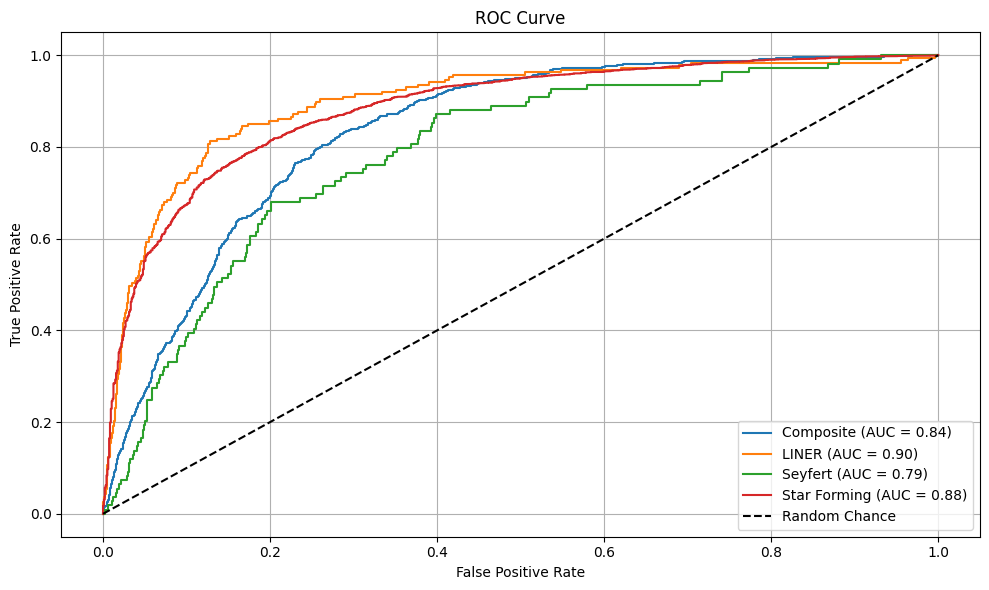

Accuracy: 0.8295302013422818


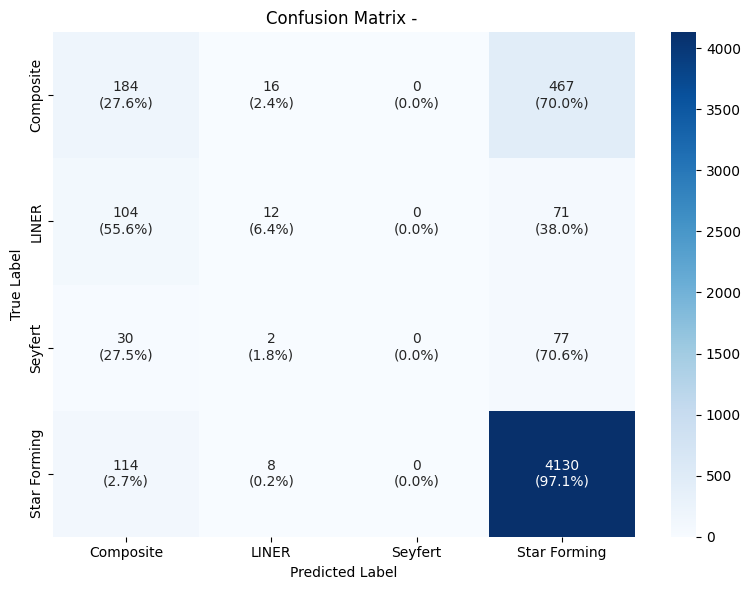

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.43      0.28      0.33       667
       LINER       0.32      0.06      0.11       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.87      0.97      0.92      4252

    accuracy                           0.83      5215
   macro avg       0.40      0.33      0.34      5215
weighted avg       0.78      0.83      0.80      5215



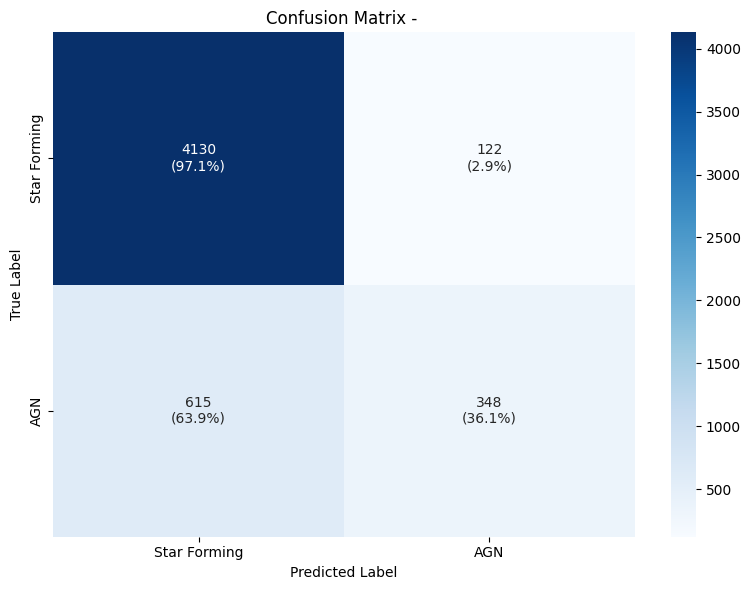

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.87      0.97      0.92      4252
         AGN       0.74      0.36      0.49       963

    accuracy                           0.86      5215
   macro avg       0.81      0.67      0.70      5215
weighted avg       0.85      0.86      0.84      5215



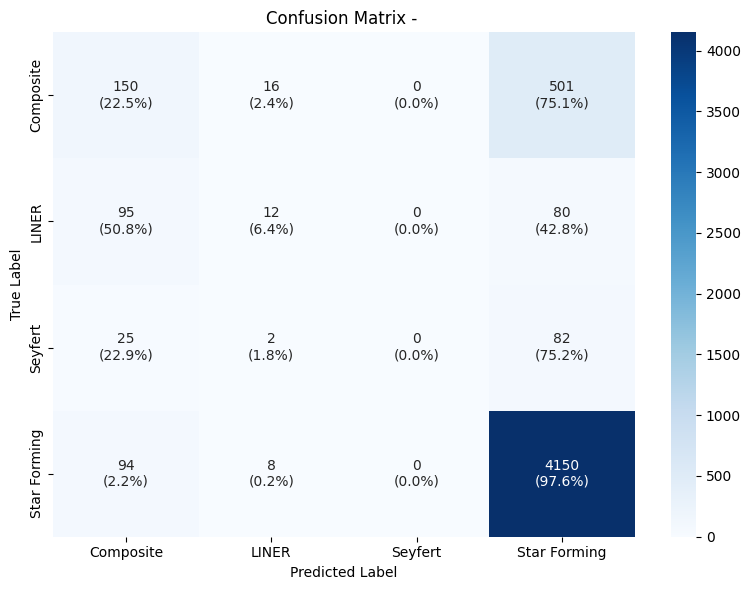

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.41      0.22      0.29       667
       LINER       0.32      0.06      0.11       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.86      0.98      0.92      4252

    accuracy                           0.83      5215
   macro avg       0.40      0.32      0.33      5215
weighted avg       0.77      0.83      0.79      5215



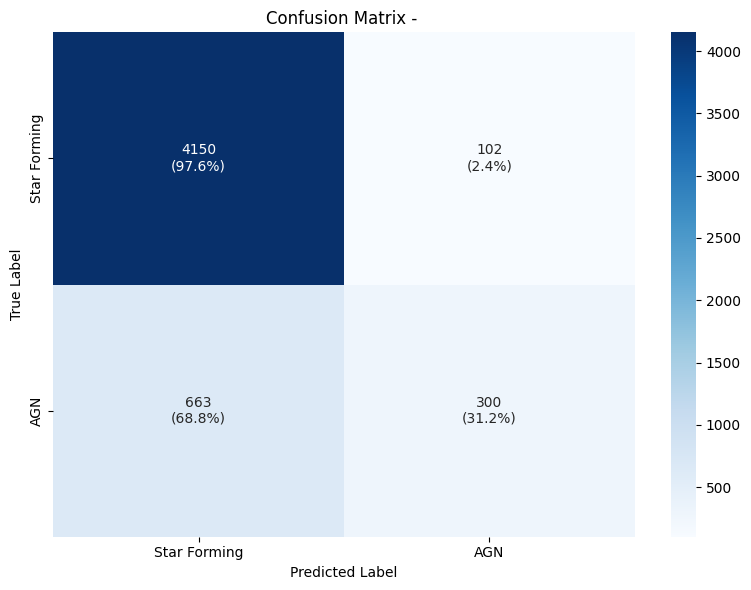

              precision    recall  f1-score   support

Star Forming       0.86      0.98      0.92      4252
         AGN       0.75      0.31      0.44       963

    accuracy                           0.85      5215
   macro avg       0.80      0.64      0.68      5215
weighted avg       0.84      0.85      0.83      5215



In [ ]:
test_model(y_pred_prob, y_test_widec, class_names)

y_pred = predict_with_thresholds(y_pred_prob, threshold_rules)

cm = confusion_matrix(y_test_widec, y_pred)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_widec, y_pred, target_names=class_names))

binary_y_true, binary_y_pred = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_y_pred)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_y_pred, target_names=binary_class_names))

In [ ]:
model = get_classification_model_do(X_train_widec, [128,1024,128], class_names, 0.25)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 128)            │         1,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 265,220 (1.01 MB)

 Trainable params: 265,220 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = k_fold_train(model, train_raw, X_train_widec, y_train_widec, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.8066 - loss: 0.2695 - val_accuracy: 0.8229 - val_loss: 0.2261
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8244 - loss: 0.2223 - val_accuracy: 0.8253 - val_loss: 0.2212
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.8268 - loss: 0.2176 - val_accuracy: 0.8272 - val_loss: 0.2245
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.8232 - loss: 0.2248 - val_accuracy: 0.8305 - val_loss: 0.2207
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.8244 - loss: 0.2148 - val_accuracy: 0.8301 - val_loss: 0.2179
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8199 - loss: 0.2213 - val_accuracy: 0.8291 - val_loss: 0.2215
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.8324 - loss: 0.2081 - val_accuracy: 0.8310 - val_loss: 0.2132
Epoch 8/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8275 - loss: 0.

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


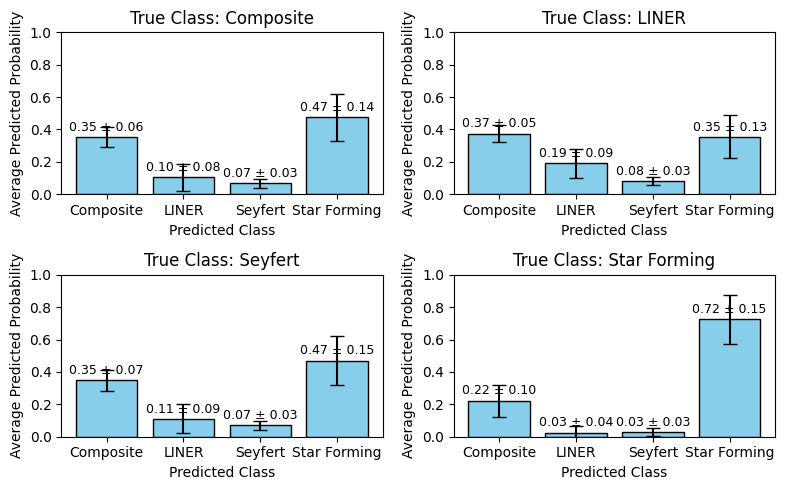

In [ ]:
y_pred_prob = model.predict(X_test_widec)
plot_avg_softmax_per_true_class(y_test_widec, y_pred_prob, class_names)

In [ ]:
threshold_rules = [
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Composite
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Liner
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.4, -1)],  # Seyfert
    [(0.3, -1), (0.1, -1), (0.1, -1), (0.4, +1)],  # StarForming
]

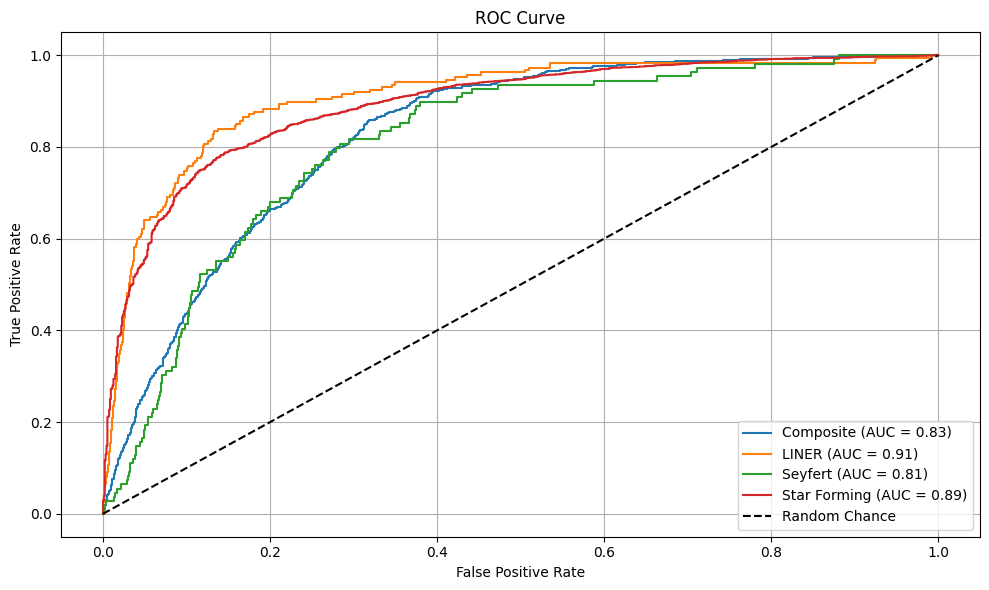

Accuracy: 0.8318312559923298


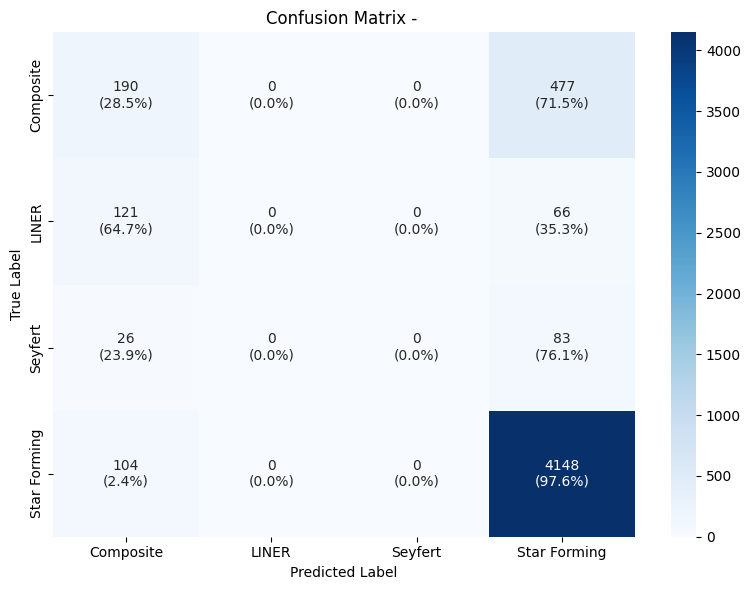

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.43      0.28      0.34       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.87      0.98      0.92      4252

    accuracy                           0.83      5215
   macro avg       0.32      0.32      0.32      5215
weighted avg       0.76      0.83      0.79      5215



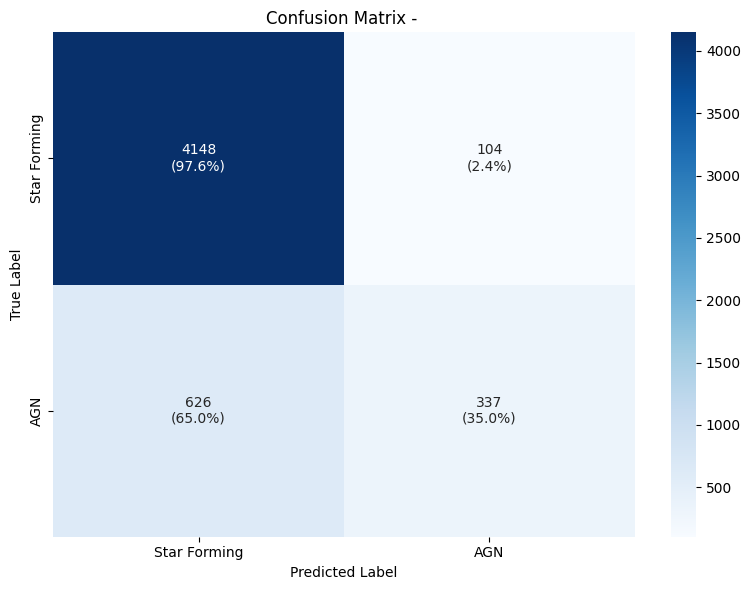

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.87      0.98      0.92      4252
         AGN       0.76      0.35      0.48       963

    accuracy                           0.86      5215
   macro avg       0.82      0.66      0.70      5215
weighted avg       0.85      0.86      0.84      5215



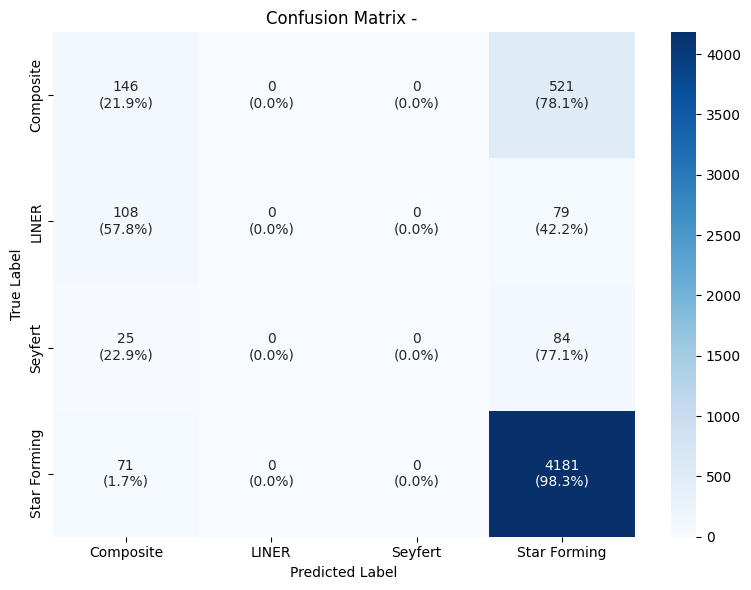

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.42      0.22      0.29       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.86      0.98      0.92      4252

    accuracy                           0.83      5215
   macro avg       0.32      0.30      0.30      5215
weighted avg       0.75      0.83      0.78      5215



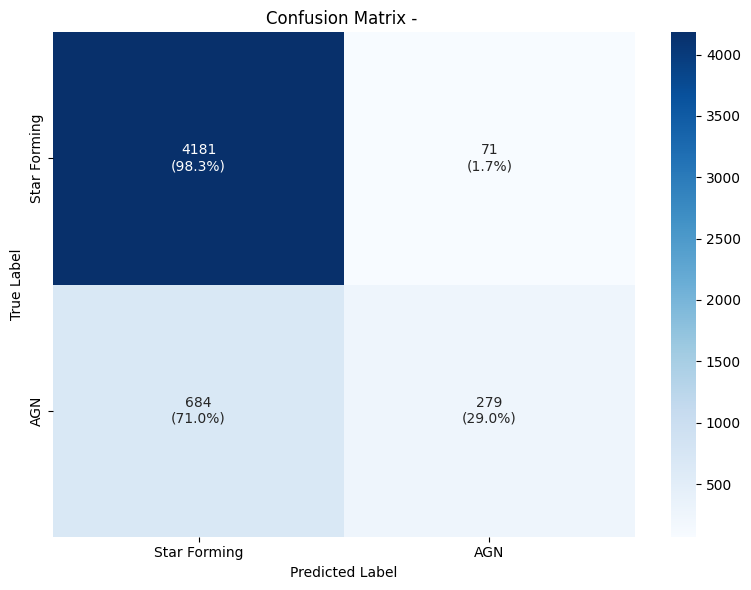

              precision    recall  f1-score   support

Star Forming       0.86      0.98      0.92      4252
         AGN       0.80      0.29      0.42       963

    accuracy                           0.86      5215
   macro avg       0.83      0.64      0.67      5215
weighted avg       0.85      0.86      0.83      5215



In [ ]:
test_model(y_pred_prob, y_test_widec, class_names)

y_pred = predict_with_thresholds(y_pred_prob, threshold_rules)

cm = confusion_matrix(y_test_widec, y_pred)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_widec, y_pred, target_names=class_names))

binary_y_true, binary_y_pred = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_y_pred)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_y_pred, target_names=binary_class_names))

## Unseen data test

In [ ]:
test_data_url = "https://drive.google.com/uc?id=1pdeUjiPUBr9AVW45-eh4AcTNrBDOVonz"

output = "AGN_test_dataset.csv"
gdown.download(test_data_url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1pdeUjiPUBr9AVW45-eh4AcTNrBDOVonz
To: /content/AGN_test_dataset.csv
100%|██████████| 13.7M/13.7M [00:00<00:00, 46.7MB/s]


'AGN_test_dataset.csv'

In [ ]:
raw_test_df = pd.read_csv(output)

test_filters_df = raw_test_df[filter_columns]
test_labels_df = raw_test_df["bpt_"]

test_labels = label_encoder.transform(test_labels_df)

mask_test = ~(test_filters_df == 99).any(axis=1)

clean_test_filters_data = test_filters_df[mask_test].reset_index(drop=True)
test_filters = clean_test_filters_data.to_numpy()

test_labels = test_labels[mask_test]

test_colors, colors_name = combine_filters(test_filters, filter_columns)
test_colors = scaler.fit_transform(test_colors)

In [ ]:
model = get_classification_model_do(X_train_allc, [128,1024,128], class_names, 0.25)

model.compile(optimizer='adam',
                      loss=SparseCategoricalFocalLoss(gamma=2,from_logits=False),
                      metrics=['accuracy'])

model.summary()

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)     │ (None, 66)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 128)            │         8,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1024)           │       132,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_112 (Dense)               │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 272,388 (1.04 MB)

 Trainable params: 272,388 (1.04 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
threshold_rules = [
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.3, -1)],  # Composite
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.3, -1)],  # Liner
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.3, -1)],  # Seyfert
    [(0.3, -1), (0.1, -1), (0.1, -1), (0.4, +1)],  # StarForming
]

In [ ]:
histories = k_fold_train(model, train_raw, X_train_allc, y_train_allc, n_splits=5, epochs=30, batch_size=32)


 Fold:  1 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.8103 - loss: 0.2691 - val_accuracy: 0.8329 - val_loss: 0.2226
Epoch 2/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.8339 - loss: 0.2102 - val_accuracy: 0.8408 - val_loss: 0.2176
Epoch 3/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8367 - loss: 0.2088 - val_accuracy: 0.8351 - val_loss: 0.2135
Epoch 4/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - accuracy: 0.8361 - loss: 0.2044 - val_accuracy: 0.8363 - val_loss: 0.2255
Epoch 5/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8323 - loss: 0.2092 - val_accuracy: 0.8368 - val_loss: 0.2119
Epoch 6/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.8337 - loss: 0.2046 - val_accuracy: 0.8317 - val_loss: 0.2165
Epoch 7/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.8346 - loss: 0.2000 - val_accuracy: 0.8305 - val_loss: 0.2163

 Fold:  2 / 5
Epoch 1/30
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0

273/273 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


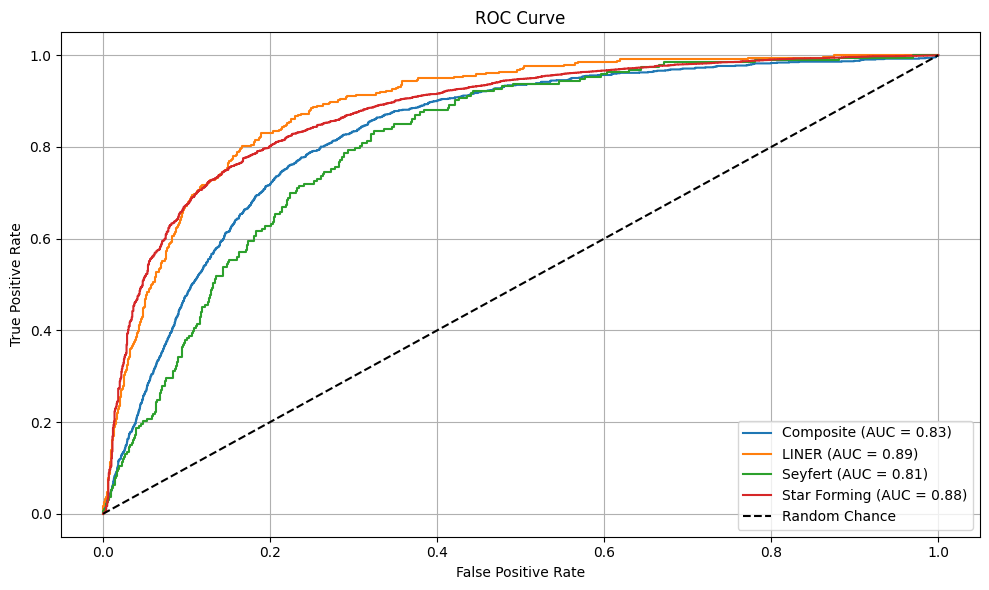

Accuracy: 0.8306756911781576


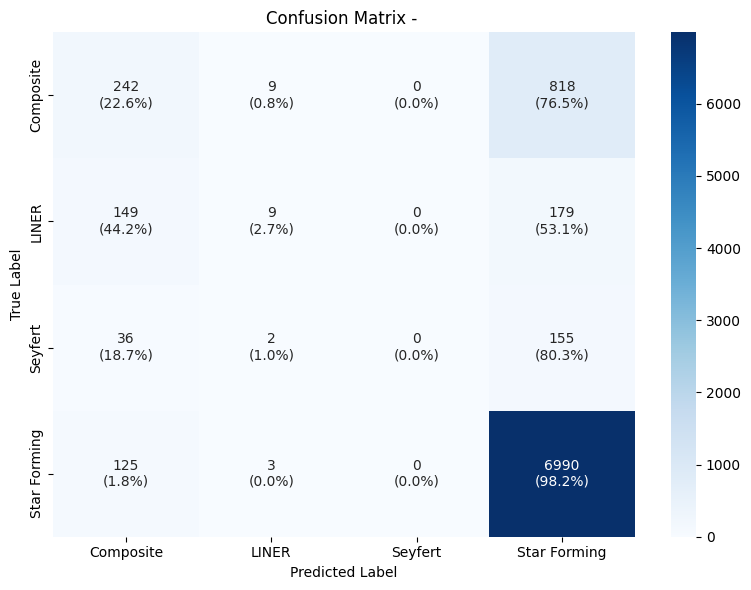

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.44      0.23      0.30      1069
       LINER       0.39      0.03      0.05       337
     Seyfert       0.00      0.00      0.00       193
Star Forming       0.86      0.98      0.92      7118

    accuracy                           0.83      8717
   macro avg       0.42      0.31      0.32      8717
weighted avg       0.77      0.83      0.79      8717



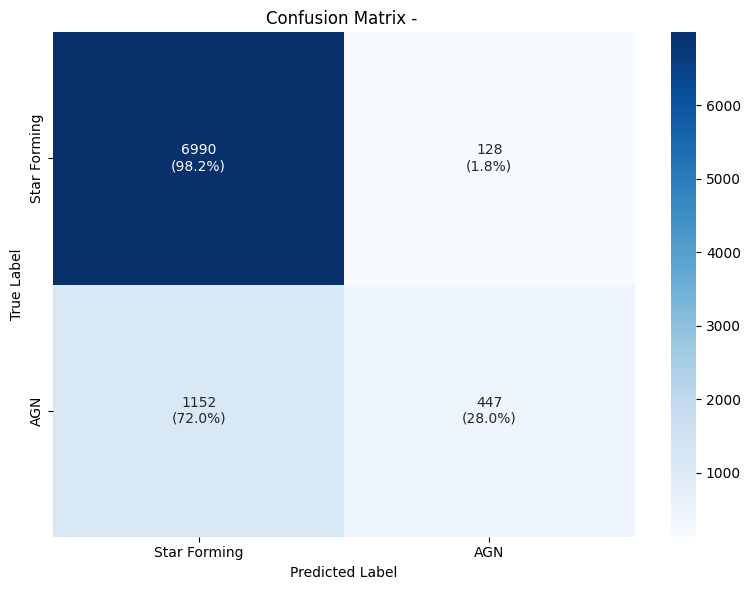

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.86      0.98      0.92      7118
         AGN       0.78      0.28      0.41      1599

    accuracy                           0.85      8717
   macro avg       0.82      0.63      0.66      8717
weighted avg       0.84      0.85      0.82      8717



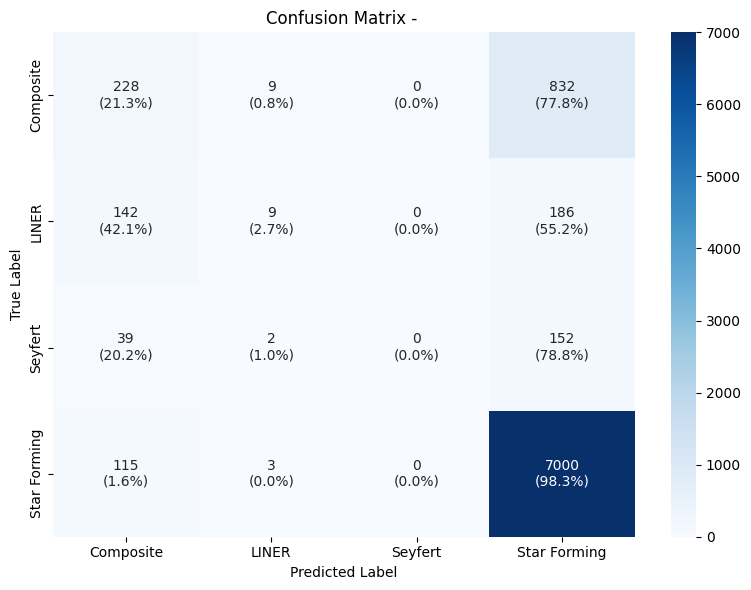

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.44      0.21      0.29      1069
       LINER       0.39      0.03      0.05       337
     Seyfert       0.00      0.00      0.00       193
Star Forming       0.86      0.98      0.92      7118

    accuracy                           0.83      8717
   macro avg       0.42      0.31      0.31      8717
weighted avg       0.77      0.83      0.78      8717



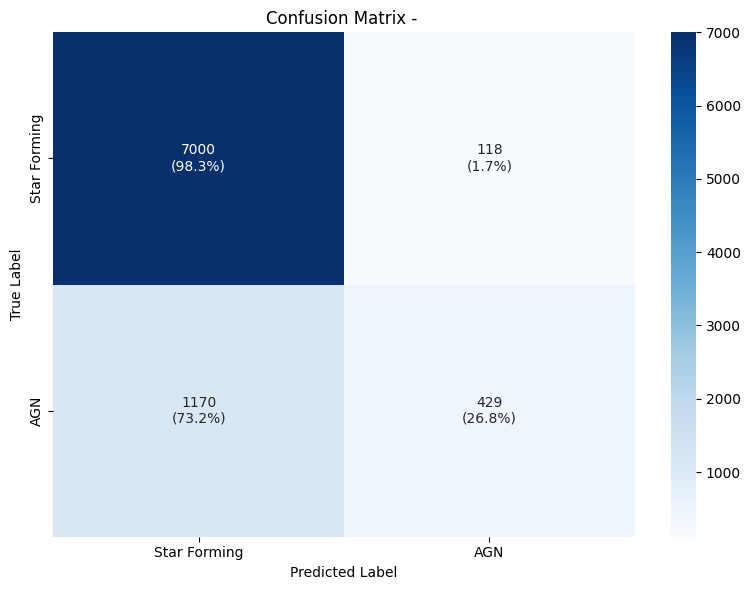

              precision    recall  f1-score   support

Star Forming       0.86      0.98      0.92      7118
         AGN       0.78      0.27      0.40      1599

    accuracy                           0.85      8717
   macro avg       0.82      0.63      0.66      8717
weighted avg       0.84      0.85      0.82      8717



In [ ]:
y_pred_prob = model.predict(test_colors)
test_model(y_pred_prob, test_labels, class_names)

y_pred = predict_with_thresholds(y_pred_prob, threshold_rules)

cm = confusion_matrix(test_labels, y_pred)
plot_confusion_matrix(cm, class_names)
print(classification_report(test_labels, y_pred, target_names=class_names))

binary_y_true, binary_y_pred = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_y_pred)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_y_pred, target_names=binary_class_names))

## Discussion

In the overfitting and K-fold stages, all models present similar performances. We selected the LCM and IAM mainly due to their lower memory usage, but this could indicate that smaller architectures can achieve equally good results.

L2 regularizations were inconclusive, probably because the size of the models was too large for it to have a significant effect. The results from applying dropout also present conflicts; we believe this is due to the aggressiveness of the approach, applying dropout after every layer. Nonetheless, the IAM showed improvement in most cases.

As expected, the use of computed colors works better than their respective sets of filters. As we mentioned before, this could be due to the increase in the hypothesis space—in which case, minor changes in the architecture could have the same effect—or due to the colors carrying more significant information. The change is an increase from 47k to 61k features (a 40% growth) for the LCM when using full colors, which is significant enough to attribute the improvement to the larger hypothesis space. However, that is not the case for the IAM, which goes from 265k to 272k features (a 0.03% growth). On the other hand, the use of only the wide filters or their color computation does not generate drastic changes in the size of any model, but performance still deteriorates. This indicates that, while only using wide filters still leads to good results, the use of the narrow filters of S-PLUS—particularly in wavelengths of interest—provides relevant information to the problem. It also hints that the use of colors instead of raw filter inputs does improve the information quality, independently of the indirect change in the model.

The use of custom thresholds allows for fine-tuning of the output based on the imbalance and nature of the data. With just some loose constraints, we were capable of obtaining a higher precision in AGN binary classification, but further optimization to improve results may become an issue if, as in this case, some of the probability distributions are too similar. On the other hand, if the probability distributions are too easily differentiable, the thresholding may be needlessly complex for the task. Furthermore, we want to note that their behavior is too similar to an extra hidden layer with the same size as the output and a ReLU activation function. This suggests that perhaps the correct approach would be to fine-tune the model by freezing it and adding layers for re-training using the corresponding metric.

Based on the probability distributions from the models, we can first perceive that they behave similarly across models. This implies that they are reaching a similar feature space—perhaps because, even though the number and size of layers differ between models, both use a sequential architecture of dense layers. Optimization of this architecture may improve performance, but we believe that exploring other architectures—such as reinsertions or delayed inputs—will be needed to surpass the 90% accuracy mark. Nevertheless, it should be possible, using the same architecture, to separate LINERs from Seyferts and Compounds in a second iteration.

From a physical perspective, it is interesting to see that the most similar probability distributions are those of Seyferts and Compounds, which is consistent with the fact that the BPT diagram also struggles to differentiate between them. This, along with the similar distributions across models, indicates that they are properly learning from the data.









## Conclusion

The goal of this study is to explore the potential of using Deep Learning to classify AGNs using the S-PLUS catalogue data. Even though our models seem to fail in performing multi-class classification, this is within expectations due to the limitations of the data and the labeling system. On the other hand, our models perform well when doing binary classification, with the approaches that merge the classes after prediction showing slightly better precision.

Models with a medium size like the LCM are capable enough to learn the relationship between measured filter intensity and whether the sample is an AGN or not. Larger models do not directly translate to better results, as was the case for the heavy contractive models, but an increase in features due to changes in the architecture can improve results, as seen with the IAM.

The use of constraints instead of custom thresholds is an interesting option depending on the probability distributions that the model outputs. In problems where the distribution is too simple, normal thresholds are enough. On the other hand, if the distribution is not clearly differentiable or too complex, using fine-tuning with additional layers may be the best option.

In future work, we will explore hyperparameter optimization using Keras Tuner, test structural changes in the architecture, further investigate selection constraints, and consider using a WHaN diagram for labeling the input data.










## References

Herpich, F. R., Almeida-Fernandes, F., Schwarz, G. O., Lima, E. V., Nakazono, L., Alonso-García, J., ... & de Oliveira, C. M. (2024). The Fourth S-PLUS Data Release: 12-filter photometry covering~ 3000 square degrees in the southern hemisphere. Astronomy & Astrophysics, 689, A249.
https://www.aanda.org/articles/aa/abs/2024/09/aa49725-24/aa49725-24.html

Chen, B. H., Goto, T., Kim, S. J., Wang, T. W., Santos, D. J. D., Ho, S. C., ... & Matsuhara, H. (2021). An active galactic nucleus recognition model based on deep neural network. Monthly Notices of the Royal Astronomical Society, 501(3), 3951-3961.
https://academic.oup.com/mnras/article/501/3/3951/6041032

Faisst, A. L., Prakash, A., Capak, P. L., & Lee, B. (2019). How to Find Variable Active Galactic Nuclei with Machine Learning. The Astrophysical Journal Letters, 881(1), L9.
https://iopscience.iop.org/article/10.3847/2041-8213/ab3581/meta



# Nueva sección

In [ ]:
urls = []

urls.append("https://drive.google.com/uc?id=1YVE7RP532jNesRIDUV5-3LJG02rIc9ze")
urls.append("https://drive.google.com/uc?id=1SHh-MqILfOzhpC_6dYTpORF6_YNywgJ8")
urls.append("https://drive.google.com/uc?id=1SJBaUeOpQSFMz_G3QLsoog8Vya1w46rf")
urls.append("https://drive.google.com/uc?id=1cWpl8GDgYyZSLew9fIYixkt03ujRR4gI")

for i in range(4):
  output = f"best_hp_{i}.json"
  gdown.download(urls[i], output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1YVE7RP532jNesRIDUV5-3LJG02rIc9ze
To: /content/best_hp_0.json
100%|██████████| 632/632 [00:00<00:00, 2.15MB/s]
Downloading...
From: https://drive.google.com/uc?id=1SHh-MqILfOzhpC_6dYTpORF6_YNywgJ8
To: /content/best_hp_1.json
100%|██████████| 579/579 [00:00<00:00, 1.75MB/s]
Downloading...
From: https://drive.google.com/uc?id=1SJBaUeOpQSFMz_G3QLsoog8Vya1w46rf
To: /content/best_hp_2.json
100%|██████████| 620/620 [00:00<00:00, 1.81MB/s]
Downloading...
From: https://drive.google.com/uc?id=1cWpl8GDgYyZSLew9fIYixkt03ujRR4gI
To: /content/best_hp_3.json
100%|██████████| 365/365 [00:00<00:00, 1.05MB/s]


In [ ]:
import keras

def build_model(hp):

    model = keras.models.Sequential()

    model.add(layers.Input(shape=(combined_filters.shape[1],)))

    num_layers = hp.Int("num_layers", min_value=4, max_value=10, step=1)

    for i in range(num_layers):
        units = hp.Int(f"units_{i}", min_value=32, max_value=512, step=32)
        model.add(layers.Dense(units=units, activation="relu"))

        use_dropout = hp.Boolean(f"use_dropout_{i}")
        if use_dropout:
            dropout_rate = hp.Float(f"dropout_rate_{i}", min_value=0.1, max_value=0.5, step=0.1)
            model.add(layers.Dropout(dropout_rate))

    model.add(layers.Dense(units=len(np.unique(labels)), activation="softmax"))

    model.compile(
        optimizer="adam",
        loss= SparseCategoricalFocalLoss(gamma=2,from_logits=False),
        metrics=["accuracy"]
    )

    return model

In [ ]:
import json

hp_values = []

for i in range(4):
  with open(f"best_hp_{i}.json") as f:
    hp_values.append(json.load(f))

In [ ]:
!pip install keras_tuner

In [ ]:
import keras_tuner as kt

models = []

for i in range(4):
  hp = kt.HyperParameters()
  hp.values = hp_values[i]
  model = build_model(hp)
  models.append(model)
  model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         4,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │        33,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 160)            │        82,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4)              │           644 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 124,452 (486.14 KB)

 Trainable params: 124,452 (486.14 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5 (Dense)                 │ (None, 64)             │         4,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 416)            │       213,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 416)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 4)              │         1,668 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 293,732 (1.12 MB)

 Trainable params: 293,732 (1.12 MB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_10 (Dense)                │ (None, 256)            │        17,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 320)            │        82,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 320)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │        10,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 224)            │         7,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 4)              │           900 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 117,956 (460.77 KB)

 Trainable params: 117,956 (460.77 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_15 (Dense)                │ (None, 160)            │        10,720 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 160)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 384)            │        61,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 384)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 64)             │        24,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 160)            │        10,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 160)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         5,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 4)              │           132 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 112,868 (440.89 KB)

 Trainable params: 112,868 (440.89 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
histories = []

for i in range(4):
  history = models[i].fit(X_train_allc, y_train_allc, epochs=10, batch_size=32)
  histories.append(history)

Epoch 1/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.8100 - loss: 0.2795
Epoch 2/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - accuracy: 0.8283 - loss: 0.2135
Epoch 3/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - accuracy: 0.8288 - loss: 0.2118
Epoch 4/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.8369 - loss: 0.2067
Epoch 5/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - accuracy: 0.8332 - loss: 0.2068
Epoch 6/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.8365 - loss: 0.2029
Epoch 7/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.8318 - loss: 0.2085
Epoch 8/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.8332 - loss: 0.2056
Epoch 9/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.8364 - loss: 0.2008
Epoch 10/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.8290 - loss: 0.2084
Epoch 1/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 14s 11ms/step - accuracy: 0.8012 - loss: 0.2883
Epoch 2/10
652/652 ━━━━━━━━━━━━━━━━━━━━ 8s 8

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


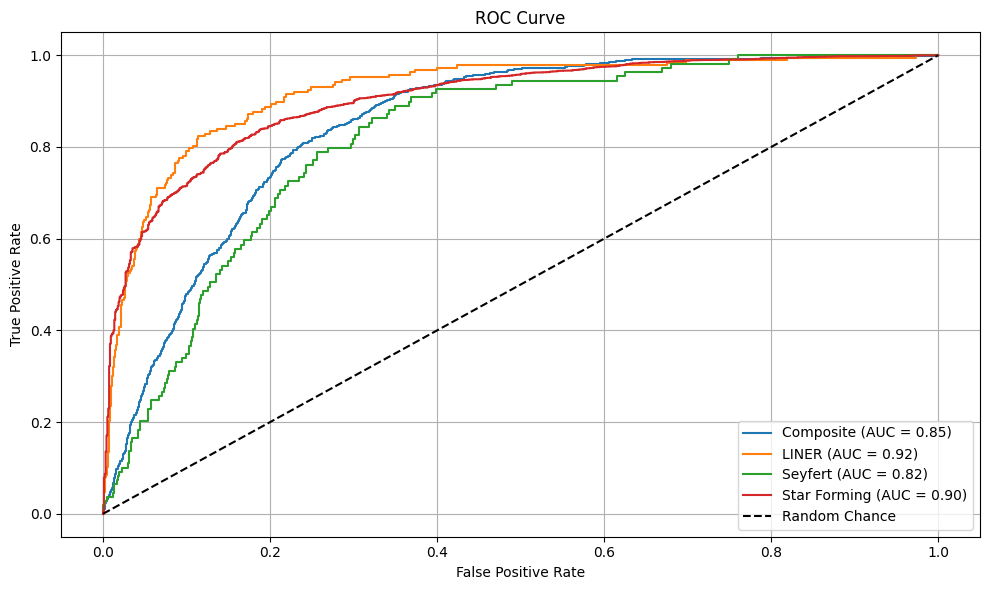

Accuracy: 0.8354745925215724


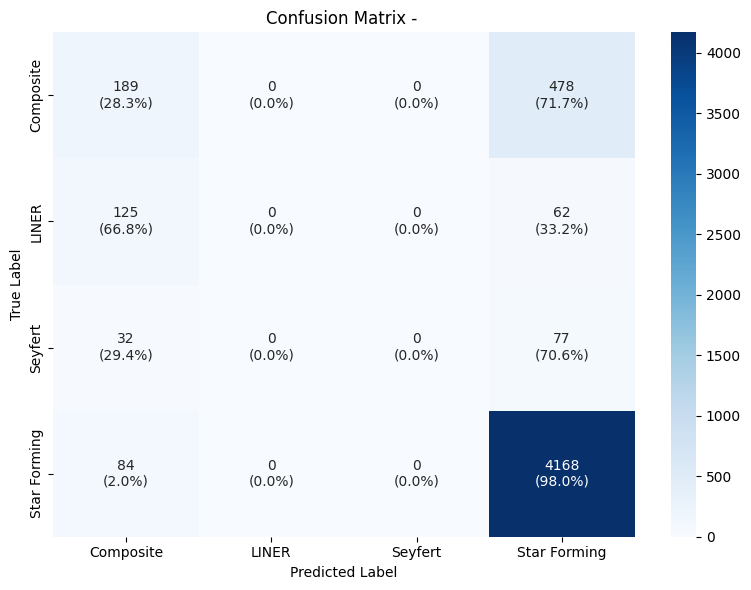

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.44      0.28      0.34       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.87      0.98      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.33      0.32      0.32      5215
weighted avg       0.77      0.84      0.80      5215



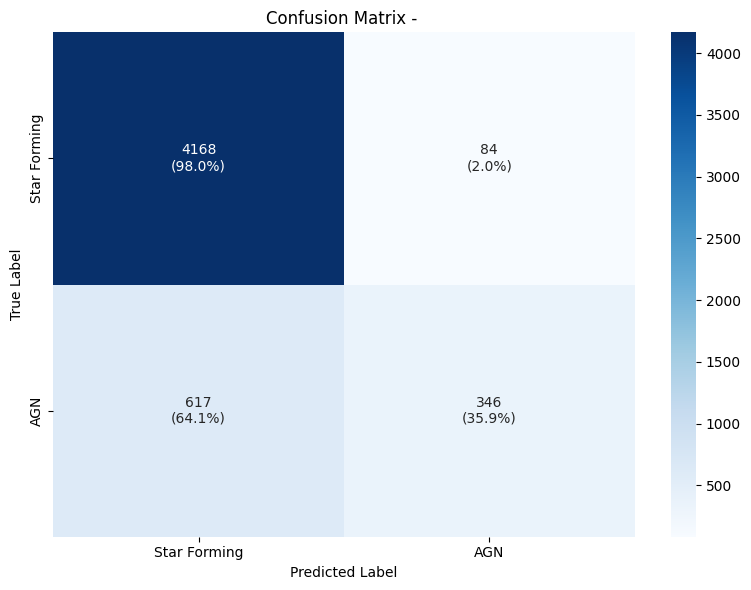

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.87      0.98      0.92      4252
         AGN       0.80      0.36      0.50       963

    accuracy                           0.87      5215
   macro avg       0.84      0.67      0.71      5215
weighted avg       0.86      0.87      0.84      5215



In [ ]:
pred1 = models[0].predict(X_test_allc)

test_model(pred1, y_test_allc, class_names)

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


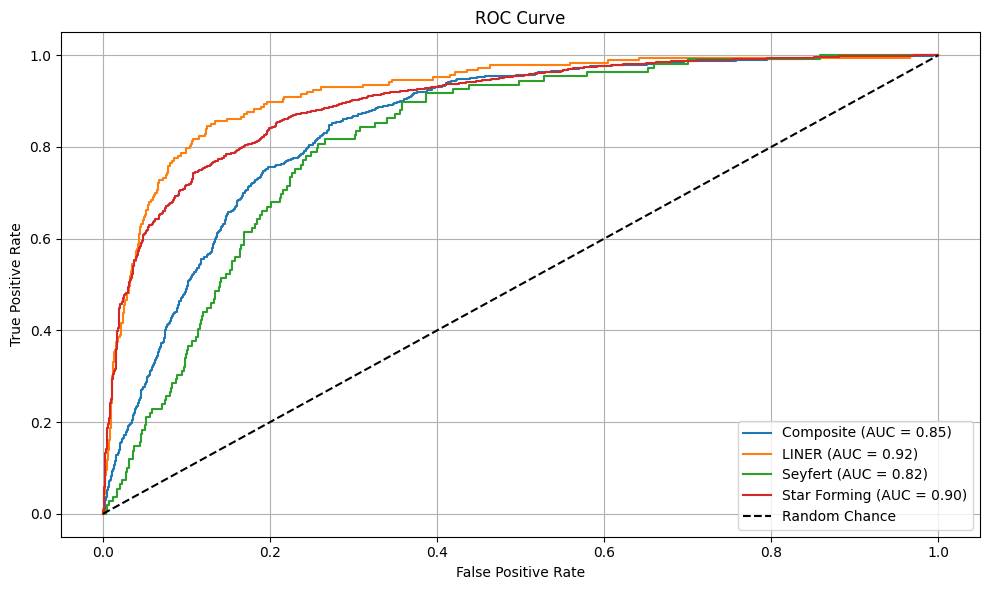

Accuracy: 0.8358581016299137


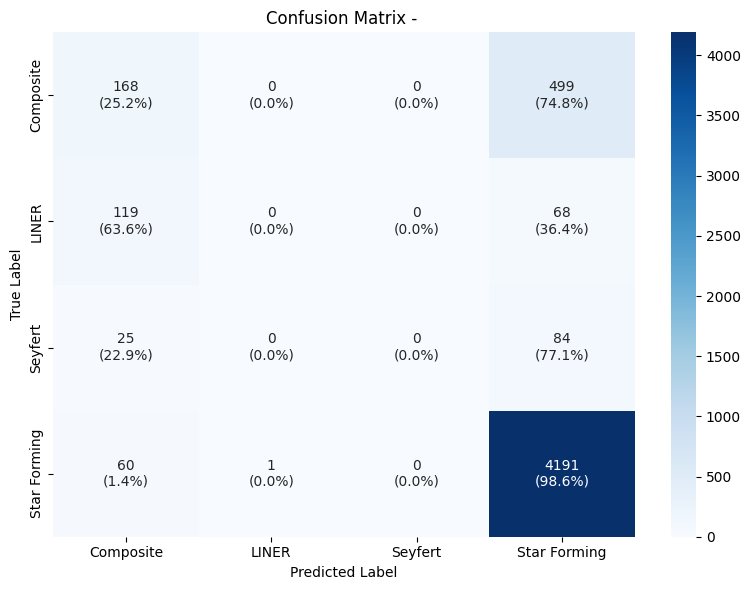

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.25      0.32       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.87      0.99      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.33      0.31      0.31      5215
weighted avg       0.76      0.84      0.79      5215



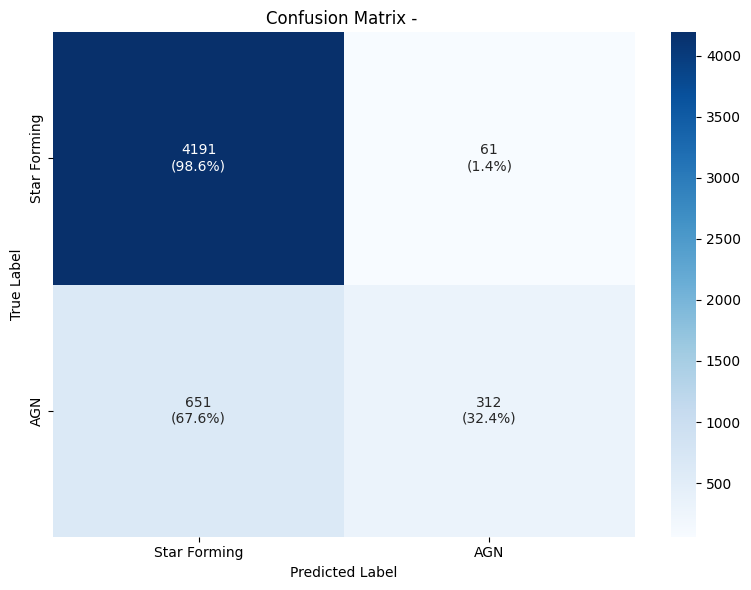

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.87      0.99      0.92      4252
         AGN       0.84      0.32      0.47       963

    accuracy                           0.86      5215
   macro avg       0.85      0.65      0.69      5215
weighted avg       0.86      0.86      0.84      5215



In [ ]:
pred2 = models[1].predict(X_test_allc)

test_model(pred2, y_test_allc, class_names)

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


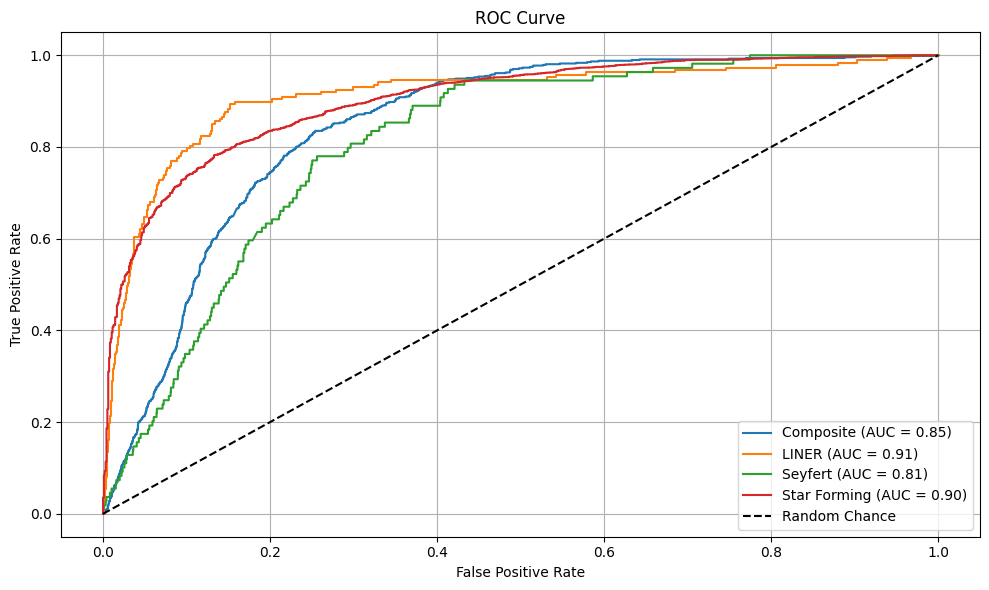

Accuracy: 0.8381591562799616


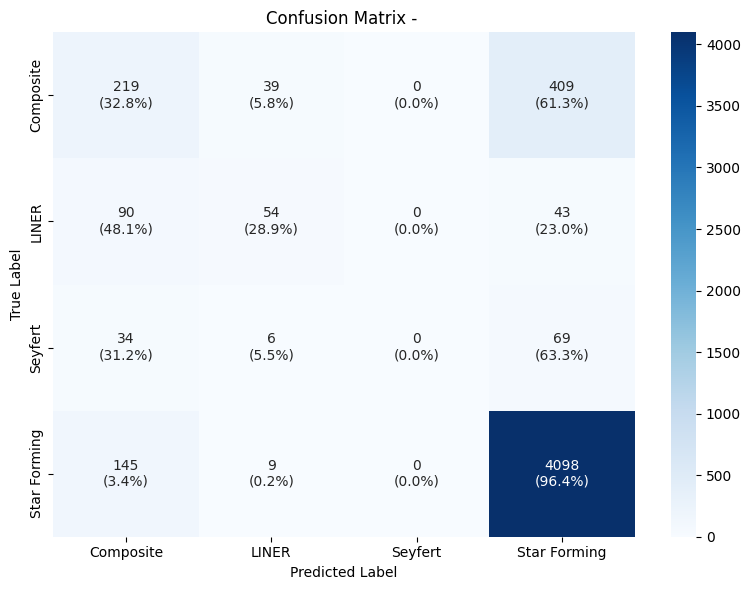

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.33      0.38       667
       LINER       0.50      0.29      0.37       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.89      0.96      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.46      0.40      0.42      5215
weighted avg       0.80      0.84      0.81      5215



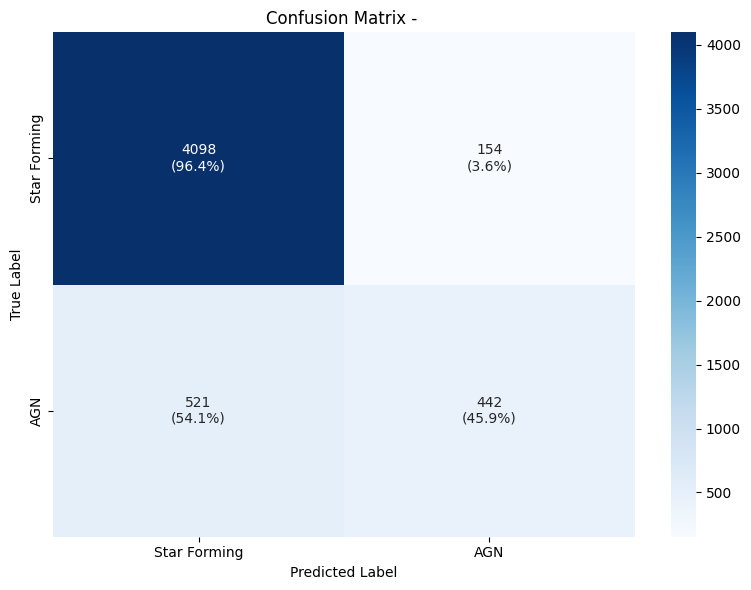

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.89      0.96      0.92      4252
         AGN       0.74      0.46      0.57       963

    accuracy                           0.87      5215
   macro avg       0.81      0.71      0.75      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
pred3 = models[2].predict(X_test_allc)

test_model(pred3, y_test_allc, class_names)

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


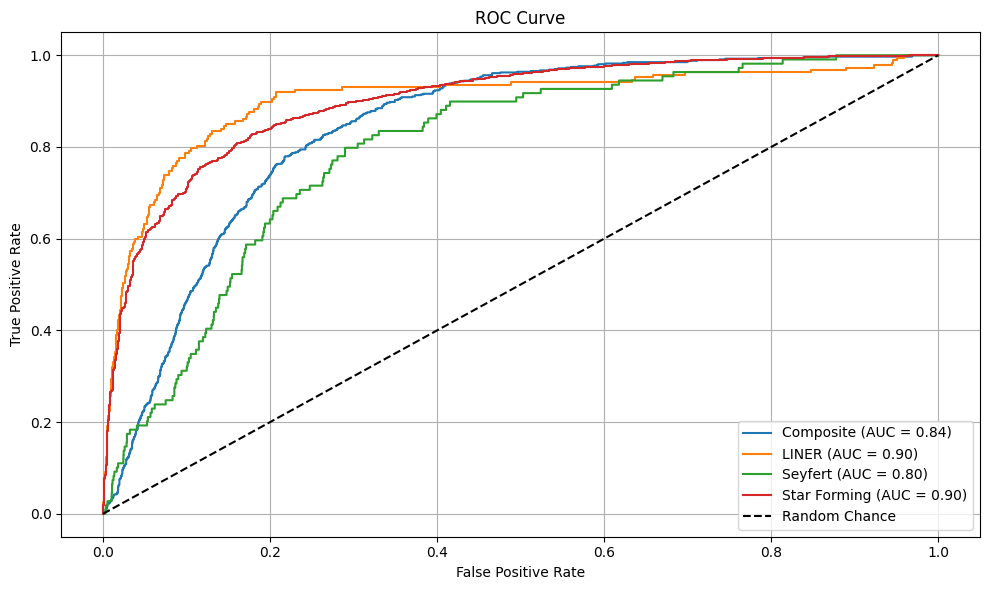

Accuracy: 0.8389261744966443


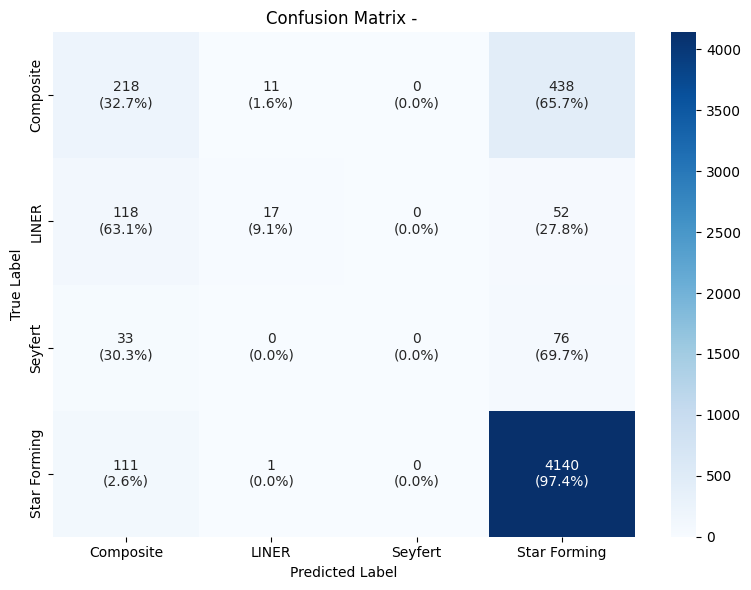

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

   Composite       0.45      0.33      0.38       667
       LINER       0.59      0.09      0.16       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.88      0.97      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.48      0.35      0.37      5215
weighted avg       0.80      0.84      0.81      5215



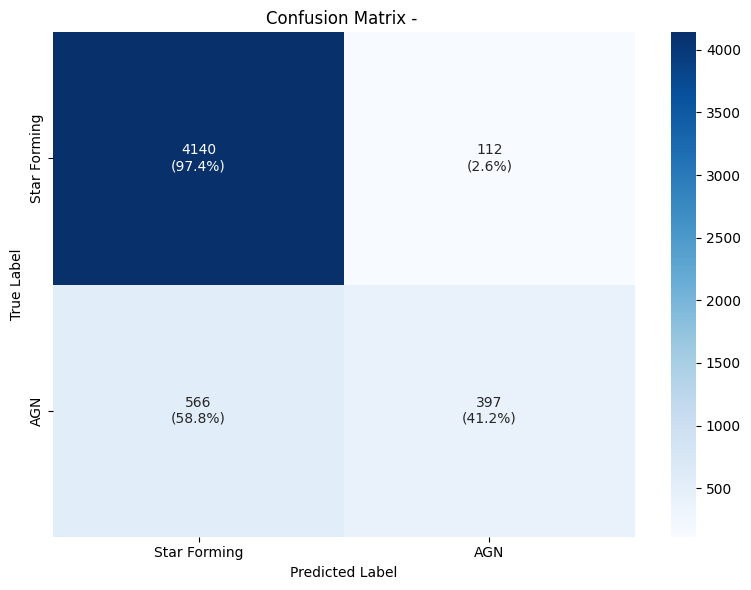

Binary Classification Report:
               precision    recall  f1-score   support

Star Forming       0.88      0.97      0.92      4252
         AGN       0.78      0.41      0.54       963

    accuracy                           0.87      5215
   macro avg       0.83      0.69      0.73      5215
weighted avg       0.86      0.87      0.85      5215



In [ ]:
pred4 = models[3].predict(X_test_allc)

test_model(pred4, y_test_allc, class_names)

In [ ]:
threshold_rules = [
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.3, -1)],  # Composite
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.3, -1)],  # Liner
    [(0.3, +1), (0.1, +1), (0.1, +1), (0.3, -1)],  # Seyfert
    [(0.3, -1), (0.1, -1), (0.1, -1), (0.4, +1)],  # StarForming
]

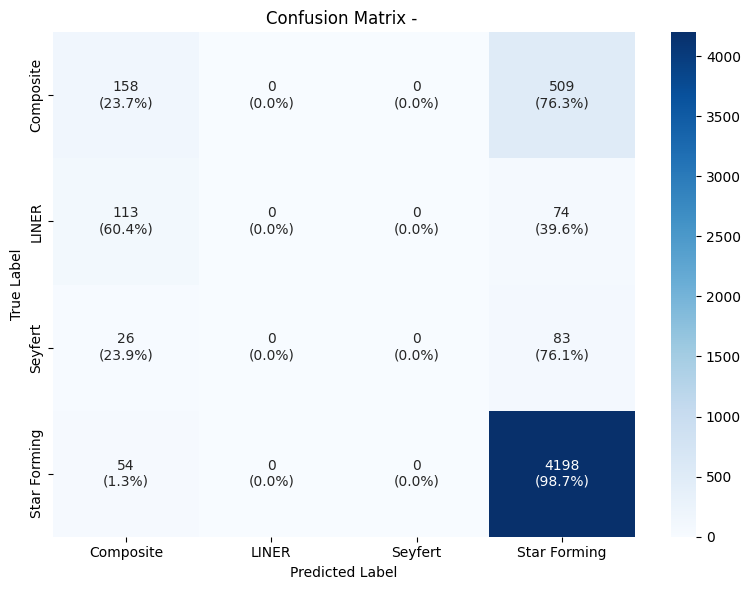

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.45      0.24      0.31       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.86      0.99      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.33      0.31      0.31      5215
weighted avg       0.76      0.84      0.79      5215



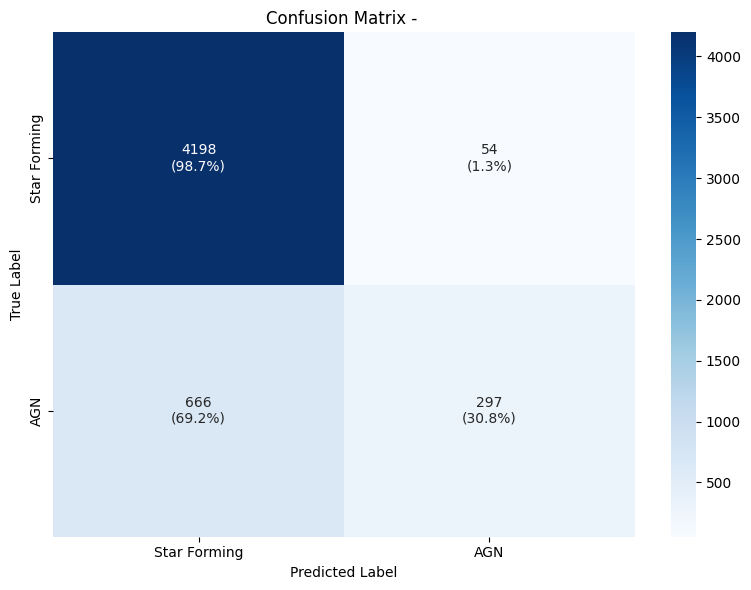

              precision    recall  f1-score   support

Star Forming       0.86      0.99      0.92      4252
         AGN       0.85      0.31      0.45       963

    accuracy                           0.86      5215
   macro avg       0.85      0.65      0.69      5215
weighted avg       0.86      0.86      0.83      5215



In [ ]:
tpred1 = predict_with_thresholds(pred1, threshold_rules)

cm = confusion_matrix(y_test_allc, tpred1)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, tpred1, target_names=class_names))


binary_y_true, binary_tpred1 = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred1)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred1, target_names=binary_class_names))

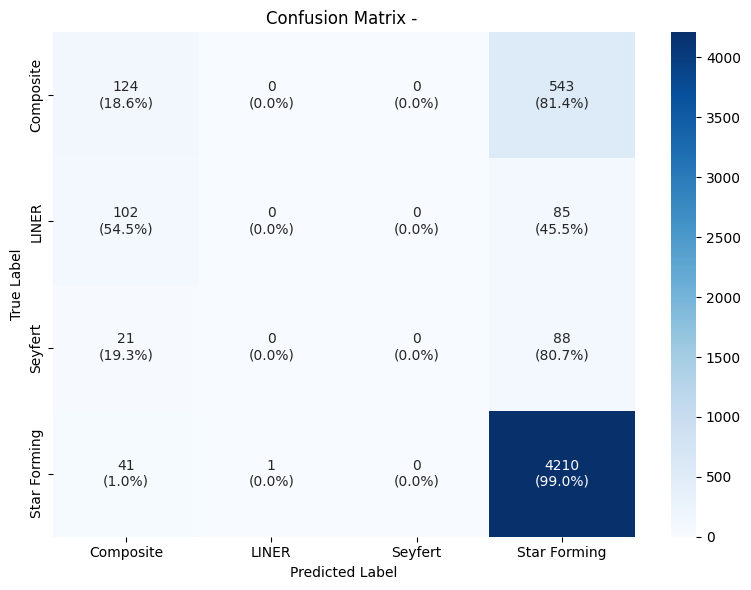

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.43      0.19      0.26       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.85      0.99      0.92      4252

    accuracy                           0.83      5215
   macro avg       0.32      0.29      0.29      5215
weighted avg       0.75      0.83      0.78      5215



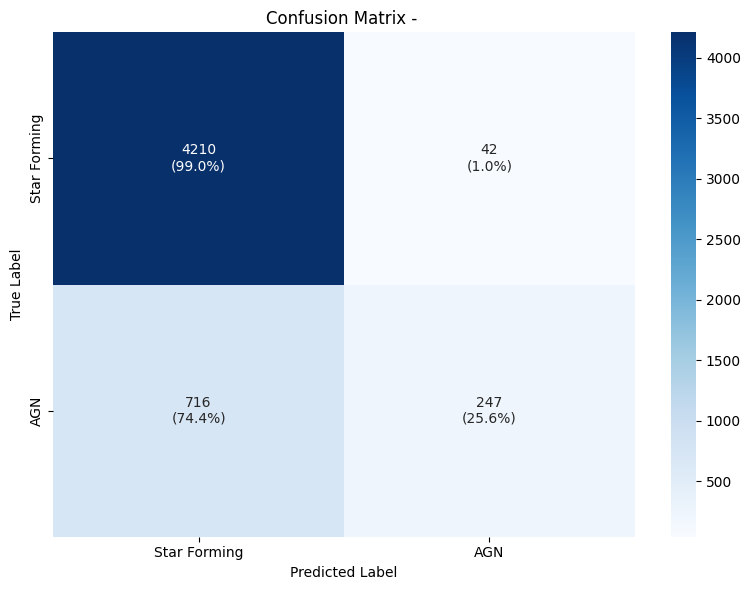

              precision    recall  f1-score   support

Star Forming       0.85      0.99      0.92      4252
         AGN       0.85      0.26      0.39       963

    accuracy                           0.85      5215
   macro avg       0.85      0.62      0.66      5215
weighted avg       0.85      0.85      0.82      5215



In [ ]:
tpred2 = predict_with_thresholds(pred2, threshold_rules)

cm = confusion_matrix(y_test_allc, tpred2)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, tpred2, target_names=class_names))


binary_y_true, binary_tpred2 = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred2)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred2, target_names=binary_class_names))

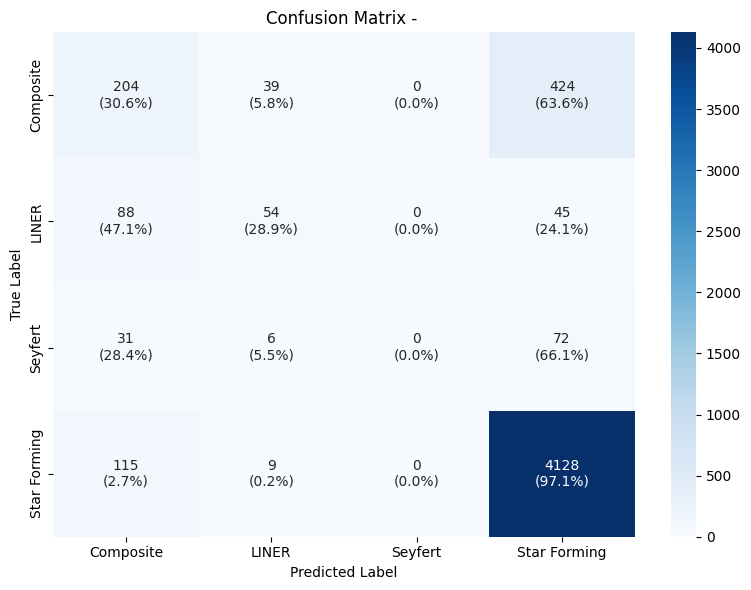

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.47      0.31      0.37       667
       LINER       0.50      0.29      0.37       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.88      0.97      0.93      4252

    accuracy                           0.84      5215
   macro avg       0.46      0.39      0.42      5215
weighted avg       0.80      0.84      0.81      5215



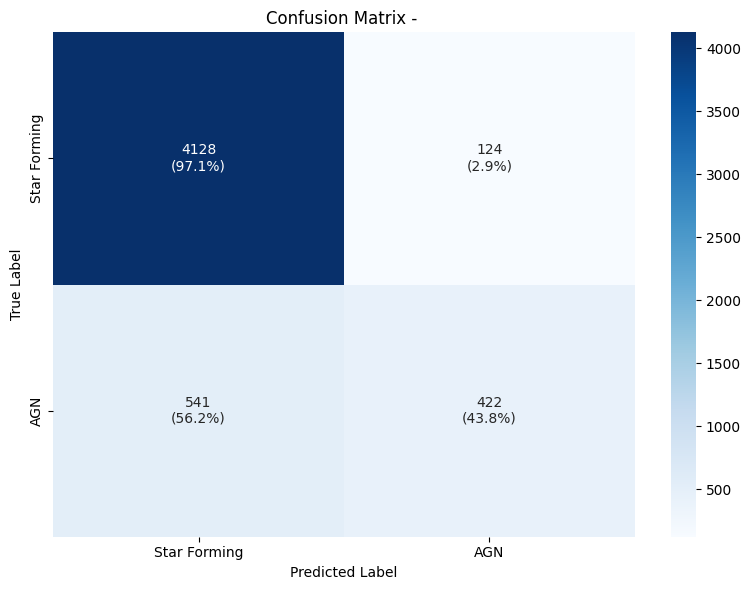

              precision    recall  f1-score   support

Star Forming       0.88      0.97      0.93      4252
         AGN       0.77      0.44      0.56       963

    accuracy                           0.87      5215
   macro avg       0.83      0.70      0.74      5215
weighted avg       0.86      0.87      0.86      5215



In [ ]:
tpred3 = predict_with_thresholds(pred3, threshold_rules)

cm = confusion_matrix(y_test_allc, tpred3)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, tpred3, target_names=class_names))


binary_y_true, binary_tpred3 = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred3)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred3, target_names=binary_class_names))

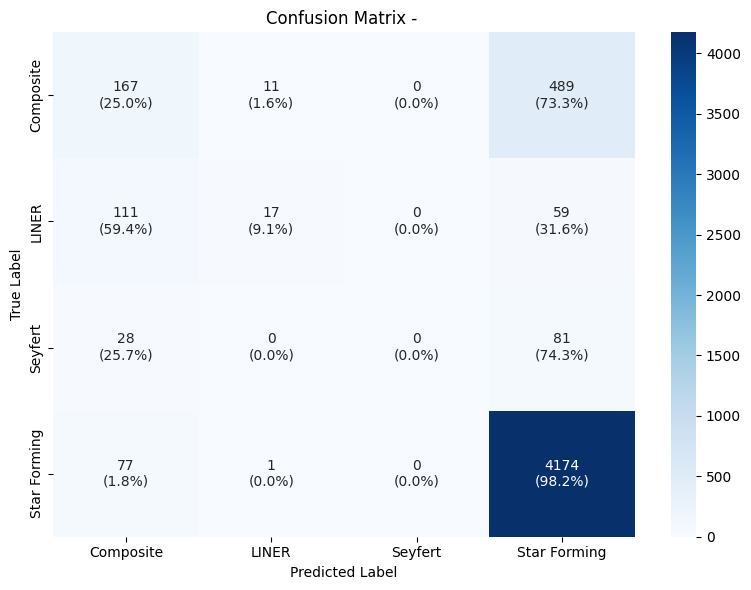

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.44      0.25      0.32       667
       LINER       0.59      0.09      0.16       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.87      0.98      0.92      4252

    accuracy                           0.84      5215
   macro avg       0.47      0.33      0.35      5215
weighted avg       0.79      0.84      0.80      5215



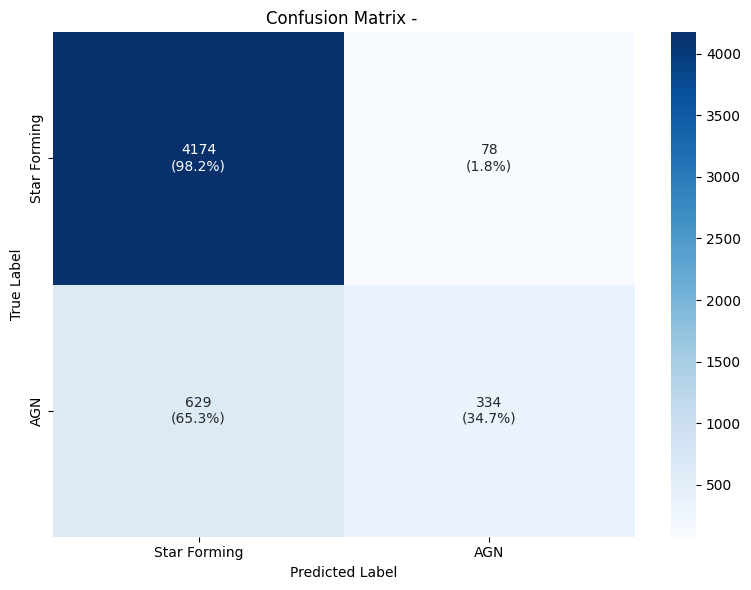

              precision    recall  f1-score   support

Star Forming       0.87      0.98      0.92      4252
         AGN       0.81      0.35      0.49       963

    accuracy                           0.86      5215
   macro avg       0.84      0.66      0.70      5215
weighted avg       0.86      0.86      0.84      5215



In [ ]:
tpred4 = predict_with_thresholds(pred4, threshold_rules)

cm = confusion_matrix(y_test_allc, tpred4)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, tpred4, target_names=class_names))

binary_y_true, binary_tpred4 = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred4)

plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred4, target_names=binary_class_names))

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

meta_clf = RandomForestClassifier(n_estimators=100, random_state=42)
meta_clf.fit(pred2, y_test_allc)

RandomForestClassifier(random_state=42)

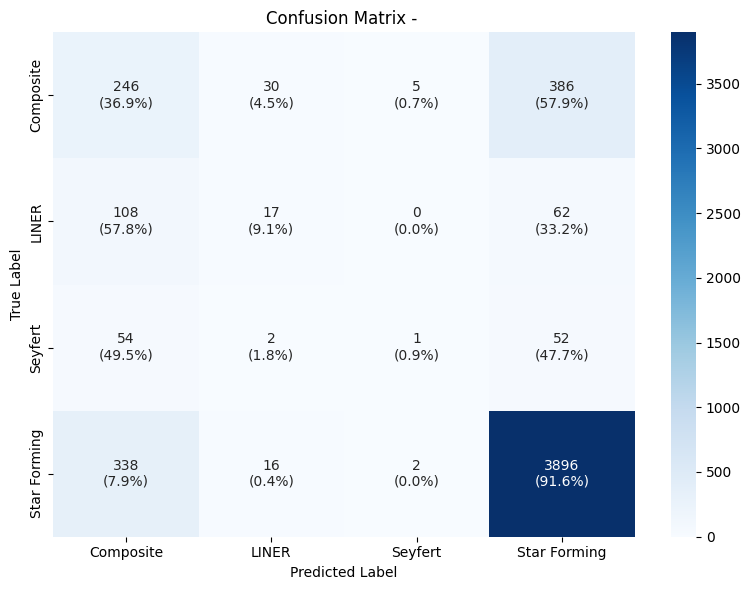

              precision    recall  f1-score   support

   Composite       0.33      0.37      0.35       667
       LINER       0.26      0.09      0.13       187
     Seyfert       0.12      0.01      0.02       109
Star Forming       0.89      0.92      0.90      4252

    accuracy                           0.80      5215
   macro avg       0.40      0.35      0.35      5215
weighted avg       0.78      0.80      0.78      5215



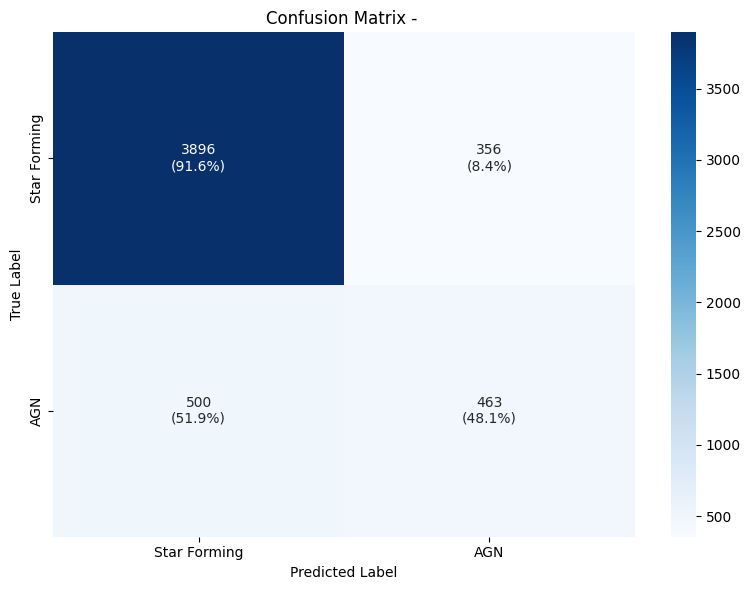

              precision    recall  f1-score   support

Star Forming       0.89      0.92      0.90      4252
         AGN       0.57      0.48      0.52       963

    accuracy                           0.84      5215
   macro avg       0.73      0.70      0.71      5215
weighted avg       0.83      0.84      0.83      5215



In [ ]:
mrf_pred1 = meta_clf.predict(pred1)

cm = confusion_matrix(y_test_allc, mrf_pred1)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, mrf_pred1, target_names=class_names))


binary_y_true, mrf_pred1b = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, mrf_pred1b)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, mrf_pred1b, target_names=binary_class_names))

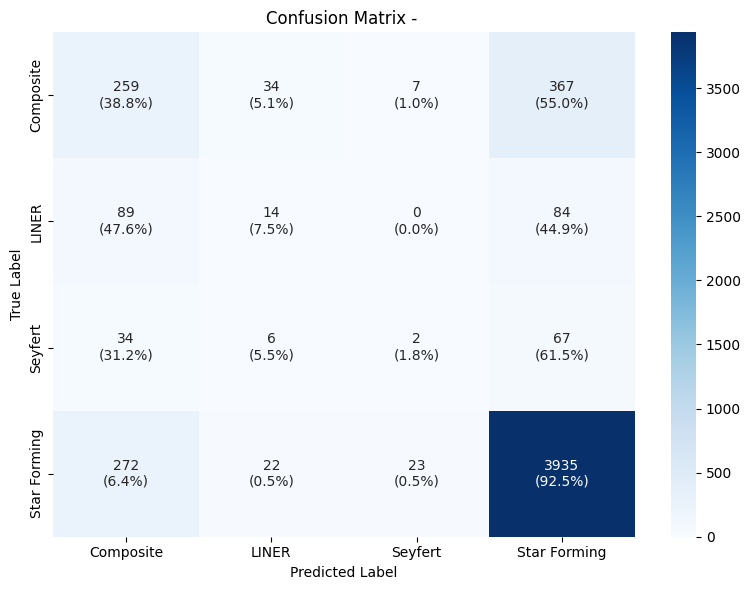

              precision    recall  f1-score   support

   Composite       0.40      0.39      0.39       667
       LINER       0.18      0.07      0.11       187
     Seyfert       0.06      0.02      0.03       109
Star Forming       0.88      0.93      0.90      4252

    accuracy                           0.81      5215
   macro avg       0.38      0.35      0.36      5215
weighted avg       0.78      0.81      0.79      5215



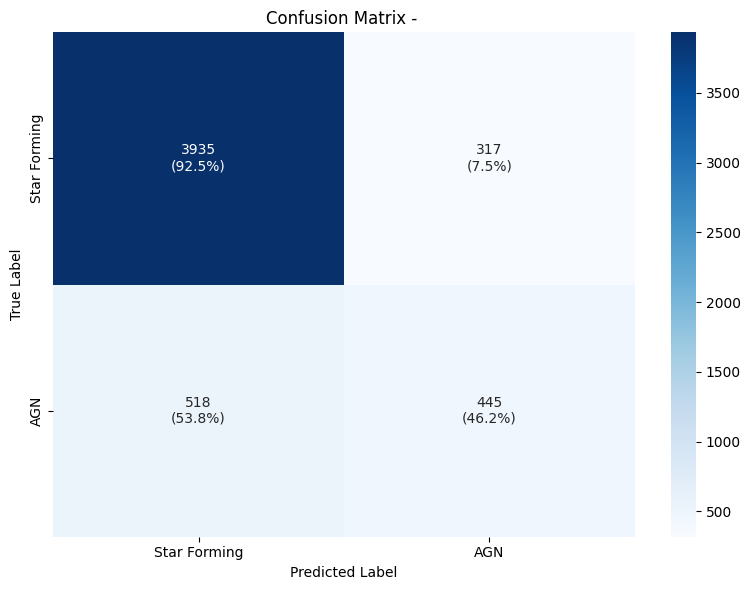

              precision    recall  f1-score   support

Star Forming       0.88      0.93      0.90      4252
         AGN       0.58      0.46      0.52       963

    accuracy                           0.84      5215
   macro avg       0.73      0.69      0.71      5215
weighted avg       0.83      0.84      0.83      5215



In [ ]:
mrf_pred3 = meta_clf.predict(pred3)

cm = confusion_matrix(y_test_allc, mrf_pred3)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, mrf_pred3, target_names=class_names))


binary_y_true, mrf_pred3b = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, mrf_pred3b)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, mrf_pred3b, target_names=binary_class_names))

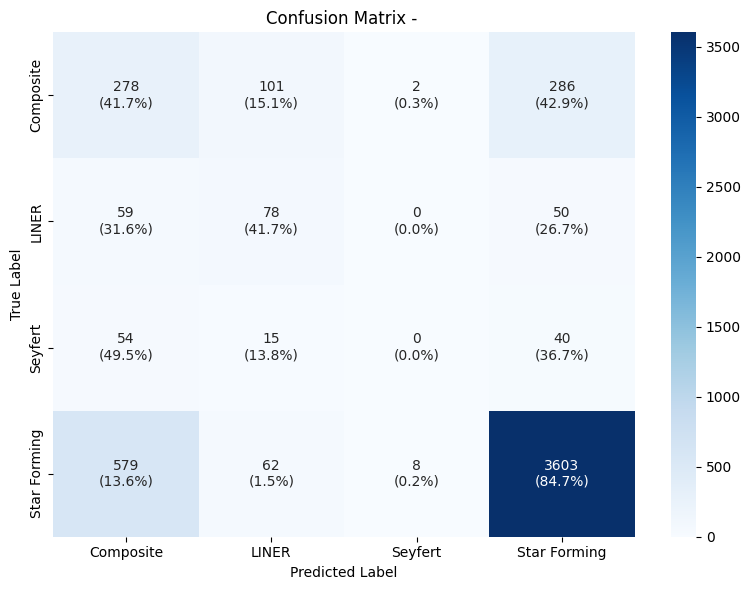

              precision    recall  f1-score   support

   Composite       0.29      0.42      0.34       667
       LINER       0.30      0.42      0.35       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.91      0.85      0.88      4252

    accuracy                           0.76      5215
   macro avg       0.37      0.42      0.39      5215
weighted avg       0.79      0.76      0.77      5215



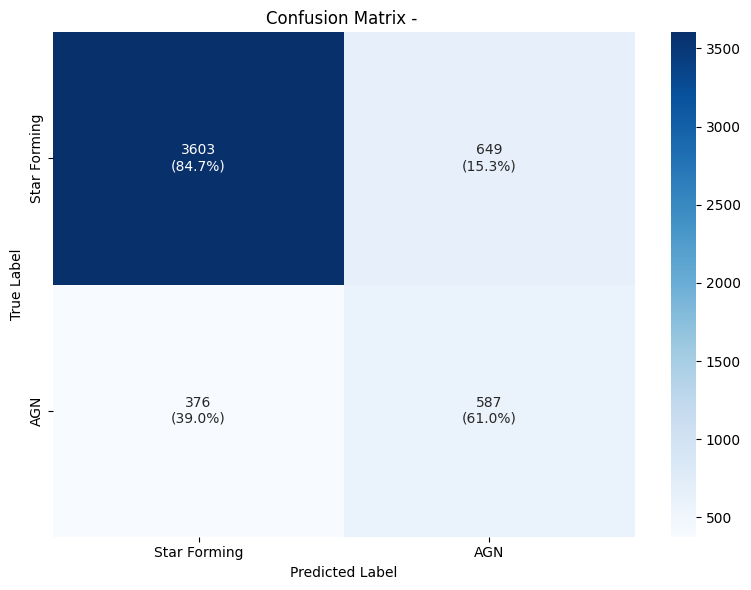

              precision    recall  f1-score   support

Star Forming       0.91      0.85      0.88      4252
         AGN       0.47      0.61      0.53       963

    accuracy                           0.80      5215
   macro avg       0.69      0.73      0.70      5215
weighted avg       0.83      0.80      0.81      5215



In [ ]:
mrf_pred4 = meta_clf.predict(pred4)

cm = confusion_matrix(y_test_allc, mrf_pred4)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, mrf_pred4, target_names=class_names))


binary_y_true, mrf_pred4b = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, mrf_pred4b)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, mrf_pred4b, target_names=binary_class_names))

In [ ]:
print(pred2.shape)
print(y_test_allc.shape)

(5215, 4)
(5215,)


In [ ]:
print(pred2.dtype)
print(y_test_allc.dtype)

float32
int64


In [ ]:
import tensorflow as tf


m = get_classification_model(pred2, [4,4], class_names)

m.compile(
    optimizer="adam",
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=['Precision', 'Recall']
)

In [ ]:
y_test_allc_onehot = tf.keras.utils.to_categorical(y_test_allc, num_classes=4)

h = m.fit(pred2, y_test_allc_onehot, epochs=10, batch_size=32)

Epoch 1/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - Precision: 0.0000e+00 - Recall: 0.0000e+00 - loss: 1.3251
Epoch 2/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - Precision: 0.4114 - Recall: 0.1226 - loss: 0.9644
Epoch 3/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Precision: 0.8221 - Recall: 0.8221 - loss: 0.6460
Epoch 4/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Precision: 0.8145 - Recall: 0.8145 - loss: 0.6301
Epoch 5/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - Precision: 0.8063 - Recall: 0.8063 - loss: 0.6233
Epoch 6/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - Precision: 0.8116 - Recall: 0.8116 - loss: 0.6107
Epoch 7/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - Precision: 0.8250 - Recall: 0.8250 - loss: 0.5600
Epoch 8/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - Precision: 0.8199 - Recall: 0.8199 - loss: 0.5556
Epoch 9/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - Precision: 0.8246 - Recall: 0.8223 - loss: 0.5342
Epoch 10/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - P

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


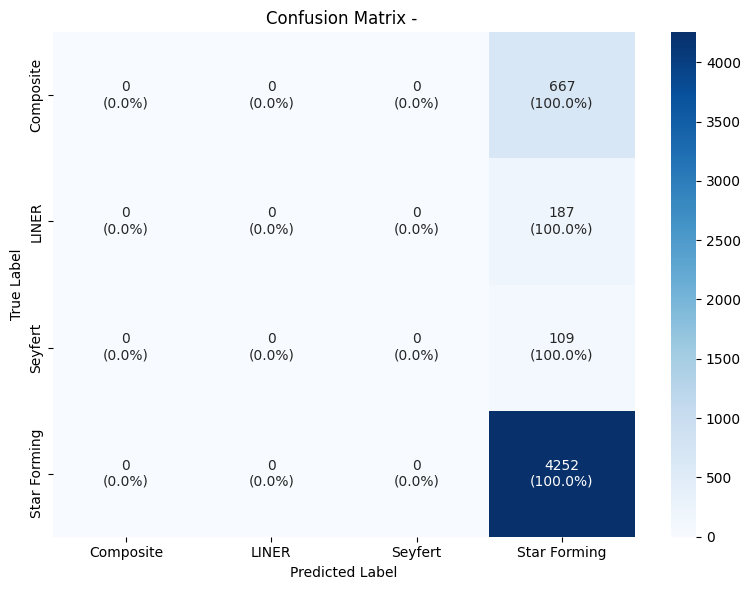

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.00      0.00      0.00       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.82      1.00      0.90      4252

    accuracy                           0.82      5215
   macro avg       0.20      0.25      0.22      5215
weighted avg       0.66      0.82      0.73      5215



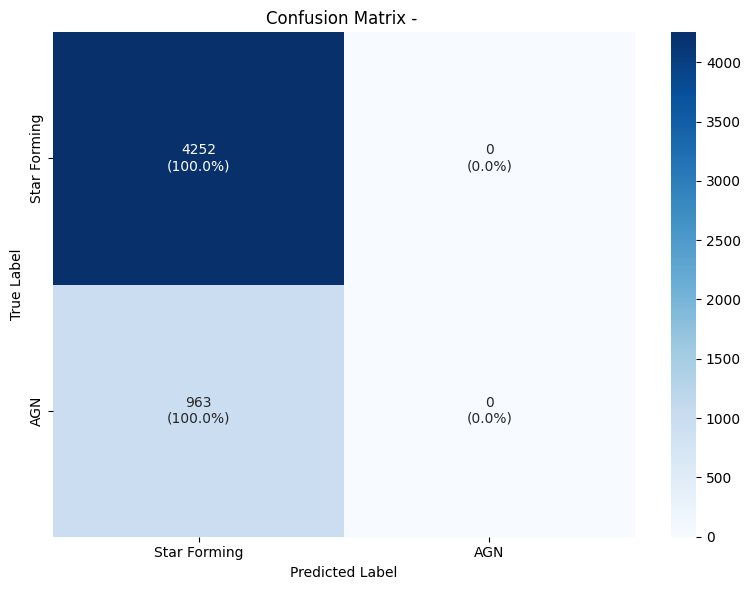

              precision    recall  f1-score   support

Star Forming       0.82      1.00      0.90      4252
         AGN       0.00      0.00      0.00       963

    accuracy                           0.82      5215
   macro avg       0.41      0.50      0.45      5215
weighted avg       0.66      0.82      0.73      5215



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
m_pred1 = m.predict(pred1)
m_pred1 = np.argmax(m_pred1, axis=1)

cm = confusion_matrix(y_test_allc, m_pred1)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, m_pred1, target_names=class_names))


binary_y_true, m_pred1b = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, m_pred1b)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, m_pred1b, target_names=binary_class_names))

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


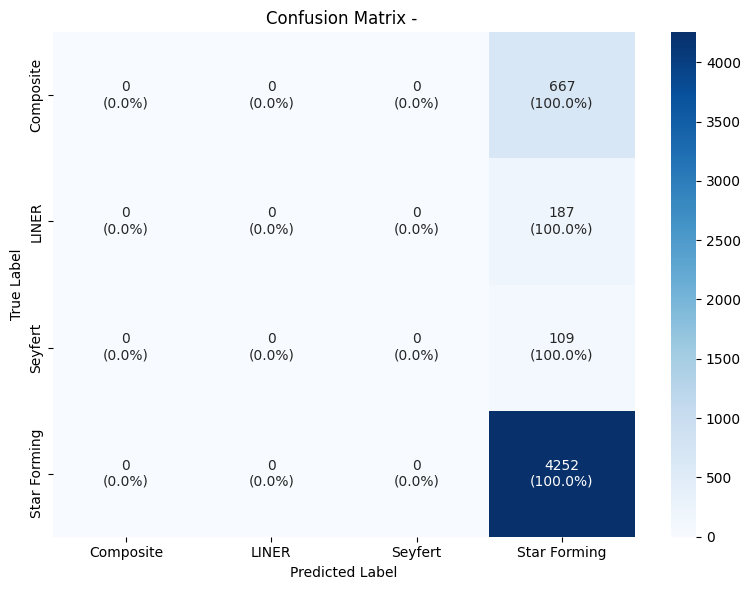

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.00      0.00      0.00       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.82      1.00      0.90      4252

    accuracy                           0.82      5215
   macro avg       0.20      0.25      0.22      5215
weighted avg       0.66      0.82      0.73      5215



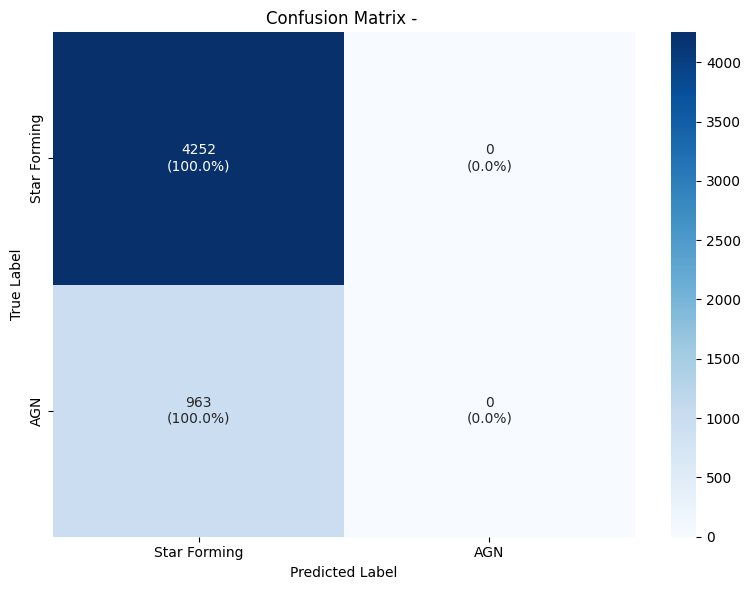

              precision    recall  f1-score   support

Star Forming       0.82      1.00      0.90      4252
         AGN       0.00      0.00      0.00       963

    accuracy                           0.82      5215
   macro avg       0.41      0.50      0.45      5215
weighted avg       0.66      0.82      0.73      5215



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
m_pred3 = m.predict(pred3)
m_pred3 = np.argmax(m_pred3, axis=1)

cm = confusion_matrix(y_test_allc, m_pred3)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, m_pred3, target_names=class_names))


binary_y_true, m_pred3b = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, m_pred3b)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, m_pred3b, target_names=binary_class_names))

163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


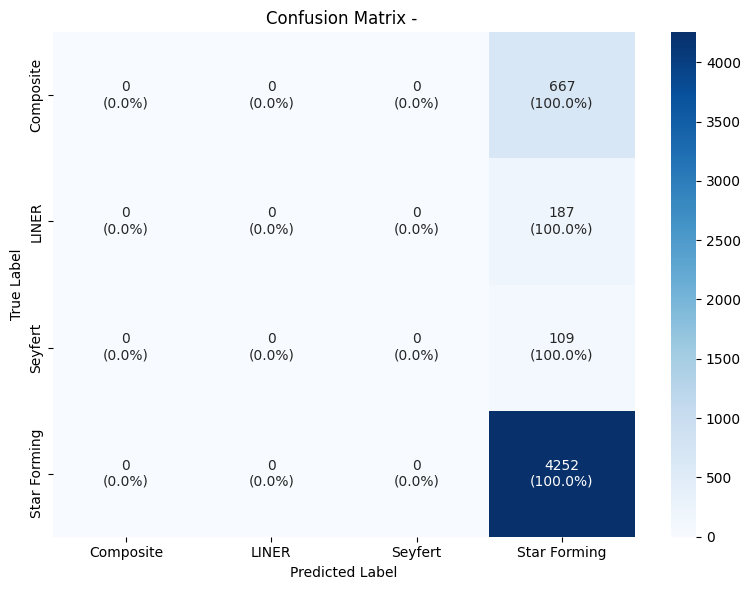

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.00      0.00      0.00       667
       LINER       0.00      0.00      0.00       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.82      1.00      0.90      4252

    accuracy                           0.82      5215
   macro avg       0.20      0.25      0.22      5215
weighted avg       0.66      0.82      0.73      5215



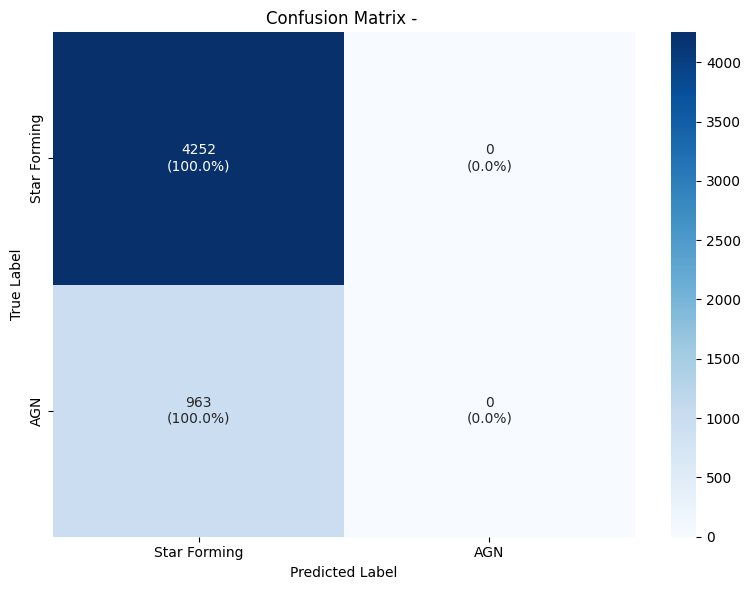

              precision    recall  f1-score   support

Star Forming       0.82      1.00      0.90      4252
         AGN       0.00      0.00      0.00       963

    accuracy                           0.82      5215
   macro avg       0.41      0.50      0.45      5215
weighted avg       0.66      0.82      0.73      5215



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
m_pred4 = m.predict(pred4)
m_pred4 = np.argmax(m_pred4, axis=1)

cm = confusion_matrix(y_test_allc, m_pred4)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, m_pred4, target_names=class_names))


binary_y_true, m_pred4b = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, m_pred4b)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, m_pred4b, target_names=binary_class_names))

In [ ]:
!pip install optuna

In [ ]:
def objective(trial):

  rules = []
  for i in range(4):  # 4 classes
      class_rules = []
      for j in range(4):  # 4 thresholds per class
          thr = trial.suggest_float(f"thr_{i}_{j}", 0.0, 1.0)  # search range
          sign = threshold_rules[i][j][1]  # keep sign fixed
          class_rules.append((thr, sign))
      rules.append(class_rules)

  tpred1 = predict_with_thresholds(pred1, rules)
  tpred2 = predict_with_thresholds(pred2, rules)
  tpred3 = predict_with_thresholds(pred3, rules)
  #tpred4 = apply_thresholds(pred4, rules)

  #tpred1 = np.array(tpred1)
  tpred2 = np.array(tpred2)
  #tpred3 = np.array(tpred3)
  #tpred4 = np.array(tpred4)
  y_true = np.array(binary_y_test_allc)

  #btpred1 = np.where((tpred1 == 3), 0, 1)
  btpred2 = np.where((tpred2 == 3), 0, 1)
  #btpred3 = np.where((tpred3 == 3), 0, 1)
  #btpred4 = np.where((tpred4 == 3), 0, 1)

  #p1 = precision_score(binary_y_test_allc, btpred1, pos_label=1)
  p2 = precision_score(binary_y_test_allc, btpred2, pos_label=1)
  #p3 = precision_score(binary_y_test_allc, btpred3, pos_label=1)
  #p4 = precision_score(binary_y_test_allc, btpred4, pos_label=1)
  #r = recall_score(binary_y_test_allc, binary_pred, pos_label=1)
  #f1 = f1_score(y_true, binary_pred, pos_label=1)

  #score = (p1 + p2 +p3)/3

  return p2


In [ ]:
import optuna

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

print("Best precision:", study.best_value)
print("Best thresholds:", study.best_params)

[I 2025-07-30 12:57:41,145] A new study created in memory with name: no-name-f17537f4-24e4-4145-b411-71e32c5b65ea
[I 2025-07-30 12:57:41,398] Trial 0 finished with value: 0.045037292025243834 and parameters: {'thr_0_0': 0.5956155764345569, 'thr_0_1': 0.49449452601106525, 'thr_0_2': 0.10449691806169459, 'thr_0_3': 0.8652280079810601, 'thr_1_0': 0.7616031633470486, 'thr_1_1': 0.5197146982464127, 'thr_1_2': 0.6903229638711833, 'thr_1_3': 0.31728206457408314, 'thr_2_0': 0.05623922641695067, 'thr_2_1': 0.2727778827639855, 'thr_2_2': 0.8240695920451738, 'thr_2_3': 0.08522620299047423, 'thr_3_0': 0.06008109824252239, 'thr_3_1': 0.387228601746894, 'thr_3_2': 0.3217581994726658, 'thr_3_3': 0.444429429714879}. Best is trial 0 with value: 0.045037292025243834.
[I 2025-07-30 12:57:42,174] Trial 1 finished with value: 0.891566265060241 and parameters: {'thr_0_0': 0.5488871795075542, 'thr_0_1': 0.08828769707779072, 'thr_0_2': 0.027686829117946843, 'thr_0_3': 0.5756526624607207, 'thr_1_0': 0.66690898

Best precision: 0.95
Best thresholds: {'thr_0_0': 0.1648202538385019, 'thr_0_1': 0.6241895616061116, 'thr_0_2': 0.8144484573321233, 'thr_0_3': 0.7370759096131956, 'thr_1_0': 0.9379572050761289, 'thr_1_1': 0.22052739602319107, 'thr_1_2': 0.03581006788406063, 'thr_1_3': 0.5644926271627703, 'thr_2_0': 0.6003832466723875, 'thr_2_1': 0.7263093716808721, 'thr_2_2': 0.5511376263931611, 'thr_2_3': 0.6723842617951805, 'thr_3_0': 0.6384918711180481, 'thr_3_1': 0.7510403101285407, 'thr_3_2': 0.5820411923390595, 'thr_3_3': 0.24360240761755605}


In [ ]:
best_params = study.best_params

optimized_threshold_rules = []
for i in range(4):  # for each class
    class_rules = []
    for j in range(4):  # each threshold per class
        thr = round(best_params[f"thr_{i}_{j}"], 3)
        sign = threshold_rules[i][j][1]  # keep the original sign
        class_rules.append((thr, sign))
    optimized_threshold_rules.append(class_rules)

for idx, rules in enumerate(optimized_threshold_rules):
    print(f"Class {idx}: {rules}")

Class 0: [(0.165, 1), (0.624, 1), (0.814, 1), (0.737, -1)]
Class 1: [(0.938, 1), (0.221, 1), (0.036, 1), (0.564, -1)]
Class 2: [(0.6, 1), (0.726, 1), (0.551, 1), (0.672, -1)]
Class 3: [(0.638, -1), (0.751, -1), (0.582, -1), (0.244, 1)]


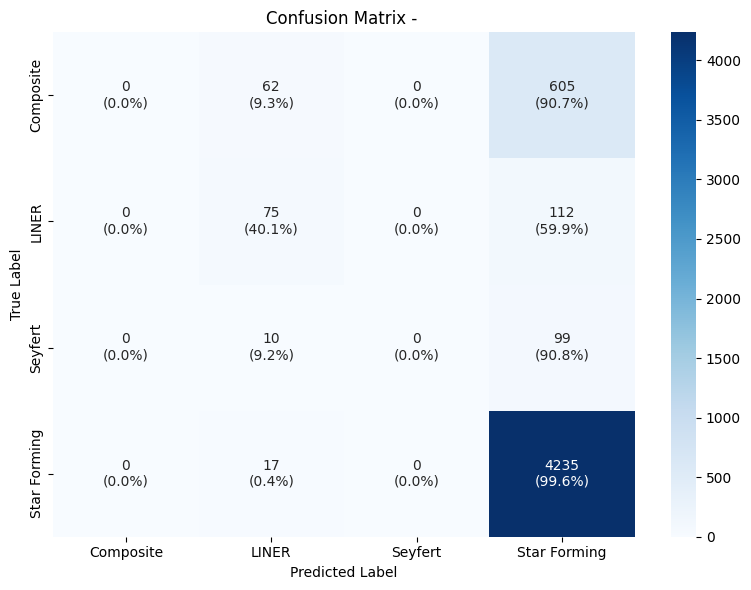

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.00      0.00      0.00       667
       LINER       0.46      0.40      0.43       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.84      1.00      0.91      4252

    accuracy                           0.83      5215
   macro avg       0.32      0.35      0.33      5215
weighted avg       0.70      0.83      0.76      5215



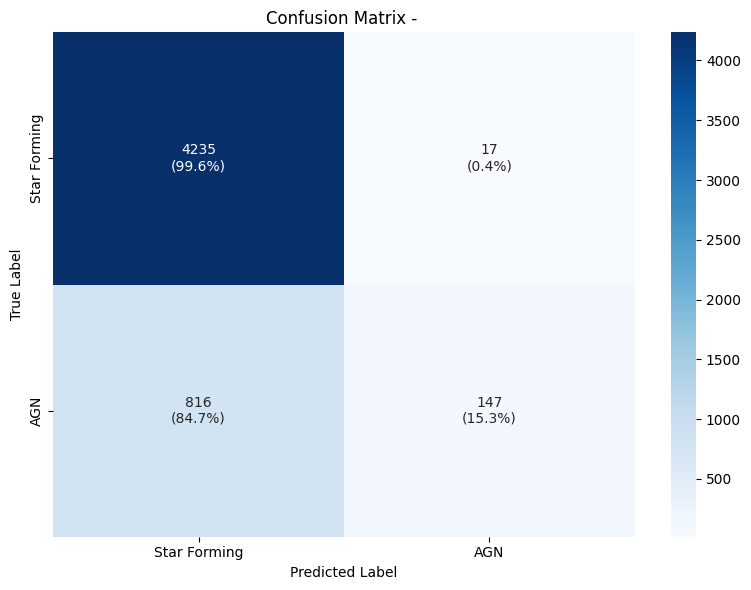

              precision    recall  f1-score   support

Star Forming       0.84      1.00      0.91      4252
         AGN       0.90      0.15      0.26       963

    accuracy                           0.84      5215
   macro avg       0.87      0.57      0.59      5215
weighted avg       0.85      0.84      0.79      5215



In [ ]:
tpred1 = predict_with_thresholds(pred1, optimized_threshold_rules)

cm = confusion_matrix(y_test_allc, tpred1)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, tpred1, target_names=class_names))


binary_y_true, binary_tpred1 = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred1)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred1, target_names=binary_class_names))

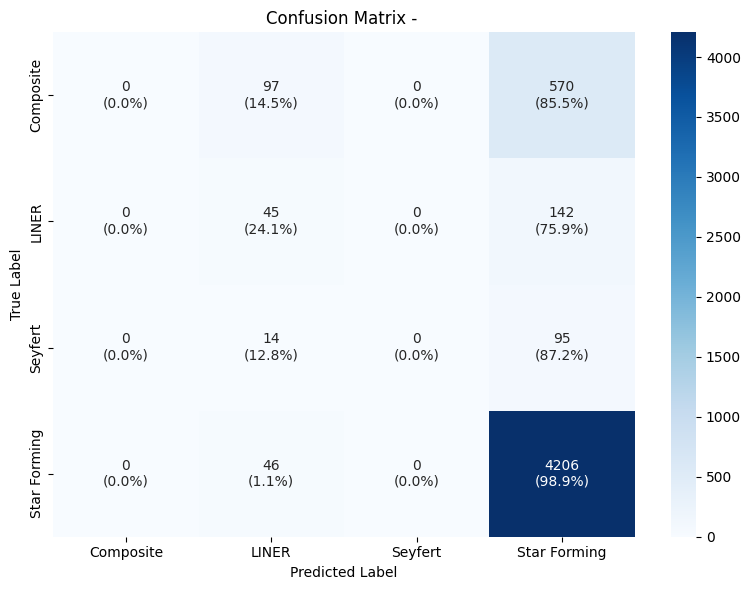

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.00      0.00      0.00       667
       LINER       0.22      0.24      0.23       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.84      0.99      0.91      4252

    accuracy                           0.82      5215
   macro avg       0.27      0.31      0.28      5215
weighted avg       0.69      0.82      0.75      5215



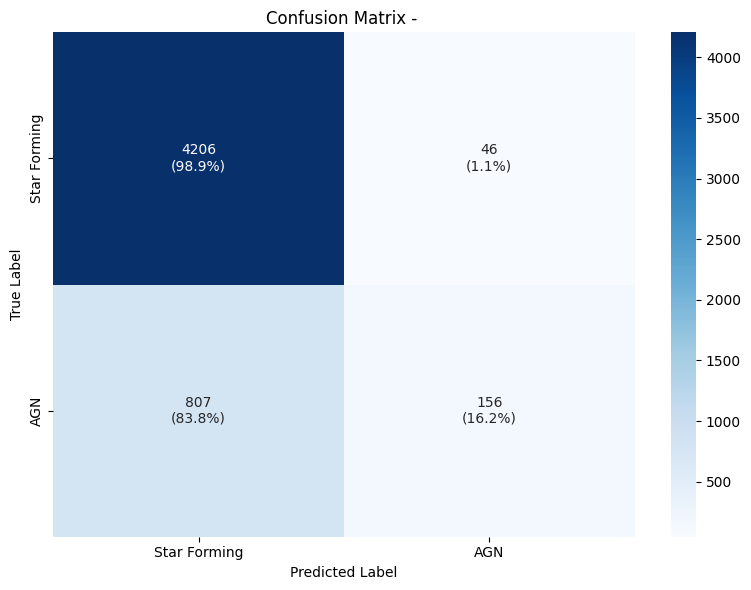

              precision    recall  f1-score   support

Star Forming       0.84      0.99      0.91      4252
         AGN       0.77      0.16      0.27       963

    accuracy                           0.84      5215
   macro avg       0.81      0.58      0.59      5215
weighted avg       0.83      0.84      0.79      5215



In [ ]:
tpred3 = predict_with_thresholds(pred3, optimized_threshold_rules)

cm = confusion_matrix(y_test_allc, tpred3)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, tpred3, target_names=class_names))


binary_y_true, binary_tpred3 = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred3)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred3, target_names=binary_class_names))

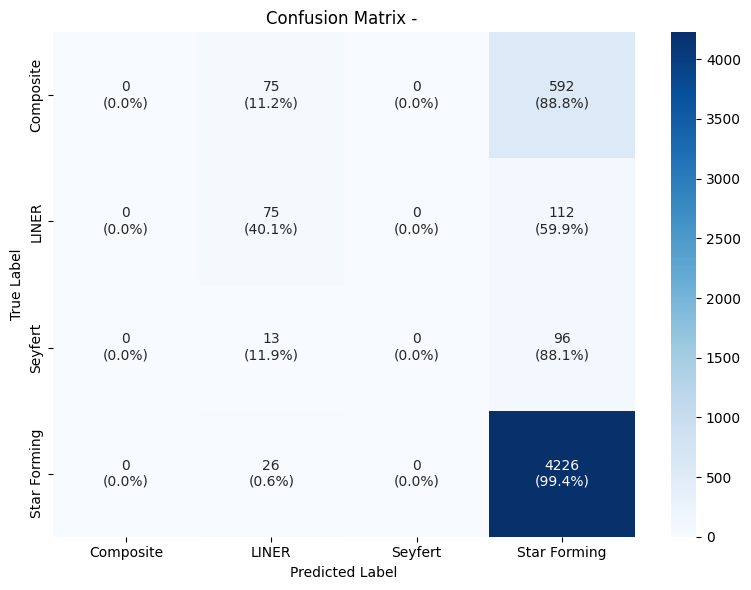

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Composite       0.00      0.00      0.00       667
       LINER       0.40      0.40      0.40       187
     Seyfert       0.00      0.00      0.00       109
Star Forming       0.84      0.99      0.91      4252

    accuracy                           0.82      5215
   macro avg       0.31      0.35      0.33      5215
weighted avg       0.70      0.82      0.76      5215



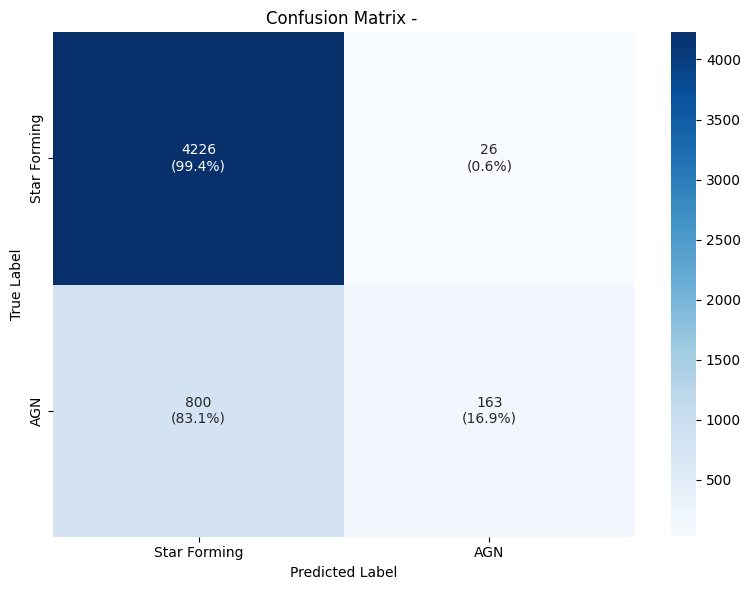

              precision    recall  f1-score   support

Star Forming       0.84      0.99      0.91      4252
         AGN       0.86      0.17      0.28       963

    accuracy                           0.84      5215
   macro avg       0.85      0.58      0.60      5215
weighted avg       0.84      0.84      0.80      5215



In [ ]:
tpred4 = predict_with_thresholds(pred4, optimized_threshold_rules)

cm = confusion_matrix(y_test_allc, tpred4)
plot_confusion_matrix(cm, class_names)
print(classification_report(y_test_allc, tpred4, target_names=class_names))


binary_y_true, binary_tpred4 = merge_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred4)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred4, target_names=binary_class_names))

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def classify_whan(df, ha_flux_col, nii_flux_col, wha_col):
    df = df.copy()

    # Compute log([NII]/Hα)
    df['log_NII_Ha'] = np.log10(df[nii_flux_col] / df[ha_flux_col])

    # Initialize classification
    conditions = [
        (df[wha_col] > 6) & (df['log_NII_Ha'] >= -0.4),
        (df[wha_col] > 3) & (df[wha_col] <= 6) & (df['log_NII_Ha'] >= -0.4),
        (df[wha_col] > 3) & (df['log_NII_Ha'] < -0.4),
        (df[wha_col] <= 3) & (df[wha_col] > 0.5),
        (df[wha_col] <= 0.5)
    ]
    labels = ['sAGN', 'wAGN', 'Star-forming', 'Retired', 'Retired']
    df['WHaN_class'] = np.select(conditions, labels, default='Retired')

    return df

In [ ]:
whan_df = classify_whan(raw_df, ha_flux_col='Flux_Ha_6562_', nii_flux_col='Flux_NII_6583_', wha_col='EW_Ha_6562_')


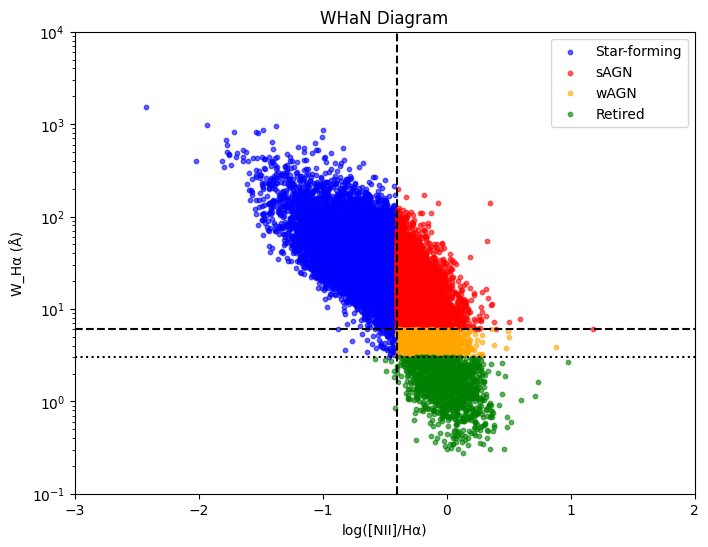

In [ ]:
plt.figure(figsize=(8,6))
for label, color in zip(['Star-forming', 'sAGN', 'wAGN', 'Retired'],
                        ['blue', 'red', 'orange', 'green', 'gray']):
    subset = whan_df[whan_df['WHaN_class'] == label]
    plt.scatter(subset['log_NII_Ha'], subset['EW_Ha_6562_'], label=label, s=10, alpha=0.6, c=color)

plt.axvline(-0.4, color='k', linestyle='--')
plt.axhline(6, color='k', linestyle='--')
plt.axhline(3, color='k', linestyle=':')
plt.yscale('log')
plt.ylim(10**-1, 10**4)
plt.xlabel('log([NII]/Hα)')
plt.xlim(-3,2)
plt.ylabel('W_Hα (Å)')
plt.legend()
plt.title('WHaN Diagram')
plt.show()


In [ ]:
whan_labels_df = whan_df['WHaN_class']

# Encode and one-hot in one go
label_encoder = LabelEncoder()
whan_labels = label_encoder.fit_transform(whan_labels_df)

# Get class names, Important for graphs and reports
whan_class_names = label_encoder.classes_
binary_whan_classes = ["Non-AGN", "AGN"]

# Percentages as a one-row DataFrame
percentage_df = pd.DataFrame([np.bincount(whan_labels) / len(whan_labels) * 100])
print(percentage_df)

          0          1          2         3
0  4.383452  69.262541  22.370262  3.983745


In [ ]:
mask = ~(filters_df == 99).any(axis=1)  # True for rows without any 99s

whan_labels = whan_labels[mask]

In [ ]:
binary_whan_class_names = ["Non-AGN", "AGN"]

In [ ]:
binary_whan_class_names

In [ ]:
percentage_df = pd.DataFrame([np.bincount(whan_labels) / len(whan_labels) * 100])
print(percentage_df)

          0          1          2         3
0  4.710034  69.235195  21.916232  4.138539


In [ ]:
print(len(whan_labels))
print(len(combined_filters))

26072
26072


In [ ]:
w_train_X, w_test_X, w_train_y, w_test_y = train_test_split(combined_filters, whan_labels, test_size=0.2, random_state=42)

In [ ]:
import keras_tuner as kt

w_models = []

for i in range(4):
  hp = kt.HyperParameters()
  hp.values = hp_values[i]
  model = build_model(hp)
  w_models.append(model)
  #model.summary()

In [ ]:
histories = []

for i in range(4):
  history = models[i].fit(w_train_X, w_train_y, epochs=10, batch_size=32, validation_split = 0.2)
  histories.append(history)

Epoch 1/10
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.7697 - loss: 0.2565 - val_accuracy: 0.7744 - val_loss: 0.2470
Epoch 2/10
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7639 - loss: 0.2542 - val_accuracy: 0.7802 - val_loss: 0.2385
Epoch 3/10
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7710 - loss: 0.2460 - val_accuracy: 0.7802 - val_loss: 0.2386
Epoch 4/10
522/522 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.7684 - loss: 0.2551 - val_accuracy: 0.7792 - val_loss: 0.2412
Epoch 5/10
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7659 - loss: 0.2534 - val_accuracy: 0.7771 - val_loss: 0.2435
Epoch 6/10
522/522 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.7654 - loss: 0.2511 - val_accuracy: 0.7809 - val_loss: 0.2415
Epoch 7/10
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7658 - loss: 0.2452 - val_accuracy: 0.7800 - val_loss: 0.2423
Epoch 8/10
522/522 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7699 - loss: 0.2544 - val_accuracy: 0

In [ ]:
def merge_whan_agn_classes(conf_matrix):
    """
    Merges a 4-class confusion matrix into binary:
    Class 0 & 2 -> AGN
    Class 1 & 3 -> Non-AGN
    Returns y_true and y_pred for binary classification.
    """
    if conf_matrix.shape != (4, 4):
        raise ValueError("Expected a 4x4 confusion matrix.")

    # Define indices
    agn_idx = [0, 2]
    nonagn_idx = [1, 3]

    # Extract rows
    agn_rows = conf_matrix[agn_idx, :]
    nonagn_rows = conf_matrix[nonagn_idx, :]

    # True Non-AGN
    nonagn_true_nonagn = conf_matrix[nonagn_idx, :][:, nonagn_idx].sum()
    nonagn_true_agn    = conf_matrix[nonagn_idx, :][:, agn_idx].sum()

    # True AGN
    agn_true_nonagn = conf_matrix[agn_idx, :][:, nonagn_idx].sum()
    agn_true_agn    = conf_matrix[agn_idx, :][:, agn_idx].sum()

    # Build binary true/pred arrays
    y_true = [0] * (nonagn_true_nonagn + nonagn_true_agn) + [1] * (agn_true_nonagn + agn_true_agn)
    y_pred = [0] * nonagn_true_nonagn + [1] * nonagn_true_agn + [0] * agn_true_nonagn + [1] * agn_true_agn

    return y_true, y_pred


163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


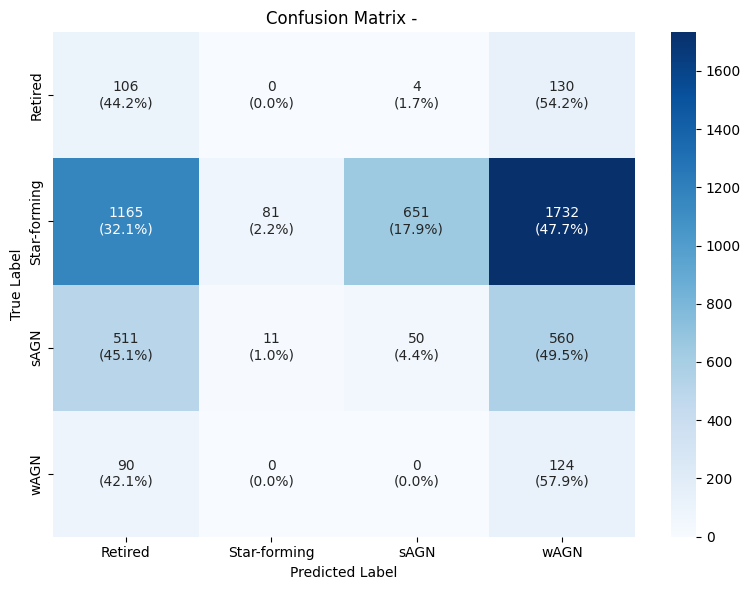

              precision    recall  f1-score   support

     Retired       0.06      0.44      0.10       240
Star-forming       0.88      0.02      0.04      3629
        sAGN       0.07      0.04      0.05      1132
        wAGN       0.05      0.58      0.09       214

    accuracy                           0.07      5215
   macro avg       0.26      0.27      0.07      5215
weighted avg       0.63      0.07      0.05      5215



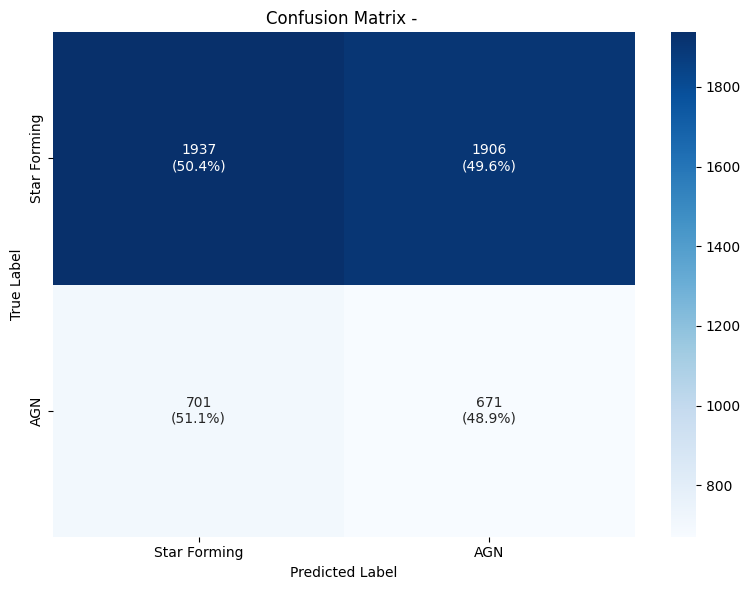

              precision    recall  f1-score   support

     Non-AGN       0.73      0.50      0.60      3843
         AGN       0.26      0.49      0.34      1372

    accuracy                           0.50      5215
   macro avg       0.50      0.50      0.47      5215
weighted avg       0.61      0.50      0.53      5215



In [ ]:
w_pred1 = w_models[0].predict(w_test_X)
w_pred1 = np.argmax(w_pred1, axis=1)

cm = confusion_matrix(w_test_y, w_pred1)
plot_confusion_matrix(cm, whan_class_names)
print(classification_report(w_test_y, w_pred1, target_names=class_names))


binary_y_true, binary_tpred1 = merge_whan_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred1)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred1, target_names=binary_whan_class_names))

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


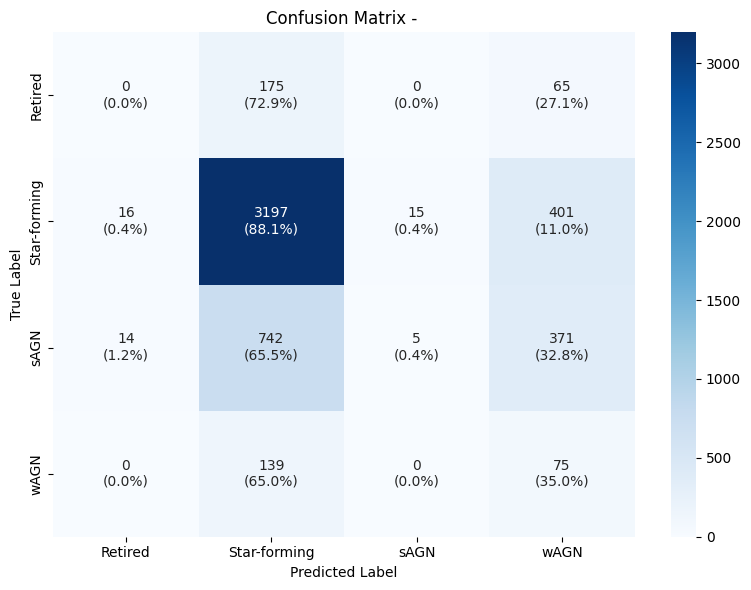

              precision    recall  f1-score   support

     Retired       0.00      0.00      0.00       240
Star-forming       0.75      0.88      0.81      3629
        sAGN       0.25      0.00      0.01      1132
        wAGN       0.08      0.35      0.13       214

    accuracy                           0.63      5215
   macro avg       0.27      0.31      0.24      5215
weighted avg       0.58      0.63      0.57      5215



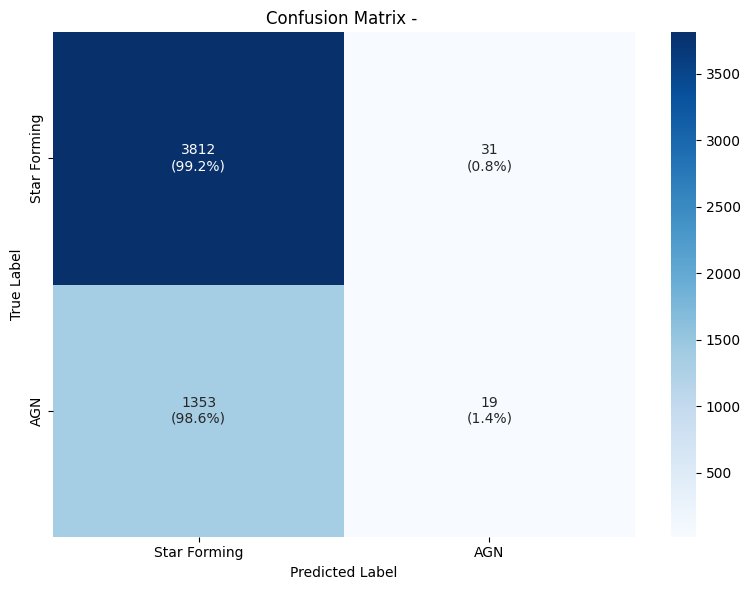

              precision    recall  f1-score   support

     Non-AGN       0.74      0.99      0.85      3843
         AGN       0.38      0.01      0.03      1372

    accuracy                           0.73      5215
   macro avg       0.56      0.50      0.44      5215
weighted avg       0.64      0.73      0.63      5215



In [ ]:
w_pred2 = w_models[1].predict(w_test_X)
w_pred2 = np.argmax(w_pred2, axis=1)

cm = confusion_matrix(w_test_y, w_pred2)
plot_confusion_matrix(cm, whan_class_names)
print(classification_report(w_test_y, w_pred2, target_names=class_names))


binary_y_true, binary_tpred2 = merge_whan_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred2)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred2, target_names=binary_whan_class_names))

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


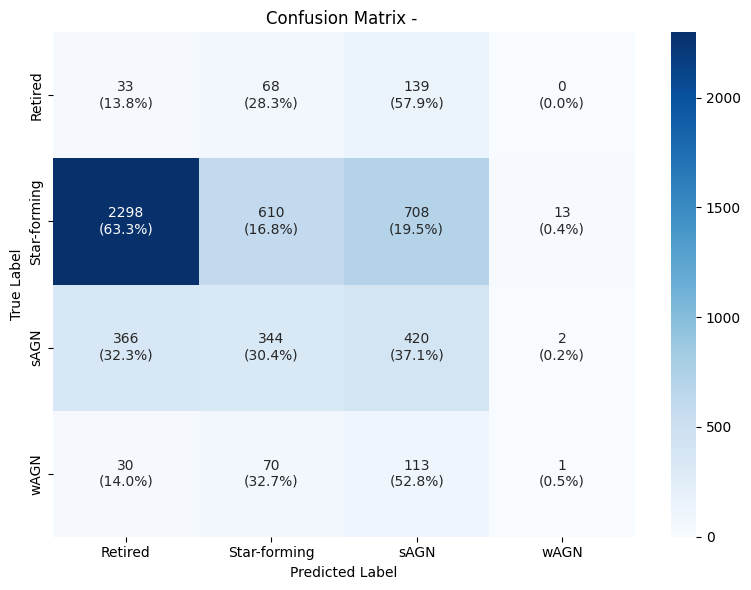

              precision    recall  f1-score   support

     Retired       0.01      0.14      0.02       240
Star-forming       0.56      0.17      0.26      3629
        sAGN       0.30      0.37      0.33      1132
        wAGN       0.06      0.00      0.01       214

    accuracy                           0.20      5215
   macro avg       0.23      0.17      0.16      5215
weighted avg       0.46      0.20      0.25      5215



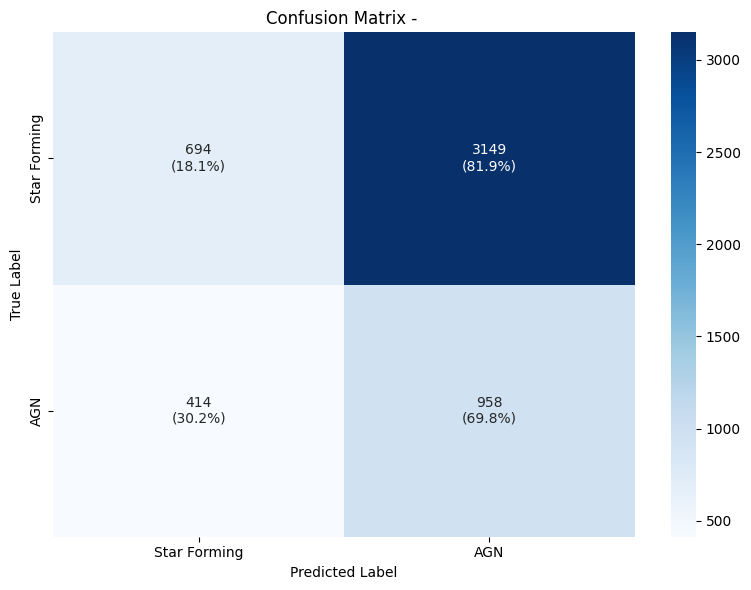

              precision    recall  f1-score   support

     Non-AGN       0.63      0.18      0.28      3843
         AGN       0.23      0.70      0.35      1372

    accuracy                           0.32      5215
   macro avg       0.43      0.44      0.32      5215
weighted avg       0.52      0.32      0.30      5215



In [ ]:
w_pred3 = w_models[2].predict(w_test_X)
w_pred3 = np.argmax(w_pred3, axis=1)

cm = confusion_matrix(w_test_y, w_pred3)
plot_confusion_matrix(cm, whan_class_names)
print(classification_report(w_test_y, w_pred3, target_names=class_names))


binary_y_true, binary_tpred3 = merge_whan_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred3)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred3, target_names=binary_whan_class_names))

163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


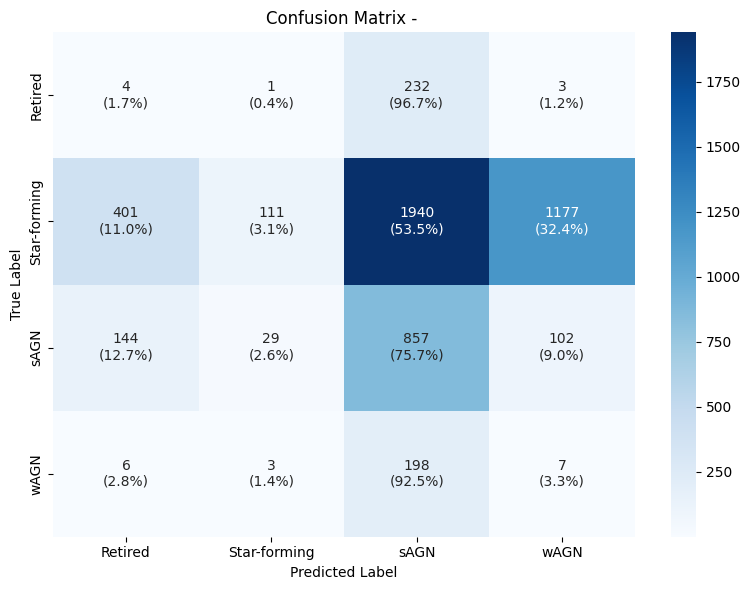

              precision    recall  f1-score   support

     Retired       0.01      0.02      0.01       240
Star-forming       0.77      0.03      0.06      3629
        sAGN       0.27      0.76      0.39      1132
        wAGN       0.01      0.03      0.01       214

    accuracy                           0.19      5215
   macro avg       0.26      0.21      0.12      5215
weighted avg       0.59      0.19      0.13      5215



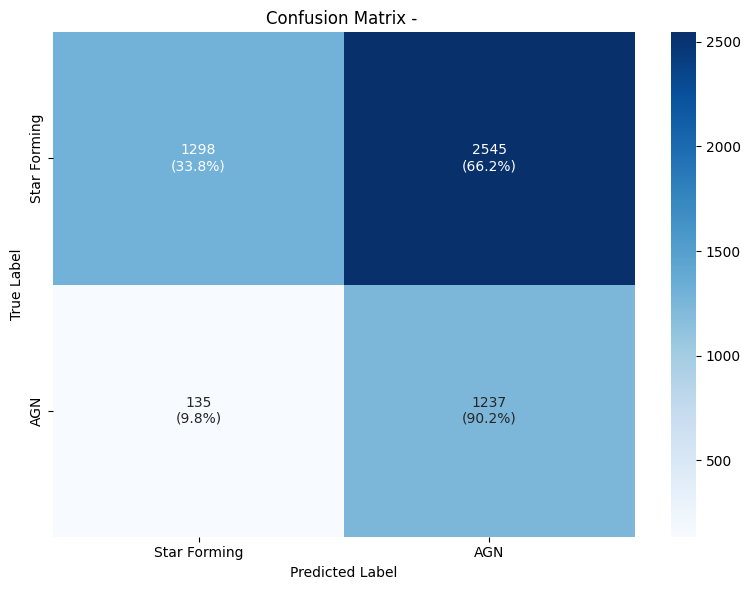

              precision    recall  f1-score   support

     Non-AGN       0.91      0.34      0.49      3843
         AGN       0.33      0.90      0.48      1372

    accuracy                           0.49      5215
   macro avg       0.62      0.62      0.49      5215
weighted avg       0.75      0.49      0.49      5215



In [ ]:
w_pred4 = w_models[3].predict(w_test_X)
w_pred4 = np.argmax(w_pred4, axis=1)

cm = confusion_matrix(w_test_y, w_pred4)
plot_confusion_matrix(cm, whan_class_names)
print(classification_report(w_test_y, w_pred4, target_names=class_names))


binary_y_true, binary_tpred4 = merge_whan_agn_classes(cm)
cm = confusion_matrix(binary_y_true, binary_tpred4)
plot_confusion_matrix(cm, binary_class_names)
print(classification_report(binary_y_true, binary_tpred4, target_names=binary_whan_class_names))